# ROCCO PLICHON - 64874 - EDHEC Business School - Msc DAAI

# SOUTENANCE ORALE :

# PART 1 - Focus AMERIQUE DU SUD :

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from scipy import stats
import seaborn as sns 
import sys
import missingno


from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.ensemble import RandomForestRegressor

from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score


import statsmodels.api as sm
import patsy
import scipy.stats as stats
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV, ElasticNet, ElasticNetCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

On va garder que les Top 5 Champoionnats Latino Américains :
- Brésil – Série A (Brasileirão)
- Argentine – Primera División
- Colombie – Categoría Primera A
- Uruguay – Primera División
- Chili – Primera División


## Merge the Datasets :

## FIFA 23 :

In [2]:
data_23 = pd.read_excel('data_fifa_23.xlsx')
data_23.head()

,player_id,player_url,fifa_version,fifa_update,update_as_of,short_name,long_name,player_positions,overall,potential,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,1179,/player/1179/gianluigi-buffon/230002,23,2,2022-09-26,G. Buffon,Gianluigi Buffon,GK,79,79,...,32+3,32+3,32+3,27+3,26+3,28+3,28+3,28+3,26+3,78+1
1,2147,/player/2147/maarten-stekelenburg/230002,23,2,2022-09-26,M. Stekelenburg,Maarten Stekelenburg,GK,74,74,...,32+2,32+2,32+2,27+2,26+2,29+2,29+2,29+2,26+2,73+1
2,3467,/player/3467/yuri-de-souza-fonseca/230002,23,2,2022-09-26,Yuri,Yuri de Souza Fonseca,ST,72,72,...,52+2,52+2,52+2,52+2,49+2,49+2,49+2,49+2,49+2,15+2
3,18115,/player/18115/ruben-miguel-santos-fernandes/23...,23,2,2022-09-26,Rúben Fernandes,Rúben Miguel Marques dos Santos Fernandes,CB,71,71,...,69+2,69+2,69+2,66+2,68+2,71,71,71,68+2,18+2
4,18122,/player/18122/nicolas-penneteau/230002,23,2,2022-09-26,N. Penneteau,Nicolas Penneteau,GK,67,67,...,28+2,28+2,28+2,24+2,23+2,27+2,27+2,27+2,23+2,66+1


In [9]:
# Liste des clubs sélectionnés pour "Serie A"
clubs_serie_a = ["Fortaleza", "Corinthians", "Bragantino", "América Mineiro", 
                 "Cuiabá", "Palmeiras", "Internacional", "Ceará", "Santos"]

# Filtrage des données
filtered_data_23 = data_23[
    (data_23['league_name'].isin(["Primera Division", "Primera División"])) |
    ((data_23['league_name'] == "Serie A") & (data_23['club_name'].isin(clubs_serie_a)))
]

# Affichage des résultats filtrés
filtered_data_23

,player_id,player_url,fifa_version,fifa_update,update_as_of,short_name,long_name,player_positions,overall,potential,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
8,25798,/player/25798/roque-santa-cruz/230002,23,2,2022-09-26,R. Santa Cruz,Roque Luis Santa Cruz Cantero,ST,71,71,...,49+2,49+2,49+2,45+2,44+2,49+2,49+2,49+2,44+2,14+2
47,138949,/player/138949/antolin-alcaraz/230002,23,2,2022-09-26,A. Alcáraz,Antolín Alcáraz Viveros,CB,71,71,...,65+2,65+2,65+2,60+2,62+2,71,71,71,62+2,18+2
134,158133,/player/158133/jefferson-farfan/230002,23,2,2022-09-26,J. Farfán,Jefferson Agustín Farfán Guadalupe,"CAM, ST, RM",73,73,...,55+2,55+2,55+2,54+2,52+2,52+2,52+2,52+2,52+2,20+2
142,158956,/player/158956/julio-alberto-barroso/230002,23,2,2022-09-26,J. Barroso,Julio Alberto Barroso,CB,73,73,...,70+2,70+2,70+2,67+2,69+2,73,73,73,69+2,18+2
202,165531,/player/165531/ismael-sosa/230002,23,2,2022-09-26,I. Sosa,Víctor Ismael Sosa,"ST, CAM, LW",72,72,...,59+2,59+2,59+2,60+2,58+2,56+2,56+2,56+2,58+2,18+2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18331,271454,/player/271454/alan-paredes/230002,23,2,2022-09-26,A. Paredes,Alan Paredes,LB,64,72,...,59+2,59+2,59+2,62+2,62+2,60+2,60+2,60+2,62+2,17+2
18332,271455,/player/271455/sebastian-quintana/230002,23,2,2022-09-26,S. Quintana,Víctor Sebastián Quintana Herrera,CM,60,71,...,58+2,58+2,58+2,58+2,57+2,56+2,56+2,56+2,57+2,15+2
18435,271621,/player/271621/bruno-recalde/230002,23,2,2022-09-26,B. Recalde,Bruno Recalde,"LW, LM",63,74,...,54+2,54+2,54+2,56+2,53+2,50+2,50+2,50+2,53+2,14+2
18468,271671,/player/271671/oscar-coronel/230002,23,2,2022-09-26,Ó. Coronel,Óscar Coronel,ST,56,72,...,33+2,33+2,33+2,36+2,35+2,32+2,32+2,32+2,35+2,14+2


In [10]:
filtered_data_23.describe()

,player_id,fifa_version,fifa_update,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,...,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
count,1016.000000,1016.0,1016.0,1016.000000,1016.000000,1.014000e+03,1016.000000,1016.000000,1016.000000,1016.000000,...,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,1016.000000,120.000000
mean,244006.786417,23.0,2.0,65.927165,70.274606,1.548580e+06,3348.375984,25.955709,178.237205,75.039370,...,56.312008,45.362205,47.394685,45.549213,16.821850,16.693898,16.581693,16.745079,17.126969,33.800000
std,22895.835851,0.0,0.0,5.204262,4.487792,2.722839e+06,6634.819320,5.350660,6.617177,6.940594,...,11.575075,21.594761,21.961649,21.150261,17.954314,17.419931,17.290141,17.592905,18.326987,10.963346
min,25798.000000,23.0,2.0,52.000000,60.000000,4.500000e+04,500.000000,16.000000,158.000000,57.000000,...,19.000000,5.000000,8.000000,7.000000,2.000000,2.000000,2.000000,2.000000,2.000000,17.000000
25%,230313.750000,23.0,2.0,63.000000,67.000000,5.000000e+05,500.000000,21.000000,174.000000,70.000000,...,49.000000,24.750000,25.000000,23.000000,8.000000,8.000000,8.000000,8.000000,8.000000,25.000000
50%,253540.000000,23.0,2.0,66.000000,70.000000,9.500000e+05,500.000000,26.000000,178.000000,75.000000,...,57.000000,52.000000,58.000000,55.000000,11.000000,11.000000,11.000000,11.000000,11.000000,30.500000
75%,261369.500000,23.0,2.0,69.000000,73.000000,1.600000e+06,2000.000000,30.000000,183.000000,80.000000,...,64.000000,64.000000,66.000000,63.000000,14.000000,14.000000,14.000000,14.000000,14.000000,44.000000
max,271761.000000,23.0,2.0,84.000000,84.000000,3.500000e+07,59000.000000,41.000000,197.000000,98.000000,...,86.000000,83.000000,86.000000,81.000000,81.000000,87.000000,85.000000,83.000000,83.000000,60.000000


## FIFA 24 :

In [3]:
data_24 = pd.read_excel('data_fifa_24.xlsx')
data_24.head()

,player_id,player_url,fifa_version,fifa_update,update_as_of,short_name,long_name,player_positions,overall,potential,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,18115,/player/18115/ruben-miguel-santos-fernandes/24...,24,2,2023-09-22,Rúben Fernandes,Rúben Miguel Marques dos Santos Fernandes,CB,71,71,...,69+2,69+2,69+2,66+2,67+2,71,71,71,67+2,18+2
1,19541,/player/19541/glenn-morris/240002,24,2,2023-09-22,G. Morris,Glenn James Morris,GK,62,62,...,32+2,32+2,32+2,27+2,26+2,28+2,28+2,28+2,26+2,61+1
2,20801,/player/20801/c-ronaldo-dos-santos-aveiro/240002,24,2,2023-09-22,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,ST,86,86,...,57+3,57+3,57+3,59+3,56+3,52+3,52+3,52+3,56+3,19+3
3,23823,/player/23823/andreas-johansson/240002,24,2,2023-09-22,A. Johansson,Karl Tommy Andreas Johansson,CB,65,65,...,65,65,65,58+2,58+2,65,65,65,58+2,18+2
4,24630,/player/24630/jose-manuel-reina-paez/240002,24,2,2023-09-22,Pepe Reina,José Manuel Reina Páez,GK,77,77,...,34+3,34+3,34+3,30+3,30+3,32+3,32+3,32+3,30+3,76+1


In [11]:
# Liste des clubs sélectionnés pour "Serie A"
clubs_serie_a = ["Fortaleza", "Corinthians", "Bragantino", "América Mineiro", 
                 "Cuiabá", "Palmeiras", "Internacional", "Ceará", "Santos"]

# Filtrage des données
filtered_data_24 = data_24[
    (data_24['league_name'].isin(["Primera Division", "Primera División"])) |
    ((data_24['league_name'] == "Serie A") & (data_24['club_name'].isin(clubs_serie_a)))
]

# Affichage des résultats filtrés
filtered_data_24

,player_id,player_url,fifa_version,fifa_update,update_as_of,short_name,long_name,player_positions,overall,potential,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
5,25798,/player/25798/roque-santa-cruz/240002,24,2,2023-09-22,R. Santa Cruz,Roque Luis Santa Cruz Cantero,ST,70,70,...,49+2,49+2,49+2,45+2,43+2,49+2,49+2,49+2,43+2,14+2
24,138949,/player/138949/antolin-alcaraz/240002,24,2,2023-09-22,A. Alcáraz,Antolín Alcáraz Viveros,CB,71,71,...,64+2,64+2,64+2,58+2,60+2,71,71,71,60+2,18+2
79,161635,/player/161635/leandro-fleitas/240002,24,2,2023-09-22,L. Fleitas,Leandro Roberto Fleitas,"RB, CB",65,65,...,65,65,65,63+2,63+2,65,65,65,63+2,15+2
107,165531,/player/165531/ismael-sosa/240002,24,2,2023-09-22,I. Sosa,Víctor Ismael Sosa,"ST, LW, RM",69,69,...,60+2,60+2,60+2,60+2,58+2,56+2,56+2,56+2,58+2,18+2
196,174379,/player/174379/gonzalo-castro/240002,24,2,2023-09-22,G. Castro,Gonzalo Castro Irizábal,"LM, LW, CAM",71,71,...,59+2,59+2,59+2,56+2,54+2,55+2,55+2,55+2,54+2,17+2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18116,277786,/player/277786/fabrizio-peralta/240002,24,2,2023-09-22,F. Peralta,Fabrizio Peralta,"CDM, CM",60,67,...,59+2,59+2,59+2,59+2,59+2,59+2,59+2,59+2,59+2,14+2
18117,277787,/player/277787/tobias-gavilan/240002,24,2,2023-09-22,T. Gavilán,Tobías Gavilán,"RM, RW",60,68,...,45+2,45+2,45+2,48+2,45+2,39+2,39+2,39+2,45+2,13+2
18123,277796,/player/277796/alan-cano/240002,24,2,2023-09-22,A. Cano,Alan Cano,"LM, LW, ST",60,69,...,52+2,52+2,52+2,53+2,51+2,50+2,50+2,50+2,51+2,14+2
18234,277973,/player/277973/juan-daniel-perez/240002,24,2,2023-09-22,J. Pérez,Juan Daniel Pérez,RB,65,65,...,62+2,62+2,62+2,63+2,63+2,62+2,62+2,62+2,63+2,15+2


In [12]:
filtered_data_24.describe()

,player_id,fifa_version,fifa_update,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,...,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
count,916.000000,916.0,916.0,916.000000,916.000000,9.110000e+02,916.000000,916.000000,916.000000,916.000000,...,916.000000,916.000000,916.000000,916.000000,916.000000,916.000000,916.000000,916.000000,916.000000,99.000000
mean,247461.875546,24.0,2.0,66.269651,70.521834,1.536674e+06,3241.157205,26.256550,178.562227,74.418122,...,56.421397,45.729258,47.691048,45.689956,16.262009,16.135371,16.080786,16.034934,16.589520,33.262626
std,24661.625966,0.0,0.0,5.168674,4.064583,2.557176e+06,6611.002451,5.505954,6.400773,6.874270,...,11.658874,21.699257,21.927989,21.103335,17.271446,16.964354,16.666252,16.992730,17.656147,10.609570
min,25798.000000,24.0,2.0,51.000000,56.000000,5.000000e+04,500.000000,17.000000,161.000000,56.000000,...,15.000000,5.000000,8.000000,7.000000,2.000000,2.000000,2.000000,2.000000,2.000000,18.000000
25%,230342.500000,24.0,2.0,63.000000,68.000000,5.750000e+05,500.000000,22.000000,175.000000,70.000000,...,49.000000,24.000000,25.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000,24.500000
50%,253909.000000,24.0,2.0,66.000000,70.000000,1.000000e+06,500.000000,26.000000,178.000000,74.000000,...,58.000000,53.000000,58.000000,55.000000,11.000000,11.000000,11.000000,11.000000,11.000000,30.000000
75%,267483.500000,24.0,2.0,70.000000,73.000000,1.600000e+06,1000.000000,31.000000,183.000000,79.000000,...,65.000000,64.000000,66.000000,63.250000,14.000000,14.000000,14.000000,14.000000,14.000000,41.000000
max,278139.000000,24.0,2.0,83.000000,83.000000,3.000000e+07,59000.000000,41.000000,195.000000,98.000000,...,84.000000,83.000000,86.000000,81.000000,81.000000,87.000000,85.000000,83.000000,83.000000,60.000000


In [13]:
merged_data_24 = pd.merge(filtered_data_23,filtered_data_24, on='player_id', how='inner')

In [14]:
nom_fichier_excel = 'Merged_data_23_to_24_Top_5_Leagues_Amerique_du_Sud.xlsx'  
merged_data_24.to_excel(nom_fichier_excel, index=False)  

print("Fichier Excel créé avec succès :", nom_fichier_excel)

Fichier Excel créé avec succès : Merged_data_23_to_24_Top_5_Leagues_Amerique_du_Sud.xlsx


## Datasets Merged :

In [18]:
data_am_lat = pd.read_excel('Merged_data_23_to_24_Top_5_Leagues_Amerique_du_Sud.xlsx')
data_am_lat.head(5)

,player_id,player_url_23,short_name_23,player_positions_23,overall_23,potential_23,value_eur_23,wage_eur_23,age_23,height_cm_23,...,mentality_composure_24,defending_marking_awareness_24,defending_standing_tackle_24,defending_sliding_tackle_24,goalkeeping_diving_24,goalkeeping_handling_24,goalkeeping_kicking_24,goalkeeping_positioning_24,goalkeeping_reflexes_24,goalkeeping_speed_24
0,25798,/player/25798/roque-santa-cruz/230002,R. Santa Cruz,ST,71,71,NaN,500,40,191,...,76,35,25,31,13,6,8,6,8,NaN
1,138949,/player/138949/antolin-alcaraz/230002,A. Alcáraz,CB,71,71,325000.0,500,39,187,...,80,63,74,73,8,11,10,16,11,NaN
2,165531,/player/165531/ismael-sosa/230002,I. Sosa,"ST, CAM, LW",72,72,1000000.0,3000,35,179,...,73,39,55,39,14,11,8,11,12,NaN
3,174379,/player/174379/gonzalo-castro/230002,G. Castro,"LM, LW, CAM",72,72,750000.0,500,37,178,...,81,35,62,37,9,16,15,10,14,NaN
4,174381,/player/174381/cristian-riveros/230002,C. Riveros,"CM, CDM",68,68,375000.0,500,39,178,...,70,77,65,47,9,13,6,16,15,NaN


In [19]:
data_am_lat.describe()

,player_id,overall_23,potential_23,value_eur_23,wage_eur_23,age_23,height_cm_23,weight_kg_23,club_team_id_23,league_id_23,...,mentality_composure_24,defending_marking_awareness_24,defending_standing_tackle_24,defending_sliding_tackle_24,goalkeeping_diving_24,goalkeeping_handling_24,goalkeeping_kicking_24,goalkeeping_positioning_24,goalkeeping_reflexes_24,goalkeeping_speed_24
count,437.000000,437.000000,437.000000,4.360000e+02,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000,...,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000,437.000000,56.000000
mean,240410.508009,67.940503,71.540046,2.226663e+06,5916.018307,26.446224,179.064073,75.604119,90899.604119,697.009153,...,59.318078,47.720824,49.707094,47.704805,17.819222,17.629291,17.469108,17.732265,18.302059,34.375000
std,23029.333146,5.301128,4.323116,3.817484e+06,9104.512677,5.338536,6.441730,6.622957,42753.578474,831.086884,...,11.994722,23.336585,22.974782,22.127701,19.280922,18.824756,18.568299,18.858094,19.782657,10.508114
min,25798.000000,52.000000,61.000000,5.000000e+04,500.000000,17.000000,161.000000,57.000000,383.000000,7.000000,...,19.000000,5.000000,8.000000,7.000000,2.000000,2.000000,2.000000,2.000000,2.000000,19.000000
25%,230281.000000,65.000000,69.000000,7.437500e+05,500.000000,22.000000,175.000000,71.000000,110975.000000,7.000000,...,53.000000,24.000000,26.000000,24.000000,9.000000,8.000000,8.000000,8.000000,9.000000,25.000000
50%,234963.000000,68.000000,72.000000,1.300000e+06,600.000000,26.000000,179.000000,75.000000,111013.000000,337.000000,...,60.000000,58.000000,62.000000,59.000000,11.000000,11.000000,11.000000,11.000000,12.000000,32.500000
75%,258227.000000,72.000000,74.000000,2.000000e+06,9000.000000,30.000000,183.000000,80.000000,112184.000000,2019.000000,...,68.000000,68.000000,68.000000,66.000000,14.000000,14.000000,15.000000,14.000000,15.000000,43.000000
max,271455.000000,83.000000,83.000000,3.500000e+07,59000.000000,40.000000,195.000000,97.000000,116007.000000,2020.000000,...,84.000000,83.000000,86.000000,81.000000,81.000000,87.000000,85.000000,83.000000,83.000000,60.000000


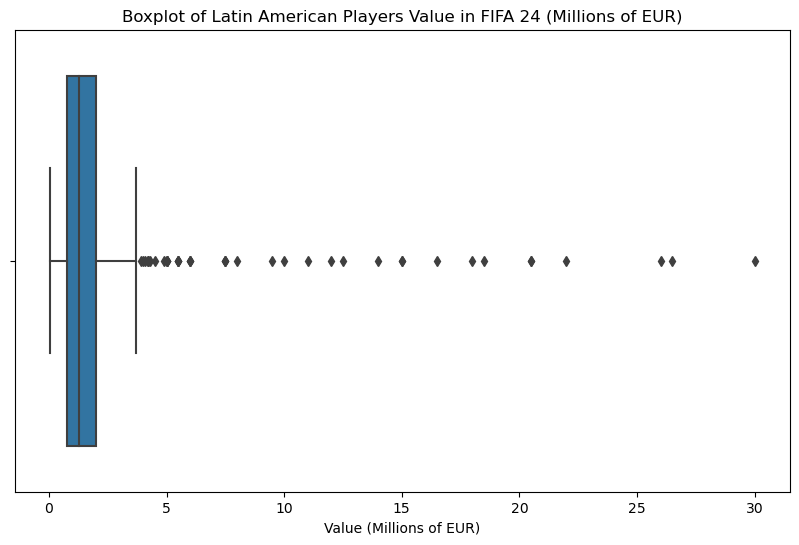

In [25]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it has been loaded

# Convert 'value_eur_24' to millions of euros
data_am_lat['value_eur_24_millions'] = data_am_lat['value_eur_24'] / 1e6

plt.figure(figsize=(10, 6))
sns.boxplot(x=data_am_lat['value_eur_24_millions'])
plt.title('Boxplot of Latin American Players Value in FIFA 24 (Millions of EUR)')
plt.xlabel('Value (Millions of EUR)')
plt.show()

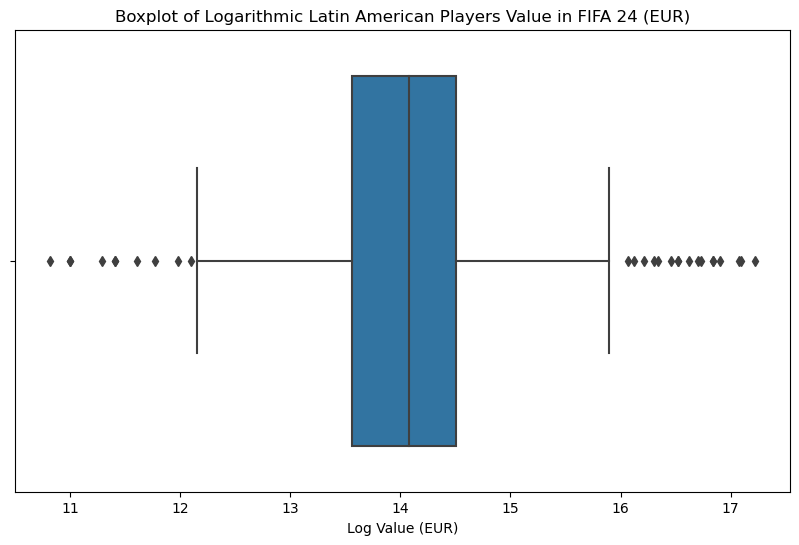

In [24]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it has been loaded

# Create a new column for the logarithmic transformation of 'value_eur_24'
data_am_lat['log_value_eur_24'] = np.log(data_am_lat['value_eur_24'] + 1)  # Adding 1 to avoid log(0)

# Create a boxplot for the new logarithmic variable
plt.figure(figsize=(10, 6))
sns.boxplot(x=data_am_lat['log_value_eur_24'])
plt.title('Boxplot of Logarithmic Latin American Players Value in FIFA 24 (EUR)')
plt.xlabel('Log Value (EUR)')
plt.show()

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2068450093.py:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data_am_lat['value_eur_24_million'], shade=True)


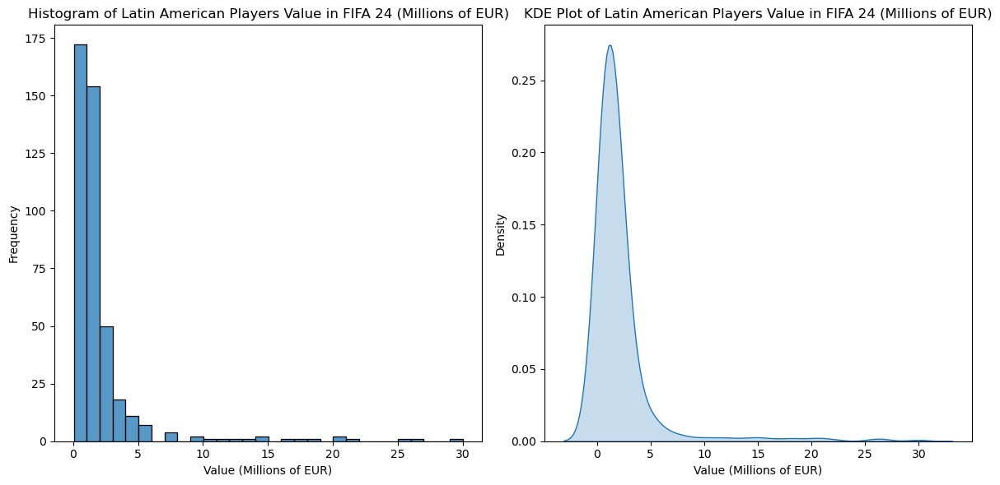

In [26]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it has been loaded

# Convert the values to millions of euros
data_am_lat['value_eur_24_million'] = data_am_lat['value_eur_24'] / 1_000_000

# Create the histogram and KDE plot
plt.figure(figsize=(12, 6))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(data_am_lat['value_eur_24_million'], bins=30, kde=False)
plt.title('Histogram of Latin American Players Value in FIFA 24 (Millions of EUR)')
plt.xlabel('Value (Millions of EUR)')
plt.ylabel('Frequency')

# KDE Plot
plt.subplot(1, 2, 2)
sns.kdeplot(data_am_lat['value_eur_24_million'], shade=True)
plt.title('KDE Plot of Latin American Players Value in FIFA 24 (Millions of EUR)')
plt.xlabel('Value (Millions of EUR)')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2285706378.py:23: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data_am_lat['log_value_eur_24'], shade=True)


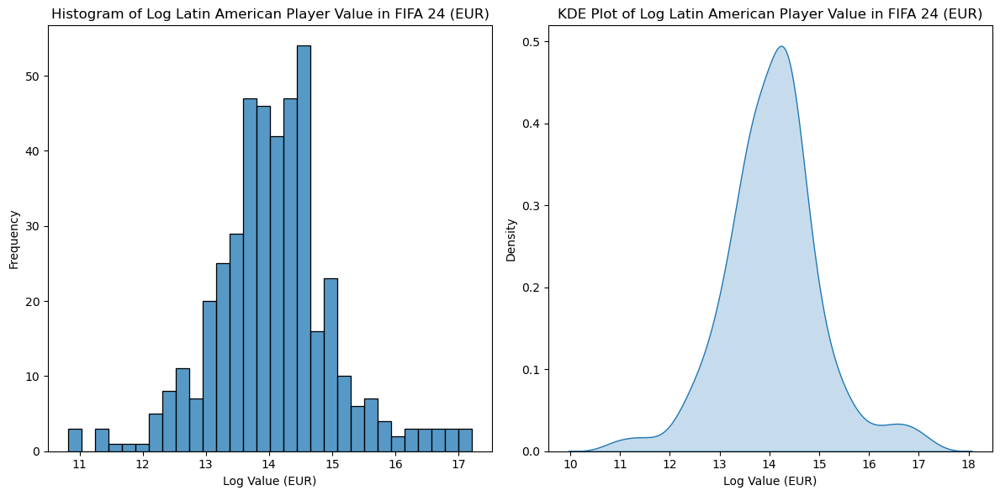

In [28]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'data' is your DataFrame and it has been loaded

# Create a new column for the logarithmic transformation of 'value_eur_24'
data_am_lat['log_value_eur_24'] = np.log(data_am_lat['value_eur_24'] + 1)

# Create the histogram and KDE plot
plt.figure(figsize=(12, 6))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(data_am_lat['log_value_eur_24'], bins=30, kde=False)
plt.title('Histogram of Log Latin American Player Value in FIFA 24 (EUR)')
plt.xlabel('Log Value (EUR)')
plt.ylabel('Frequency')

# KDE Plot
plt.subplot(1, 2, 2)
sns.kdeplot(data_am_lat['log_value_eur_24'], shade=True)
plt.title('KDE Plot of Log Latin American Player Value in FIFA 24 (EUR)')
plt.xlabel('Log Value (EUR)')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

In [20]:
fifa_23_features = ['release_clause_eur_23','overall_23', 'potential_23', 'wage_eur_23', 'age_23', 
                       'height_cm_23', 'weight_kg_23', 'club_team_id_23', 
                       'league_id_23', 'league_level_23', 'nationality_id_23', 
                       'weak_foot_23', 'skill_moves_23', 'international_reputation_23', 
                       'pace_23', 'shooting_23', 'passing_23', 'dribbling_23', 
                       'defending_23', 'physic_23', 'attacking_crossing_23', 
                       'attacking_finishing_23', 'attacking_heading_accuracy_23', 
                       'attacking_short_passing_23', 'attacking_volleys_23', 
                       'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23', 
                       'skill_long_passing_23', 'skill_ball_control_23', 
                       'movement_acceleration_23', 'movement_sprint_speed_23', 
                       'movement_agility_23', 'movement_reactions_23', 
                       'movement_balance_23', 'power_shot_power_23', 'power_jumping_23', 
                       'power_stamina_23', 'power_strength_23', 'power_long_shots_23', 
                       'mentality_aggression_23', 'mentality_interceptions_23', 
                       'mentality_positioning_23', 'mentality_vision_23', 
                       'mentality_penalties_23', 'defending_marking_awareness_23', 
                       'defending_standing_tackle_23', 'defending_sliding_tackle_23']

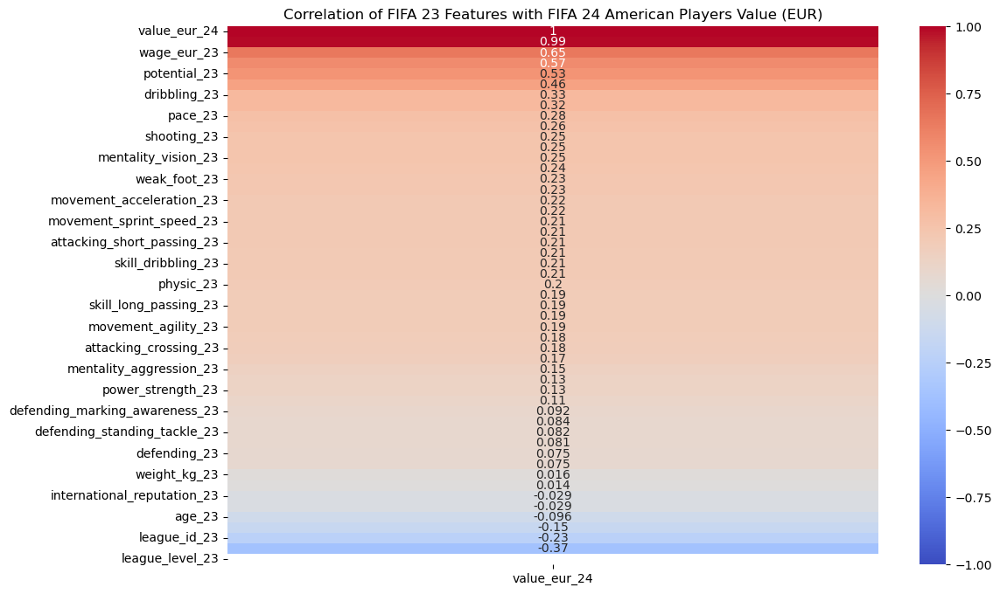

In [33]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it has been loaded

# Define the features and the target variable
fifa_23_features = ['weak_foot_23','international_reputation_23','release_clause_eur_23', 'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 
                    'height_cm_23', 'weight_kg_23', 'club_team_id_23', 
                    'league_id_23', 'league_level_23', 'nationality_id_23', 
                    'weak_foot_23', 'skill_moves_23', 'international_reputation_23', 
                    'pace_23', 'shooting_23', 'passing_23', 'dribbling_23', 
                    'defending_23', 'physic_23', 'attacking_crossing_23', 
                    'attacking_finishing_23', 'attacking_heading_accuracy_23', 
                    'attacking_short_passing_23', 'attacking_volleys_23', 
                    'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23', 
                    'skill_long_passing_23', 'skill_ball_control_23', 
                    'movement_acceleration_23', 'movement_sprint_speed_23', 
                    'movement_agility_23', 'movement_reactions_23', 
                    'movement_balance_23', 'power_shot_power_23', 'power_jumping_23', 
                    'power_stamina_23', 'power_strength_23', 'power_long_shots_23', 
                    'mentality_aggression_23', 'mentality_interceptions_23', 
                    'mentality_positioning_23', 'mentality_vision_23', 
                    'mentality_penalties_23', 'defending_marking_awareness_23', 
                    'defending_standing_tackle_23', 'defending_sliding_tackle_23']

# Add the target variable to the list of features for correlation computation
features_with_target = fifa_23_features + ['value_eur_24']

# Select only the numerical features and the target variable
numerical_data = data_am_lat[features_with_target]

# Compute the correlation matrix
correlation_matrix = numerical_data.corr()

# Extract the correlation with the target variable
correlation_with_target = correlation_matrix['value_eur_24'].sort_values(ascending=False)

# Plot the correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_with_target.to_frame(), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation of FIFA 23 Features with FIFA 24 American Players Value (EUR)')
plt.show()

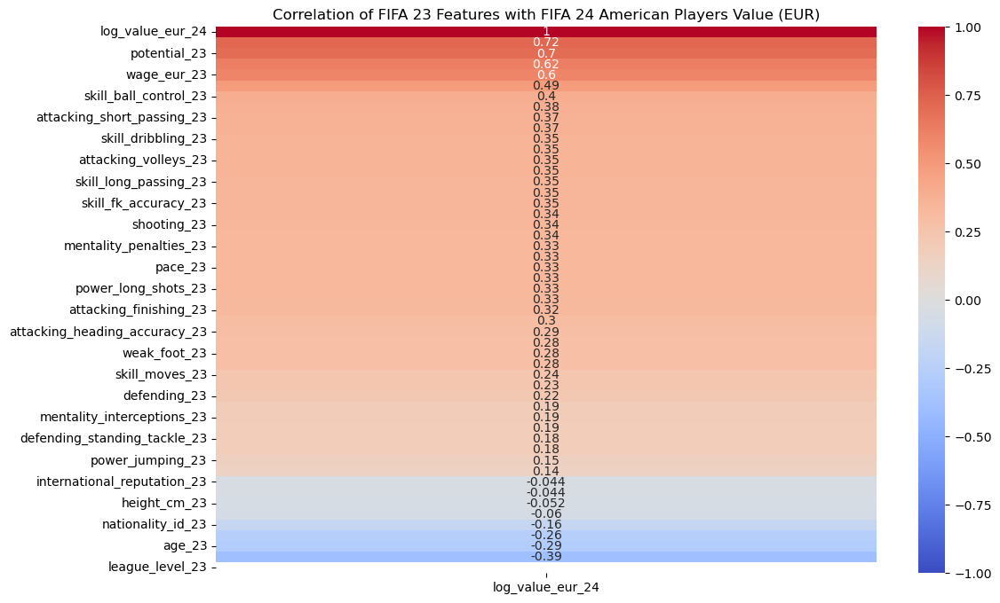

In [123]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it has been loaded

# Define the features and the target variable
fifa_23_features = ['weak_foot_23','international_reputation_23','release_clause_eur_23', 'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 
                    'height_cm_23', 'weight_kg_23', 'club_team_id_23', 
                    'league_id_23', 'league_level_23', 'nationality_id_23', 
                    'weak_foot_23', 'skill_moves_23', 'international_reputation_23', 
                    'pace_23', 'shooting_23', 'passing_23', 'dribbling_23', 
                    'defending_23', 'physic_23', 'attacking_crossing_23', 
                    'attacking_finishing_23', 'attacking_heading_accuracy_23', 
                    'attacking_short_passing_23', 'attacking_volleys_23', 
                    'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23', 
                    'skill_long_passing_23', 'skill_ball_control_23', 
                    'movement_acceleration_23', 'movement_sprint_speed_23', 
                    'movement_agility_23', 'movement_reactions_23', 
                    'movement_balance_23', 'power_shot_power_23', 'power_jumping_23', 
                    'power_stamina_23', 'power_strength_23', 'power_long_shots_23', 
                    'mentality_aggression_23', 'mentality_interceptions_23', 
                    'mentality_positioning_23', 'mentality_vision_23', 
                    'mentality_penalties_23', 'defending_marking_awareness_23', 
                    'defending_standing_tackle_23', 'defending_sliding_tackle_23']

# Add the target variable to the list of features for correlation computation
features_with_target = fifa_23_features + ['log_value_eur_24']

# Select only the numerical features and the target variable
numerical_data = data_am_lat[features_with_target]

# Compute the correlation matrix
correlation_matrix = numerical_data.corr()

# Extract the correlation with the target variable
correlation_with_target = correlation_matrix['log_value_eur_24'].sort_values(ascending=False)

# Plot the correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_with_target.to_frame(), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation of FIFA 23 Features with FIFA 24 American Players Value (EUR)')
plt.show()

## Correlation Matrix :

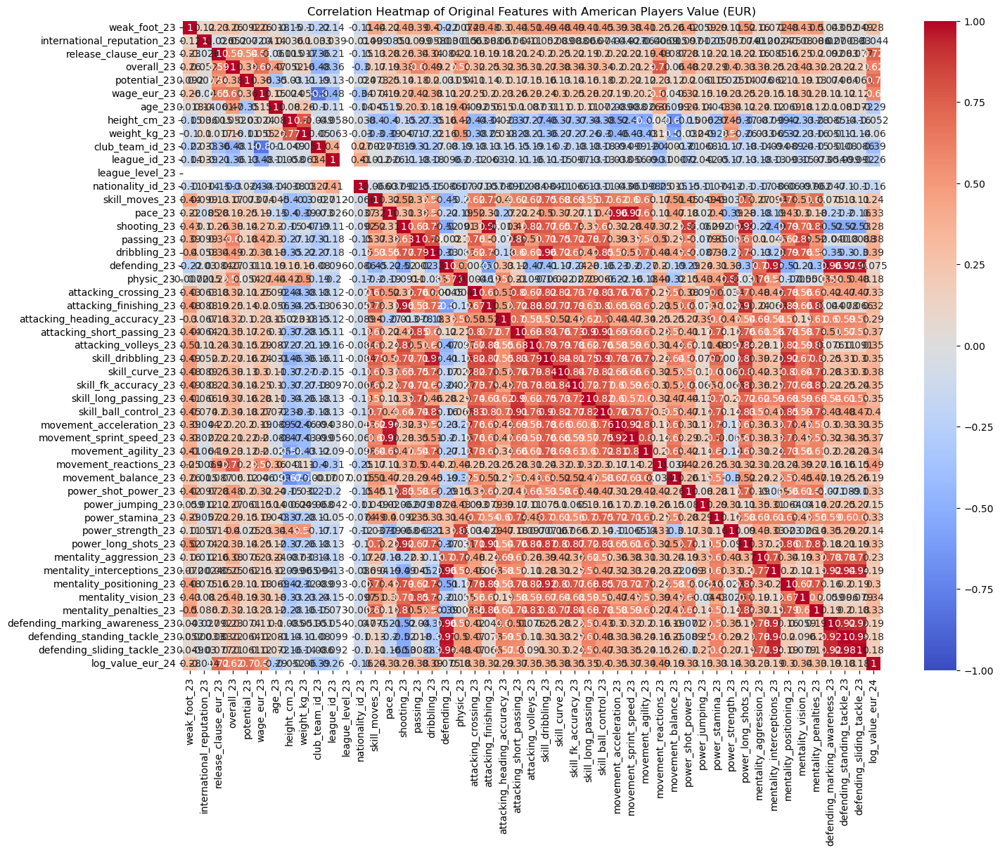

In [35]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define the original numerical features and the target variable
choosen_features_23 = ['weak_foot_23', 'international_reputation_23', 'release_clause_eur_23',
       'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
       'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
       'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
       'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
       'attacking_finishing_23', 'attacking_heading_accuracy_23',
       'attacking_short_passing_23', 'attacking_volleys_23',
       'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
       'skill_long_passing_23', 'skill_ball_control_23',
       'movement_acceleration_23', 'movement_sprint_speed_23',
       'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
       'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
       'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
       'mentality_interceptions_23', 'mentality_positioning_23',
       'mentality_vision_23', 'mentality_penalties_23',
       'defending_marking_awareness_23', 'defending_standing_tackle_23',
       'defending_sliding_tackle_23']

# Add the target variable to the list of features for correlation computation
features_with_target = choosen_features_23 + ['log_value_eur_24']

# Select only the numerical features and the target variable
numerical_data = data_am_lat[features_with_target]

# Compute the correlation matrix
correlation_matrix = numerical_data.corr()

# Plot the correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Original Features with American Players Value (EUR)')
plt.show()

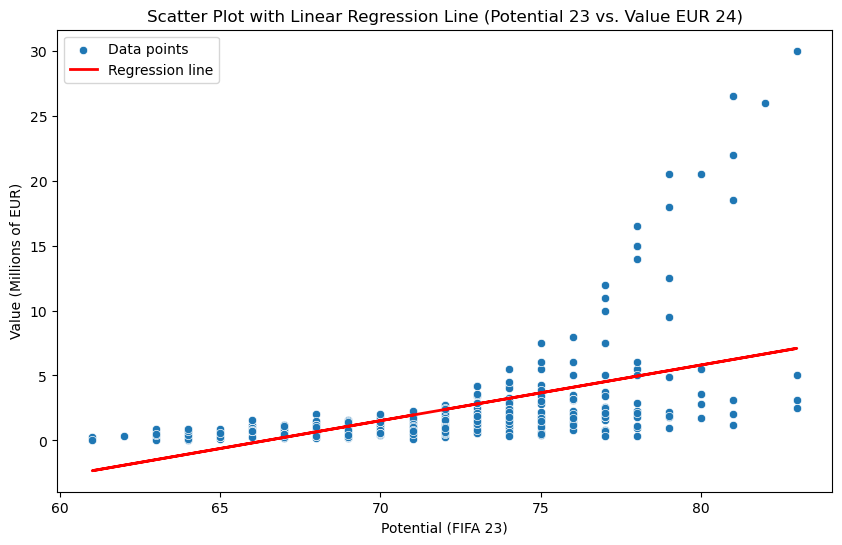

Intercept: -28.445311072565183
Coefficient: 0.42810743962367576


In [37]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np

# Assuming 'data_am_lat' is your DataFrame and it has been loaded

# Drop rows where 'potential_23' or 'value_eur_24' is NaN
data_am_lat = data_am_lat.dropna(subset=['potential_23', 'value_eur_24'])

# Define the features
X = data_am_lat[['potential_23']]  # Predictor
y = data_am_lat['value_eur_24'] / 1e6  # Target variable converted to millions of euros

# Fit a simple linear regression model
model = LinearRegression()
model.fit(X, y)

# Predict values for the regression line
predicted_values = model.predict(X)

# Plot the scatter plot and regression line
plt.figure(figsize=(10, 6))
sns.scatterplot(x='potential_23', y=y, data=data_am_lat, label='Data points')
plt.plot(data_am_lat['potential_23'], predicted_values, color='red', linewidth=2, label='Regression line')  # corrected 'data' to 'data_am_lat'
plt.title('Scatter Plot with Linear Regression Line (Potential 23 vs. Value EUR 24)')
plt.xlabel('Potential (FIFA 23)')
plt.ylabel('Value (Millions of EUR)')
plt.legend()
plt.show()

# Print the regression coefficients
print(f"Intercept: {model.intercept_}")
print(f"Coefficient: {model.coef_[0]}")


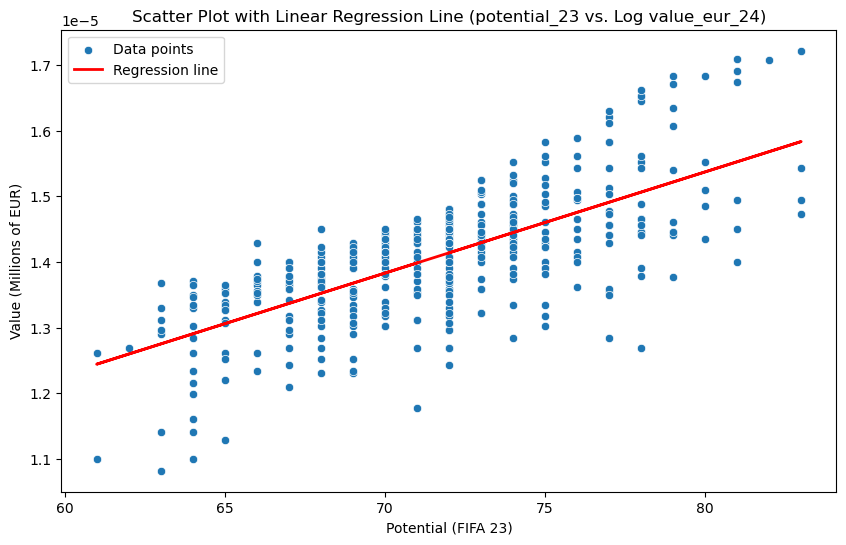

Intercept: 3.038221877842556e-06
Coefficient: 1.5416083821211692e-07


In [38]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np

# Drop rows where 'potential_23' or 'value_eur_24' is NaN
data_am_lat = data_am_lat.dropna(subset=['potential_23', 'log_value_eur_24'])

# Define the features
X = data_am_lat[['potential_23']]  # Predictor
y = data_am_lat['log_value_eur_24'] / 1e6  # Target variable converted to millions of euros

# Fit a simple linear regression model
model = LinearRegression()
model.fit(X, y)

# Predict values for the regression line
predicted_values = model.predict(X)

# Plot the scatter plot and regression line
plt.figure(figsize=(10, 6))
sns.scatterplot(x='potential_23', y=y, data=data_am_lat, label='Data points')
plt.plot(data_am_lat['potential_23'], predicted_values, color='red', linewidth=2, label='Regression line')
plt.title('Scatter Plot with Linear Regression Line (potential_23 vs. Log value_eur_24)')
plt.xlabel('Potential (FIFA 23)')
plt.ylabel('Value (Millions of EUR)')
plt.legend()
plt.show()

# Print the regression coefficients
print(f"Intercept: {model.intercept_}")
print(f"Coefficient: {model.coef_[0]}")

# General OLS Model :

                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.873
Model:                            OLS   Adj. R-squared:                  0.858
Method:                 Least Squares   F-statistic:                     57.86
Date:                Wed, 05 Jun 2024   Prob (F-statistic):          1.98e-145
Time:                        19:27:45   Log-Likelihood:                -149.37
No. Observations:                 433   AIC:                             392.7
Df Residuals:                     386   BIC:                             584.1
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
weak_foot_23

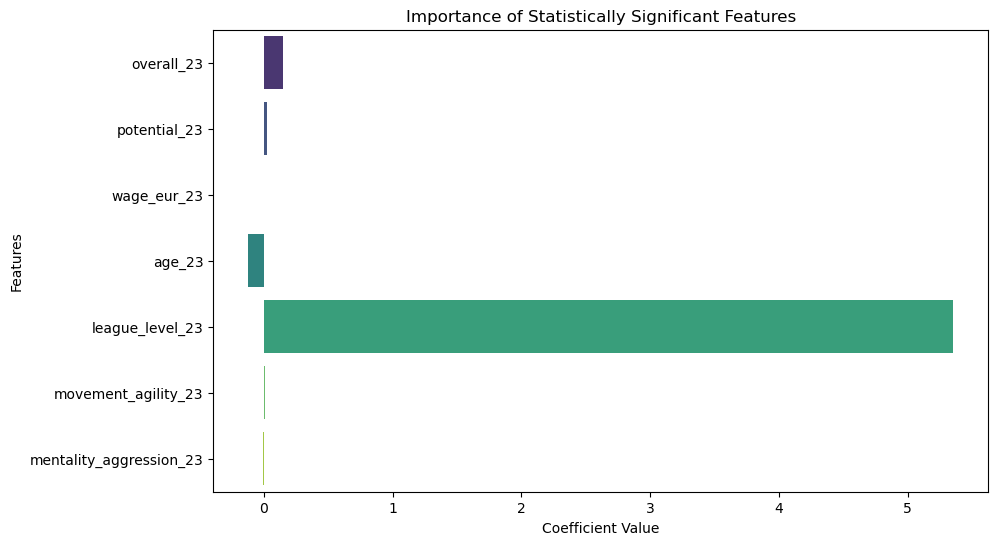

In [55]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it has been loaded

# Define the chosen features for the model
chosen_features_23_gk = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23','goalkeeping_diving_23','goalkeeping_handling_23','goalkeeping_kicking_23','goalkeeping_positioning_23','goalkeeping_reflexes_23','goalkeeping_speed_23']



# Create a new column for the logarithmic transformation of 'value_eur_24'
data_am_lat['log_value_eur_24'] = np.log(data_am_lat['value_eur_24'] + 1)

# Select the features and target variable
X = data_am_lat[chosen_features_23]
y = data_am_lat['log_value_eur_24']

# Fill NaN values with 0
X = X.fillna(0)
y = y.fillna(0)

# Add a constant term to the predictors
X = sm.add_constant(X)

# Fit the OLS model
model = sm.OLS(y, X).fit()
print(model.summary())

# Get the statistically significant features (p-value < 0.05)
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'const' in significant_features:
    significant_features.remove('const')

# Get the coefficients of the significant features
coefs = model.params[significant_features]

# Plot the importance of the statistically significant features
plt.figure(figsize=(10, 6))
sns.barplot(x=coefs.values, y=coefs.index, palette='viridis')
plt.title('Importance of Statistically Significant Features')
plt.xlabel('Coefficient Value')
plt.ylabel('Features')
plt.show()

                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.873
Model:                            OLS   Adj. R-squared:                  0.858
Method:                 Least Squares   F-statistic:                     57.86
Date:                Wed, 05 Jun 2024   Prob (F-statistic):          1.98e-145
Time:                        19:27:49   Log-Likelihood:                -149.37
No. Observations:                 433   AIC:                             392.7
Df Residuals:                     386   BIC:                             584.1
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

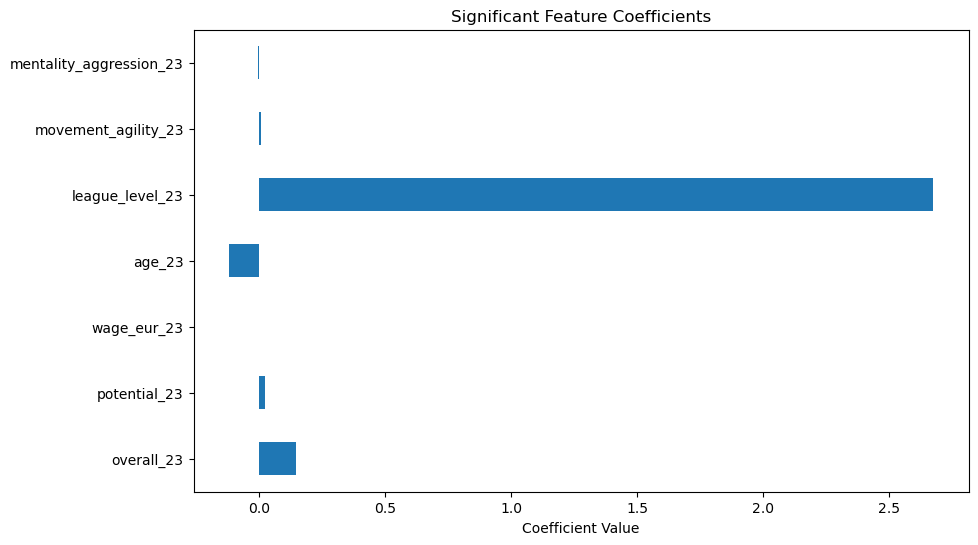

In [56]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

# Assuming 'data' is your DataFrame and it has been loaded

# Define the chosen features for the model

# Create a new column for the logarithmic transformation of 'value_eur_24'
data_am_lat['log_value_eur_24'] = np.log(data_am_lat['value_eur_24'] + 1)

# Fill NaN values with 0
data_am_lat = data_am_lat.fillna(0)

# Create the formula for the OLS model
formula = 'log_value_eur_24 ~ ' + ' + '.join(chosen_features_23)

# Fit the OLS model using the formula
model = ols(formula, data=data_am_lat).fit()
print(model.summary())

# Perform ANOVA
anova_results = anova_lm(model)
print("\nANOVA table:\n", anova_results)

# Plot the importance of significant features
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'Intercept' in significant_features:
    significant_features.remove('Intercept')

coefs = model.params[significant_features]
coefs.plot(kind='barh', figsize=(10, 6))
plt.xlabel('Coefficient Value')
plt.title('Significant Feature Coefficients')
plt.show()

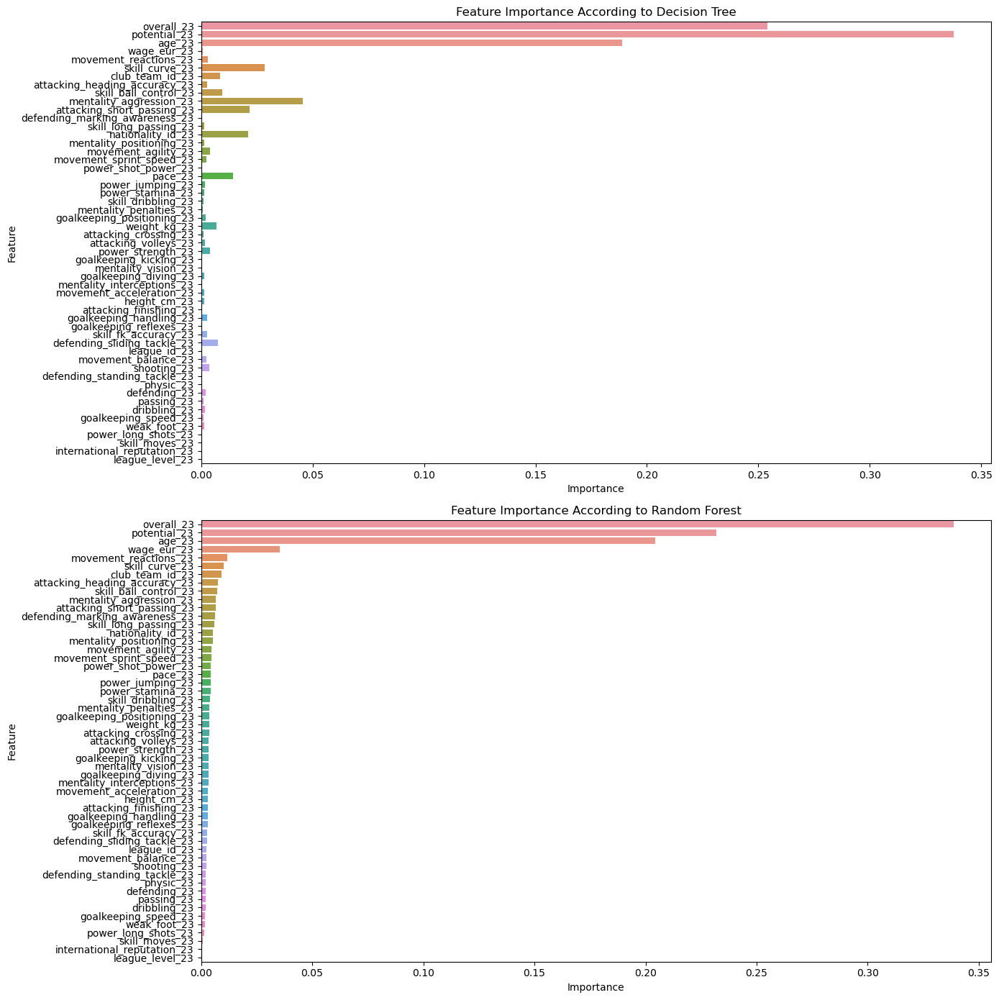

In [57]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming 'data' is your DataFrame and it has been loaded

# Define the chosen features for the model
chosen_features_23 = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23','goalkeeping_diving_23','goalkeeping_handling_23','goalkeeping_kicking_23','goalkeeping_positioning_23','goalkeeping_reflexes_23','goalkeeping_speed_23']



# Create a new column for the logarithmic transformation of 'value_eur_24'
data_am_lat['log_value_eur_24'] = np.log(data_am_lat['value_eur_24'] + 1)

# Fill NaN values with 0
data_am_lat = data_am_lat.fillna(0)

# Select features and target variable
X = data_am_lat[chosen_features_23]
y = data_am_lat['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Train a Random Forest Regressor
forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X_train, y_train)

# Get feature importances
tree_importances = tree.feature_importances_
forest_importances = forest.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Decision Tree Importance': tree_importances,
    'Random Forest Importance': forest_importances
})

# Sort DataFrame by Random Forest Importance
importance_df = importance_df.sort_values(by='Random Forest Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(14, 14))
plt.subplot(2, 1, 1)
sns.barplot(x='Decision Tree Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Decision Tree')
plt.xlabel('Importance')

plt.subplot(2, 1, 2)
sns.barplot(x='Random Forest Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Random Forest')
plt.xlabel('Importance')

plt.tight_layout()
plt.show()

# GK Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/1498232359.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goalkeepers['log_value_eur_24'] = np.log(goalkeepers['value_eur_24'] + 1)


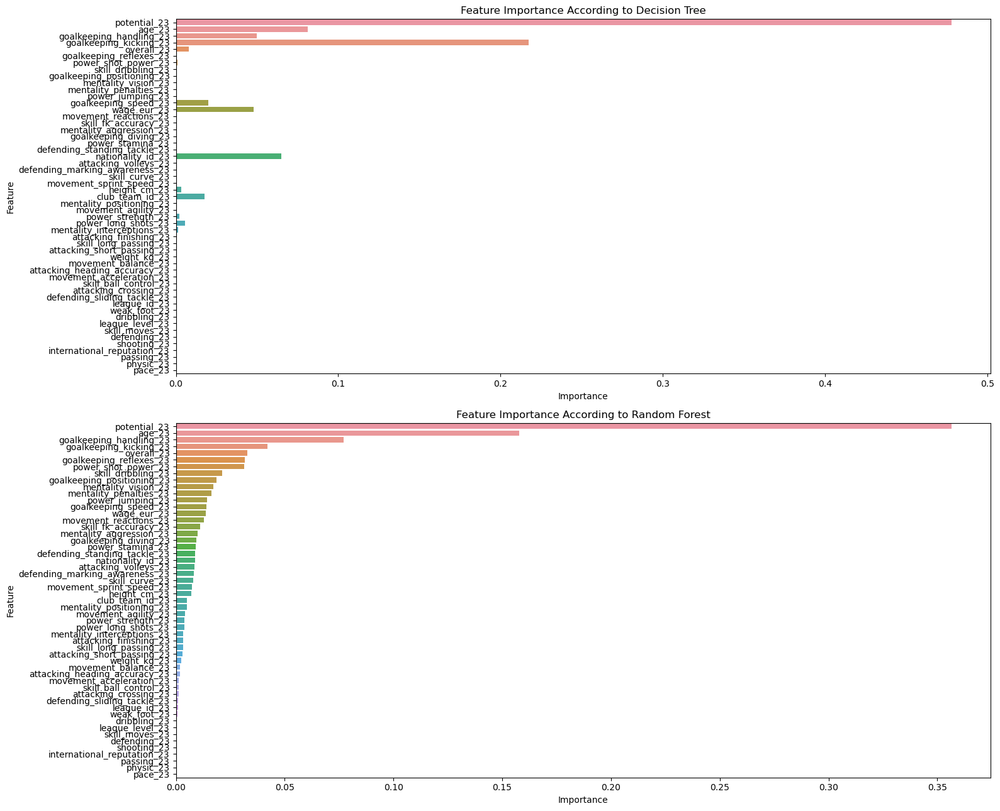

In [58]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming 'data' is your DataFrame and it has been loaded

# Filter data to select only goalkeepers
goalkeepers = data_am_lat[data_am_lat['player_positions_23'].str.contains('GK')]

# Define the chosen features for the model
chosen_features_23_gk = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23','goalkeeping_diving_23','goalkeeping_handling_23','goalkeeping_kicking_23','goalkeeping_positioning_23','goalkeeping_reflexes_23','goalkeeping_speed_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
goalkeepers['log_value_eur_24'] = np.log(goalkeepers['value_eur_24'] + 1)

# Fill NaN values with 0
goalkeepers = goalkeepers.fillna(0)

# Select features and target variable
X = goalkeepers[chosen_features_23]
y = goalkeepers['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Train a Random Forest Regressor
forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X_train, y_train)

# Get feature importances
tree_importances = tree.feature_importances_
forest_importances = forest.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Decision Tree Importance': tree_importances,
    'Random Forest Importance': forest_importances
})

# Sort DataFrame by Random Forest Importance
importance_df = importance_df.sort_values(by='Random Forest Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(16, 13))
plt.subplot(2, 1, 1)
sns.barplot(x='Decision Tree Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Decision Tree')
plt.xlabel('Importance')

plt.subplot(2, 1, 2)
sns.barplot(x='Random Forest Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Random Forest')
plt.xlabel('Importance')

plt.tight_layout()
plt.show()

                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.925
Method:                 Least Squares   F-statistic:                     16.33
Date:                Wed, 05 Jun 2024   Prob (F-statistic):           1.04e-05
Time:                        19:11:55   Log-Likelihood:                 27.235
No. Observations:                  56   AIC:                             35.53
Df Residuals:                      11   BIC:                             126.7
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/3634489386.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goalkeepers['log_value_eur_24'] = np.log(goalkeepers['value_eur_24'] + 1)


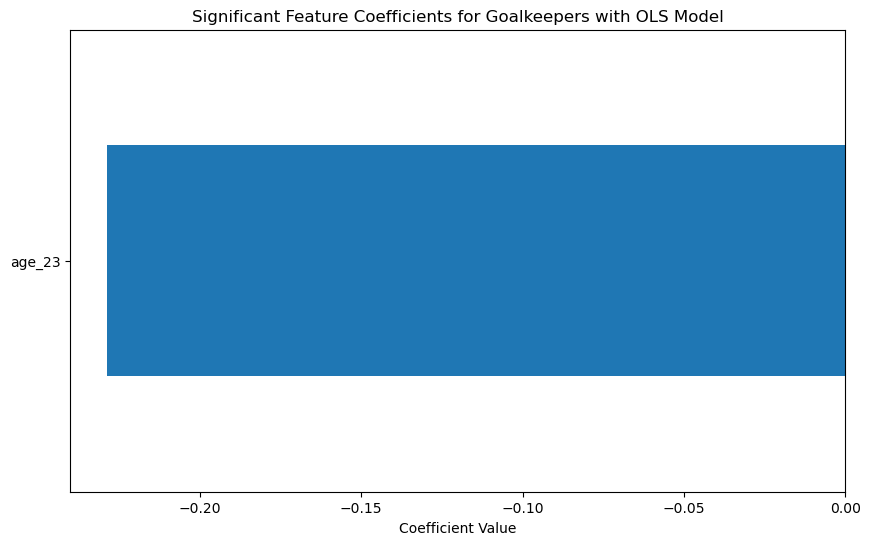

In [51]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

# Assuming 'data' is your DataFrame and it has been loaded

# Filter data to select only goalkeepers
goalkeepers = data_am_lat[data_am_lat['player_positions_23'].str.contains('GK')]

# Define the chosen features for the model
chosen_features_23_gk = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23','goalkeeping_diving_23','goalkeeping_handling_23','goalkeeping_kicking_23','goalkeeping_positioning_23','goalkeeping_reflexes_23','goalkeeping_speed_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
goalkeepers['log_value_eur_24'] = np.log(goalkeepers['value_eur_24'] + 1)

# Fill NaN values with 0
goalkeepers = goalkeepers.fillna(0)

# Create the formula for the OLS model
formula = 'log_value_eur_24 ~ ' + ' + '.join(chosen_features_23_gk)

# Fit the OLS model using the formula
model = ols(formula, data=goalkeepers).fit()
print(model.summary())

# Perform ANOVA
anova_results = anova_lm(model)
print("\nANOVA table:\n", anova_results)

# Plot the importance of significant features
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'Intercept' in significant_features:
    significant_features.remove('Intercept')

coefs = model.params[significant_features]
coefs.plot(kind='barh', figsize=(10, 6))
plt.xlabel('Coefficient Value')
plt.title('Significant Feature Coefficients for Goalkeepers with OLS Model')
plt.show()

## Ridge Regression Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/3304761055.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goalkeepers['log_value_eur_24'] = np.log(goalkeepers['value_eur_24'] + 1)


Ridge Regression Coefficients:
[-1.47046160e-01  0.00000000e+00 -9.99227015e-02 -4.91053035e-03
  1.94027259e-05 -2.26303530e-01 -2.72300622e-02  3.20239469e-02
  4.56536086e-06 -1.25933501e-04  0.00000000e+00  5.96320351e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  7.68715044e-02
  1.04650266e-01 -2.02806442e-02 -5.67155705e-03  2.29985411e-02
  2.59808148e-02 -2.23814098e-03  6.80369204e-03 -9.38727658e-03
 -3.02482817e-02  1.06045218e-01  6.03238609e-02 -9.29889915e-03
  6.37655388e-02 -3.08641735e-03 -4.02863594e-01 -2.20734094e-02
  2.09169039e-03 -1.09324775e-02 -7.87535343e-02  1.09499570e-02
  1.85729294e-02 -6.31810926e-02  3.33043205e-04 -5.16939311e-04
  3.44087021e-02  4.86729525e-04  1.13807503e-02  5.04925781e-02
  5.33797884e-02  3.10469952e-01  8.08374041e-02  7.95900452e-02
 -1.56725096e-01]
Most under-valued Goalkeepers:         short_name_23  difference_million
78      Lucas Mantela            

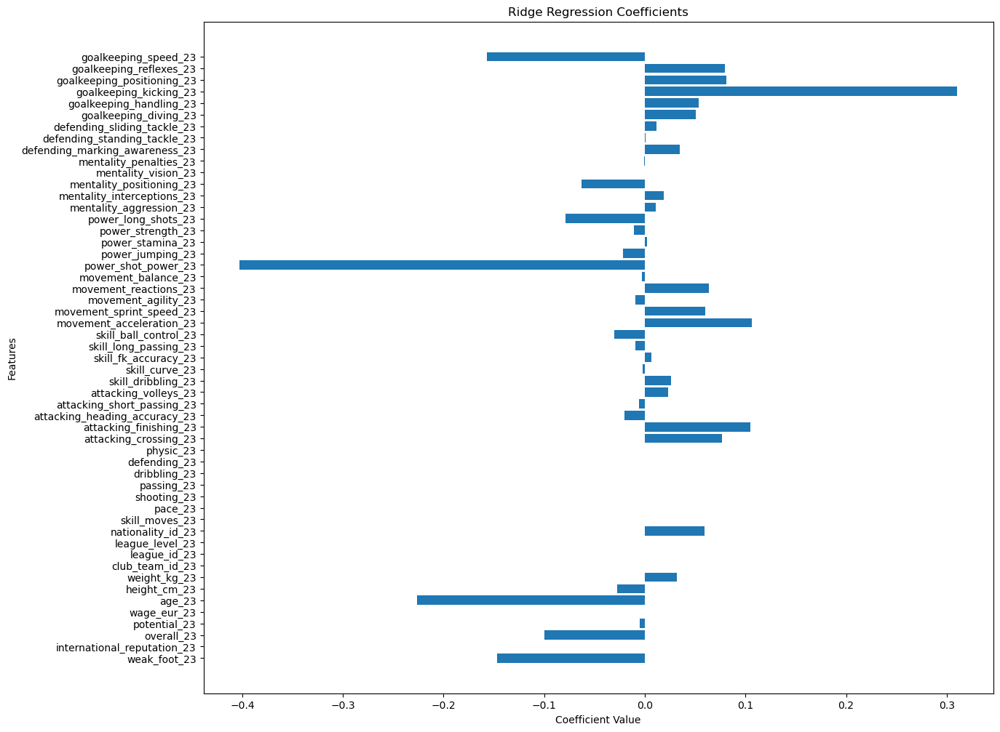

In [59]:
import pandas as pd
import numpy as np
from sklearn.linear_model import Ridge
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assuming 'data' is your DataFrame and it has been loaded

# Define the chosen features for the model
chosen_features_23_gk = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23','goalkeeping_diving_23','goalkeeping_handling_23','goalkeeping_kicking_23','goalkeeping_positioning_23','goalkeeping_reflexes_23','goalkeeping_speed_23']

# Filter goalkeepers from the dataset
goalkeepers = data_am_lat[data_am_lat['player_positions_23'].str.contains('GK')]

# Create a new column for the logarithmic transformation of 'value_eur_24'
goalkeepers['log_value_eur_24'] = np.log(goalkeepers['value_eur_24'] + 1)

# Fill NaN values with 0
goalkeepers = goalkeepers.fillna(0)

# Prepare data for Ridge model
X = goalkeepers[chosen_features_23_gk]
y = goalkeepers['log_value_eur_24']

# Fit the Ridge model
ridge = Ridge(alpha=0.1)  # You can adjust the alpha value as needed
ridge.fit(X, y)

# Print the coefficients
print("Ridge Regression Coefficients:")
print(ridge.coef_)

# Predict values on the entire dataset
goalkeepers['predicted_log_value'] = ridge.predict(X)
goalkeepers['predicted_value'] = np.exp(goalkeepers['predicted_log_value']) - 1
goalkeepers['predicted_value_million'] = goalkeepers['predicted_value'] / 1_000_000
goalkeepers['actual_value_million'] = goalkeepers['value_eur_24'] / 1_000_000
goalkeepers['difference_million'] = goalkeepers['predicted_value_million'] - goalkeepers['actual_value_million']

# Filter under-valued and over-valued goalkeepers
under_valued_gk = goalkeepers[goalkeepers['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_gk = goalkeepers[goalkeepers['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Goalkeepers:", under_valued_gk[['short_name_23', 'difference_million']])
print("Most over-valued Goalkeepers:", over_valued_gk[['short_name_23', 'difference_million']])

# Calculate performance metrics
r2 = r2_score(goalkeepers['value_eur_24'], goalkeepers['predicted_value'])
rmse = mean_squared_error(goalkeepers['value_eur_24'], goalkeepers['predicted_value'], squared=False)
mae = mean_absolute_error(goalkeepers['value_eur_24'], goalkeepers['predicted_value'])

print(f"R-squared: {r2}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")

# Plot the importance of significant features
plt.figure(figsize=(14, 12))
plt.barh(chosen_features_23_gk, ridge.coef_)
plt.xlabel('Coefficient Value')
plt.ylabel('Features')
plt.title('Ridge Regression Coefficients')
plt.show()

# CB Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/1336150523.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  center_backs['log_value_eur_24'] = np.log(center_backs['value_eur_24'] + 1)


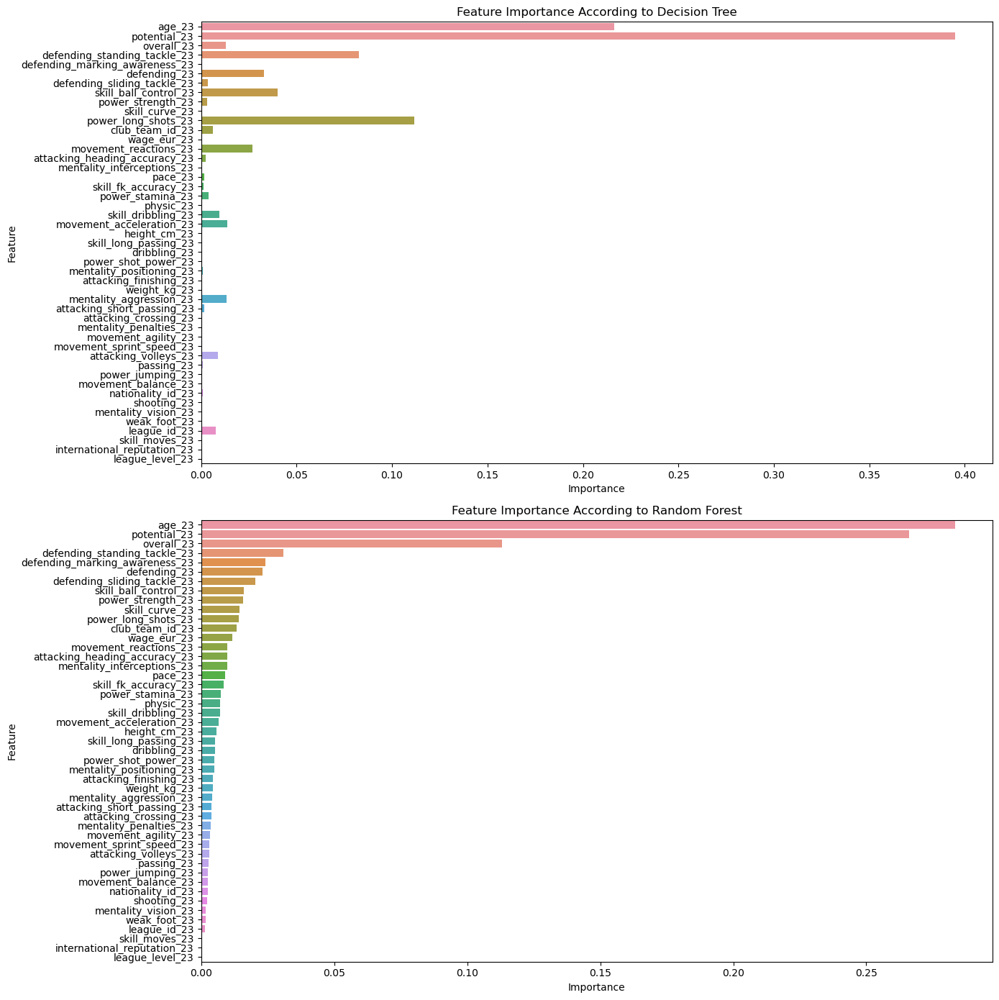

In [61]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming 'data' is your DataFrame and it has been loaded

# Filter data to select only goalkeepers
center_backs = data_am_lat[data_am_lat['player_positions_23'].str.contains('CB')]

# Define the chosen features for the model
chosen_features_23 = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
center_backs['log_value_eur_24'] = np.log(center_backs['value_eur_24'] + 1)

# Fill NaN values with 0
center_backs = center_backs.fillna(0)

# Select features and target variable
X = center_backs[chosen_features_23]
y = center_backs['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Train a Random Forest Regressor
forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X_train, y_train)

# Get feature importances
tree_importances = tree.feature_importances_
forest_importances = forest.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Decision Tree Importance': tree_importances,
    'Random Forest Importance': forest_importances
})

# Sort DataFrame by Random Forest Importance
importance_df = importance_df.sort_values(by='Random Forest Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(14, 14))
plt.subplot(2, 1, 1)
sns.barplot(x='Decision Tree Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Decision Tree')
plt.xlabel('Importance')

plt.subplot(2, 1, 2)
sns.barplot(x='Random Forest Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Random Forest')
plt.xlabel('Importance')

plt.tight_layout()
plt.show()

                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.941
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     15.27
Date:                Wed, 05 Jun 2024   Prob (F-statistic):           1.11e-15
Time:                        19:32:26   Log-Likelihood:                 13.692
No. Observations:                  89   AIC:                             64.62
Df Residuals:                      43   BIC:                             179.1
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2856228016.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  center_backs['log_value_eur_24'] = np.log(center_backs['value_eur_24'] + 1)


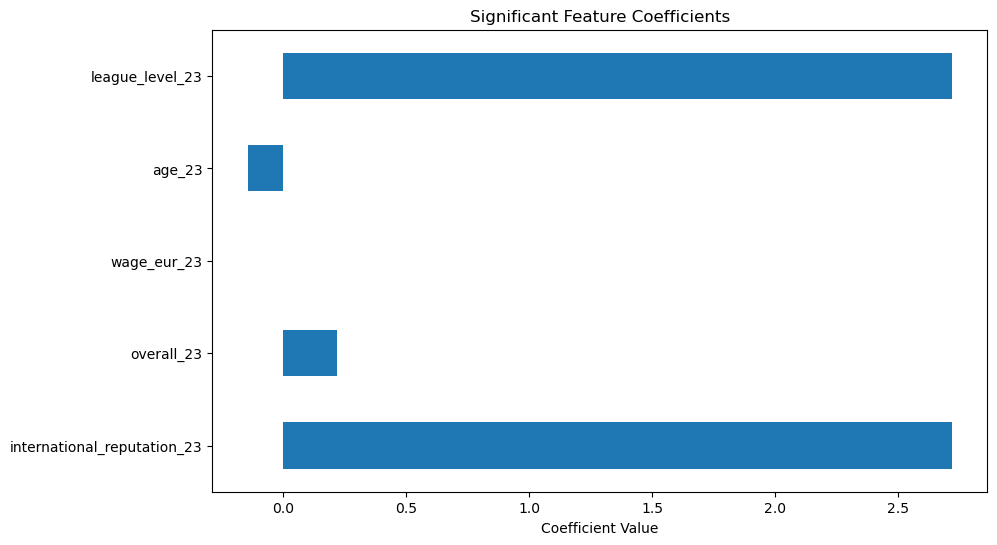

Ridge - R-squared: 0.7890435470517141, MSE: 0.17853256269658202, MAE: 0.34249814936841005
Lasso - R-squared: 0.8178294248513989, MSE: 0.15417105840873638, MAE: 0.2712933702563682
Random Forest - R-squared: 0.8179995805117795, MSE: 0.1540270555793348, MAE: 0.29533810516102726
ANN - R-squared: -232948.58726231699, MSE: 197145.3644191093, MAE: 405.16755384049725
           Model      R-squared            MSE         MAE
0          Ridge       0.789044       0.178533    0.342498
1          Lasso       0.817829       0.154171    0.271293
2  Random Forest       0.818000       0.154027    0.295338
3            ANN -232948.587262  197145.364419  405.167554


In [63]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from sklearn.linear_model import Ridge, Lasso
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# Assuming 'data' is your DataFrame and it has been loaded
center_backs = data_am_lat[data_am_lat['player_positions_23'].str.contains('CB')]

# Define the chosen features for the model
chosen_features_23_cb = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
center_backs['log_value_eur_24'] = np.log(center_backs['value_eur_24'] + 1)

# Fill NaN values with 0
center_backs = center_backs.fillna(0)

# Create the formula for the OLS model
formula = 'log_value_eur_24 ~ ' + ' + '.join(chosen_features_23_cb)

# Fit the OLS model using the formula
model = ols(formula, data=center_backs).fit()
print(model.summary())

# Perform ANOVA
anova_results = anova_lm(model)
print("\nANOVA table:\n", anova_results)

# Plot the importance of significant features
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'Intercept' in significant_features:
    significant_features.remove('Intercept')

coefs = model.params[significant_features]
coefs.plot(kind='barh', figsize=(10, 6))
plt.xlabel('Coefficient Value')
plt.title('Significant Feature Coefficients')
plt.show()

# Prepare data for other models
X = center_backs[chosen_features_23_cb]
y = center_backs['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model 1: Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
ridge_predictions = ridge.predict(X_test)

# Model 2: Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
lasso_predictions = lasso.predict(X_test)

# Model 3: Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_predictions = rf.predict(X_test)

# Model 4: ANN (MLP Regressor)
mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)
mlp_predictions = mlp.predict(X_test)

# Evaluate the models
def evaluate_model(y_test, predictions, model_name):
    r2 = r2_score(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    print(f"{model_name} - R-squared: {r2}, MSE: {mse}, MAE: {mae}")

evaluate_model(y_test, ridge_predictions, "Ridge")
evaluate_model(y_test, lasso_predictions, "Lasso")
evaluate_model(y_test, rf_predictions, "Random Forest")
evaluate_model(y_test, mlp_predictions, "ANN")

# Compare the models
models = ['Ridge', 'Lasso', 'Random Forest', 'ANN']
r2_scores = [r2_score(y_test, ridge_predictions), r2_score(y_test, lasso_predictions), r2_score(y_test, rf_predictions), r2_score(y_test, mlp_predictions)]
mse_scores = [mean_squared_error(y_test, ridge_predictions), mean_squared_error(y_test, lasso_predictions), mean_squared_error(y_test, rf_predictions), mean_squared_error(y_test, mlp_predictions)]
mae_scores = [mean_absolute_error(y_test, ridge_predictions), mean_absolute_error(y_test, lasso_predictions), mean_absolute_error(y_test, rf_predictions), mean_absolute_error(y_test, mlp_predictions)]

comparison = pd.DataFrame({
    'Model': models,
    'R-squared': r2_scores,
    'MSE': mse_scores,
    'MAE': mae_scores
})

print(comparison)

## Ridge Regression Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/3002676211.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  center_backs['log_value_eur_24'] = np.log(center_backs['value_eur_24'] + 1)


Ridge Regression Coefficients:
[ 2.71922692e-02  0.00000000e+00  2.15987582e-01  7.23460111e-03
  3.06812829e-05 -1.44955415e-01 -1.35549050e-02  2.30276840e-02
  8.99788133e-07  1.28741465e-04  0.00000000e+00 -2.72152775e-03
 -1.53159700e-01 -2.34585981e-01  7.77362674e-02 -1.34580987e-01
  2.17482486e-02  2.97864799e-03 -1.00931221e-02  3.44621043e-02
 -5.14396849e-02 -1.45333375e-02  5.00792403e-02  1.15007336e-03
 -3.28047267e-03  3.60701338e-03  5.55591735e-03  1.27127071e-02
 -9.60568410e-03  1.09071068e-01  1.12316152e-01  1.69669710e-03
 -1.63139838e-02 -1.98448319e-03 -1.38072100e-02 -1.43143509e-05
  1.10820433e-02  1.06805639e-02 -2.18861982e-02 -1.18447375e-02
 -6.87601296e-03 -4.68632272e-03  2.71711761e-02  5.00825358e-03
 -1.54454993e-02 -1.27073099e-02  1.29357069e-03]
Most under-valued Center Backs:           short_name_23  difference_million
153        Vanderleiton            1.281566
91      Otávio Cairinho            1.065698
196     Rafael Cachoira            0.779

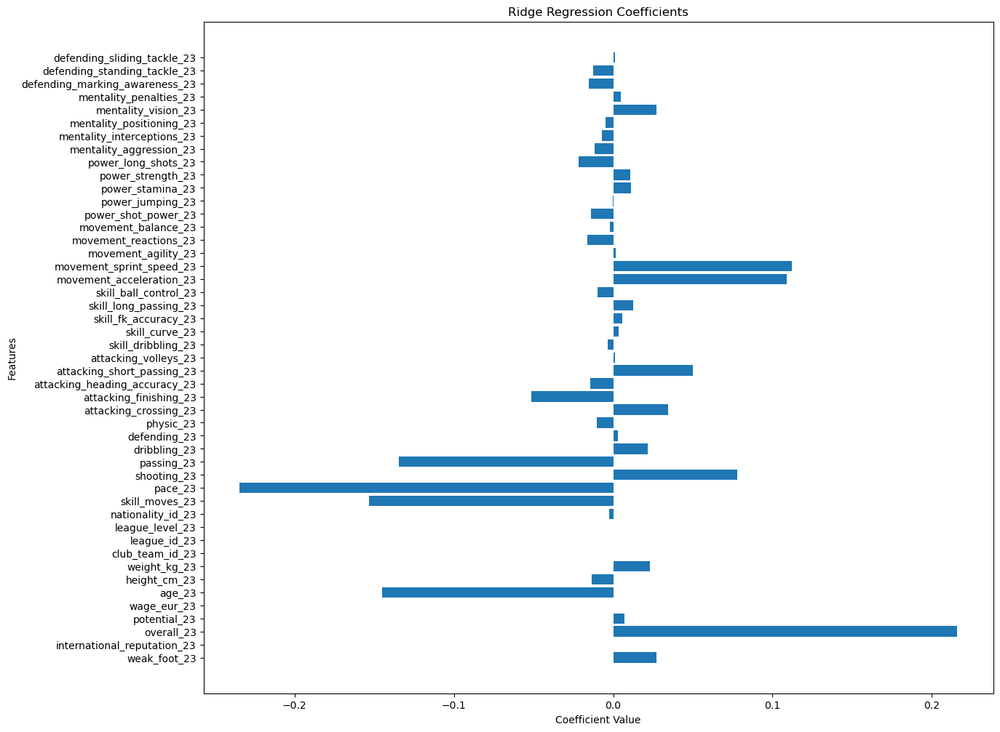

In [65]:
import pandas as pd
import numpy as np
from sklearn.linear_model import Ridge
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assuming 'data' is your DataFrame and it has been loaded

# Define the chosen features for the model
chosen_features_23_cb = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Filter center backs from the dataset
center_backs = data_am_lat[data_am_lat['player_positions_23'].str.contains('CB')]

# Create a new column for the logarithmic transformation of 'value_eur_24'
center_backs['log_value_eur_24'] = np.log(center_backs['value_eur_24'] + 1)

# Fill NaN values with 0
center_backs = center_backs.fillna(0)

# Prepare data for Ridge Regression model
X = center_backs[chosen_features_23_cb]
y = center_backs['log_value_eur_24']

# Fit the Ridge Regression model
ridge = Ridge(alpha=0.1)  # You can adjust the alpha value as needed
ridge.fit(X, y)

# Print the coefficients
print("Ridge Regression Coefficients:")
print(ridge.coef_)

# Predict values on the entire dataset
center_backs['predicted_log_value'] = ridge.predict(X)
center_backs['predicted_value'] = np.exp(center_backs['predicted_log_value']) - 1
center_backs['predicted_value_million'] = center_backs['predicted_value'] / 1_000_000
center_backs['actual_value_million'] = center_backs['value_eur_24'] / 1_000_000
center_backs['difference_million'] = center_backs['predicted_value_million'] - center_backs['actual_value_million']

under_valued_cb = center_backs[center_backs['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_cb = center_backs[center_backs['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Center Backs:", under_valued_cb[['short_name_23', 'difference_million']])
print("Most over-valued Center Backs:", over_valued_cb[['short_name_23', 'difference_million']])

# Calculate performance metrics
r2 = r2_score(center_backs['value_eur_24'], center_backs['predicted_value'])
rmse = mean_squared_error(center_backs['value_eur_24'], center_backs['predicted_value'], squared=False)
mae = mean_absolute_error(center_backs['value_eur_24'], center_backs['predicted_value'])

print(f"R-squared: {r2}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")

# Plot the importance of significant features
plt.figure(figsize=(14, 12))
plt.barh(chosen_features_23_cb, ridge.coef_)
plt.xlabel('Coefficient Value')
plt.ylabel('Features')
plt.title('Ridge Regression Coefficients')
plt.show()

# LB / RB Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/1156613996.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lateral_defenders['log_value_eur_24'] = np.log(lateral_defenders['value_eur_24'] + 1)


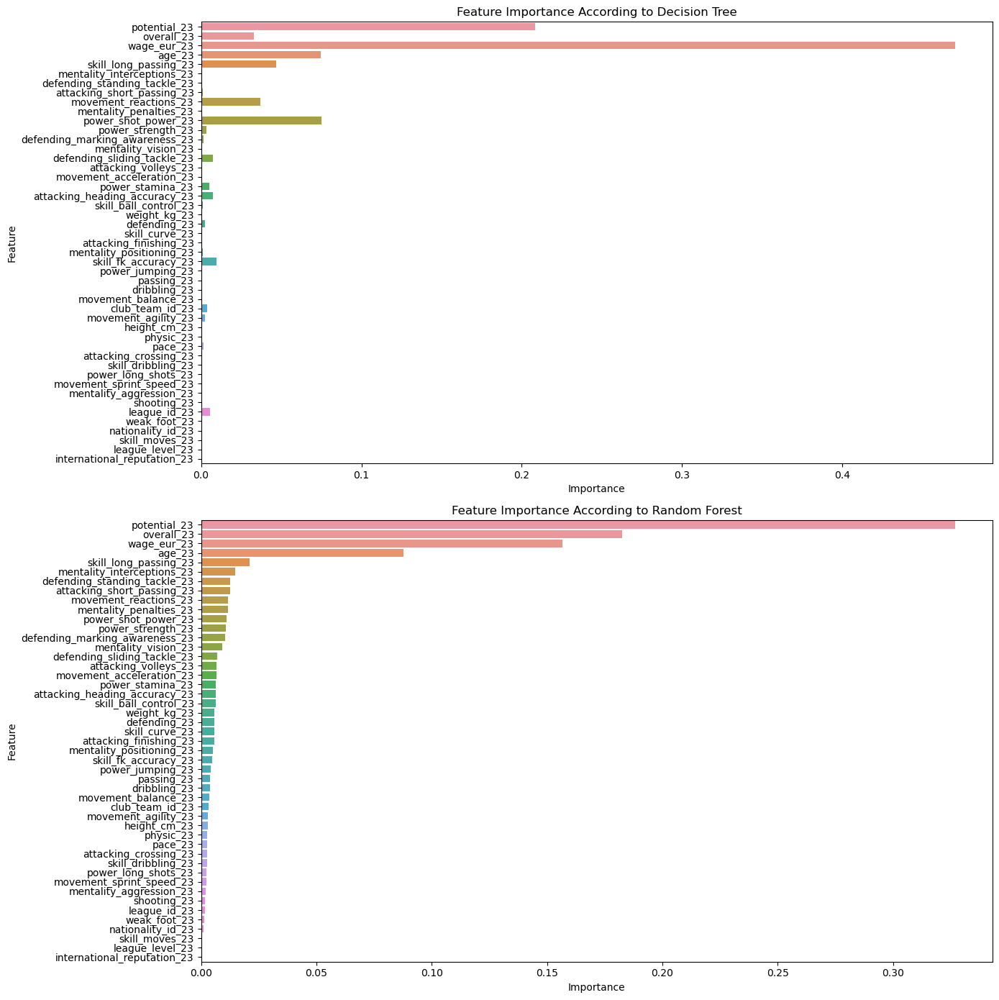

In [67]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming 'data' is your DataFrame and it has been loaded

# Filter data to select only goalkeepers
lateral_defenders = data_am_lat[data_am_lat['player_positions_23'].str.contains('LB|RB|LWB|RWB')]

# Define the chosen features for the model
chosen_features_23 = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
lateral_defenders['log_value_eur_24'] = np.log(lateral_defenders['value_eur_24'] + 1)

# Fill NaN values with 0
lateral_defenders = lateral_defenders.fillna(0)

# Select features and target variable
X = lateral_defenders[chosen_features_23]
y = lateral_defenders['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Train a Random Forest Regressor
forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X_train, y_train)

# Get feature importances
tree_importances = tree.feature_importances_
forest_importances = forest.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Decision Tree Importance': tree_importances,
    'Random Forest Importance': forest_importances
})

# Sort DataFrame by Random Forest Importance
importance_df = importance_df.sort_values(by='Random Forest Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(14, 14))
plt.subplot(2, 1, 1)
sns.barplot(x='Decision Tree Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Decision Tree')
plt.xlabel('Importance')

plt.subplot(2, 1, 2)
sns.barplot(x='Random Forest Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Random Forest')
plt.xlabel('Importance')

plt.tight_layout()
plt.show()

                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.943
Model:                            OLS   Adj. R-squared:                  0.898
Method:                 Least Squares   F-statistic:                     20.66
Date:                Wed, 05 Jun 2024   Prob (F-statistic):           2.34e-22
Time:                        19:52:43   Log-Likelihood:                 5.8543
No. Observations:                 102   AIC:                             80.29
Df Residuals:                      56   BIC:                             201.0
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2401562808.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lateral_defenders['log_value_eur_24'] = np.log(lateral_defenders['value_eur_24'] + 1)


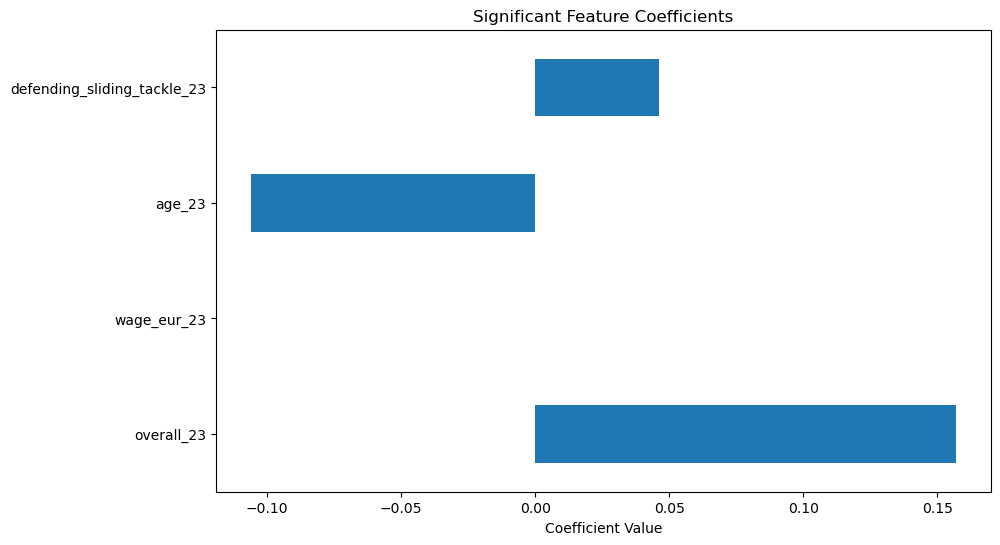

Ridge - R-squared: 0.8383164299203529, MSE: 0.1401160476003142, MAE: 0.3125443594376158
Lasso - R-squared: 0.8743570013607542, MSE: 0.10888305082149385, MAE: 0.23824417290945443
Random Forest - R-squared: 0.6987837660855606, MSE: 0.26103597383674926, MAE: 0.36338797600847317
ANN - R-squared: -210630.05485690344, MSE: 182534.26055533008, MAE: 396.6076607356211
           Model      R-squared            MSE         MAE
0          Ridge       0.838316       0.140116    0.312544
1          Lasso       0.874357       0.108883    0.238244
2  Random Forest       0.698784       0.261036    0.363388
3            ANN -210630.054857  182534.260555  396.607661
Most under-valued Lateral Defenders:        short_name_23  difference_million
91   Otávio Cairinho            2.315262
425         A. Nuñez            1.170681
19          I. Piris            1.043048
226  Douglas Armeira            0.655950
81       Enaldo Praz            0.576326
257      M. Espinoza            0.454669
319         R. Riva

In [69]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from sklearn.linear_model import Ridge, Lasso
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# Assuming 'data' is your DataFrame and it has been loaded

# Filter lateral defenders from the dataset
lateral_defenders = data_am_lat[data_am_lat['player_positions_23'].str.contains('LB|RB|LWB|RWB')]

# Define the chosen features for the model
chosen_features_23_lb = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
lateral_defenders['log_value_eur_24'] = np.log(lateral_defenders['value_eur_24'] + 1)

# Fill NaN values with 0
lateral_defenders = lateral_defenders.fillna(0)

# Create the formula for the OLS model
formula = 'log_value_eur_24 ~ ' + ' + '.join(chosen_features_23_lb)

# Fit the OLS model using the formula
model = ols(formula, data=lateral_defenders).fit()
print(model.summary())

# Perform ANOVA
anova_results = anova_lm(model)
print("\nANOVA table:\n", anova_results)

# Plot the importance of significant features
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'Intercept' in significant_features:
    significant_features.remove('Intercept')

coefs = model.params[significant_features]
coefs.plot(kind='barh', figsize=(10, 6))
plt.xlabel('Coefficient Value')
plt.title('Significant Feature Coefficients')
plt.show()

# Prepare data for other models
X = lateral_defenders[chosen_features_23_lb]
y = lateral_defenders['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model 1: Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
ridge_predictions = ridge.predict(X_test)

# Model 2: Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
lasso_predictions = lasso.predict(X_test)

# Model 3: Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_predictions = rf.predict(X_test)

# Model 4: ANN (MLP Regressor)
mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)
mlp_predictions = mlp.predict(X_test)

# Evaluate the models
def evaluate_model(y_test, predictions, model_name):
    r2 = r2_score(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    print(f"{model_name} - R-squared: {r2}, MSE: {mse}, MAE: {mae}")

evaluate_model(y_test, ridge_predictions, "Ridge")
evaluate_model(y_test, lasso_predictions, "Lasso")
evaluate_model(y_test, rf_predictions, "Random Forest")
evaluate_model(y_test, mlp_predictions, "ANN")

# Compare the models
models = ['Ridge', 'Lasso', 'Random Forest', 'ANN']
r2_scores = [r2_score(y_test, ridge_predictions), r2_score(y_test, lasso_predictions), r2_score(y_test, rf_predictions), r2_score(y_test, mlp_predictions)]
mse_scores = [mean_squared_error(y_test, ridge_predictions), mean_squared_error(y_test, lasso_predictions), mean_squared_error(y_test, rf_predictions), mean_squared_error(y_test, mlp_predictions)]
mae_scores = [mean_absolute_error(y_test, ridge_predictions), mean_absolute_error(y_test, lasso_predictions), mean_absolute_error(y_test, rf_predictions), mean_absolute_error(y_test, mlp_predictions)]

comparison = pd.DataFrame({
    'Model': models,
    'R-squared': r2_scores,
    'MSE': mse_scores,
    'MAE': mae_scores
})

print(comparison)

# Identify under-valued and over-valued lateral defenders based on the best model
best_model_name = 'Random Forest'  # Assuming Random Forest is the best model from comparison
best_model_predictions_log = rf.predict(X)
best_model_predictions = np.exp(best_model_predictions_log) - 1

lateral_defenders['predicted_value'] = best_model_predictions
lateral_defenders['predicted_value_million'] = lateral_defenders['predicted_value'] / 1_000_000
lateral_defenders['actual_value_million'] = lateral_defenders['value_eur_24'] / 1_000_000
lateral_defenders['difference_million'] = lateral_defenders['predicted_value_million'] - lateral_defenders['actual_value_million']

under_valued_ld = lateral_defenders[lateral_defenders['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_ld = lateral_defenders[lateral_defenders['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Lateral Defenders:", under_valued_ld[['short_name_23', 'difference_million']])
print("Most over-valued Lateral Defenders:", over_valued_ld[['short_name_23', 'difference_million']])

## Ridge Regression :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/3418087142.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lateral_defenders['log_value_eur_24'] = np.log(lateral_defenders['value_eur_24'] + 1)


Ridge coefficients: [ 0.00256937  0.          0.73885277  0.0444496   0.30853416 -0.50007061
  0.05830936 -0.00817667  0.07217695  0.12377229  0.          0.11331261
 -0.03809989  0.31508728  0.4052474  -0.57612625  0.37040144 -0.32504048
  0.48344435  0.11667404 -0.21230084  0.09091289  0.10616928  0.12672685
 -0.16794374 -0.0125627   0.13595536  0.13451929 -0.09924394 -0.12776535
 -0.06946925 -0.03607669 -0.04150177 -0.02546525 -0.1768364  -0.03449447
 -0.1337286  -0.28400202 -0.1525416  -0.23363131  0.04984455 -0.0191765
  0.14716851 -0.08131794  0.10506847  0.040173    0.19687996]
Most under-valued Lateral Defenders:         short_name_23  difference_million
143    Victorio Jabim            1.727266
88    Osvaldo Lodeiro            1.123310
129      Joshuando Sá            1.096491
130  Jonaldo Monteiro            0.796854
134      Germano Cuba            0.770496
141     Tony Muttinho            0.680915
128  Luisinho Conradi            0.625210
230         N. Loyola            0.

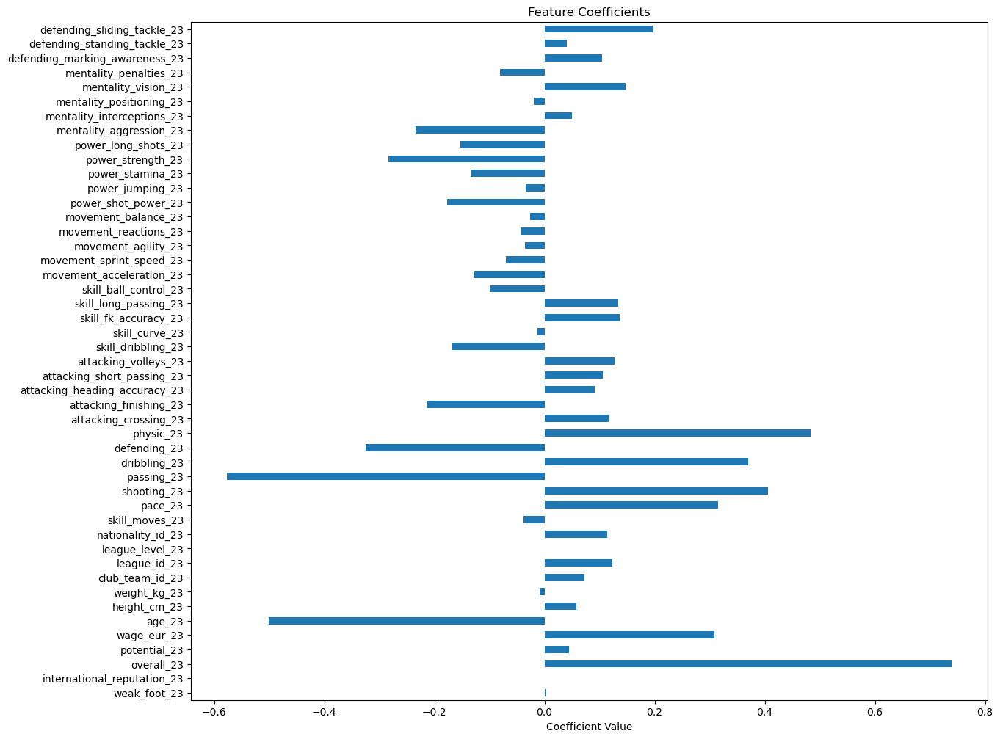

In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler


# Define the chosen features for the model
chosen_features_23_ld = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Filter lateral defenders from the dataset
lateral_defenders = data_am_lat[data_am_lat['player_positions_23'].str.contains('LB|RB|LWB|RWB')]

# Create a new column for the logarithmic transformation of 'value_eur_24'
lateral_defenders['log_value_eur_24'] = np.log(lateral_defenders['value_eur_24'] + 1)

# Fill NaN values with 0
lateral_defenders = lateral_defenders.fillna(0)

# Prepare data for Ridge model
X = lateral_defenders[chosen_features_23_ld]
y = lateral_defenders['log_value_eur_24']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit the Ridge model
ridge = Ridge(alpha=0.1)
ridge.fit(X_scaled, y)

# Print model coefficients
print(f'Ridge coefficients: {ridge.coef_}')

# Predict values on the entire dataset
lateral_defenders['predicted_log_value'] = ridge.predict(X_scaled)
lateral_defenders['predicted_value'] = np.exp(lateral_defenders['predicted_log_value']) - 1
lateral_defenders['predicted_value_million'] = lateral_defenders['predicted_value'] / 1_000_000
lateral_defenders['actual_value_million'] = lateral_defenders['value_eur_24'] / 1_000_000
lateral_defenders['difference_million'] = lateral_defenders['predicted_value_million'] - lateral_defenders['actual_value_million']

under_valued_ld = lateral_defenders[lateral_defenders['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_ld = lateral_defenders[lateral_defenders['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Lateral Defenders:", under_valued_ld[['short_name_23', 'difference_million']])
print("Most over-valued Lateral Defenders:", over_valued_ld[['short_name_23', 'difference_million']])

# Calculate performance metrics
r2 = r2_score(lateral_defenders['value_eur_24'], lateral_defenders['predicted_value'])
rmse = mean_squared_error(lateral_defenders['value_eur_24'], lateral_defenders['predicted_value'], squared=False)
mae = mean_absolute_error(lateral_defenders['value_eur_24'], lateral_defenders['predicted_value'])

print(f"R-squared: {r2}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")

# Plot the importance of significant features
coefs = pd.Series(ridge.coef_, index=chosen_features_23_ld)
coefs.plot(kind='barh', figsize=(14,12))
plt.xlabel('Coefficient Value')
plt.title('Feature Coefficients')
plt.show()

# CDM / CM / CAM Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/3140124495.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  central_midfielders['log_value_eur_24'] = np.log(central_midfielders['value_eur_24'] + 1)


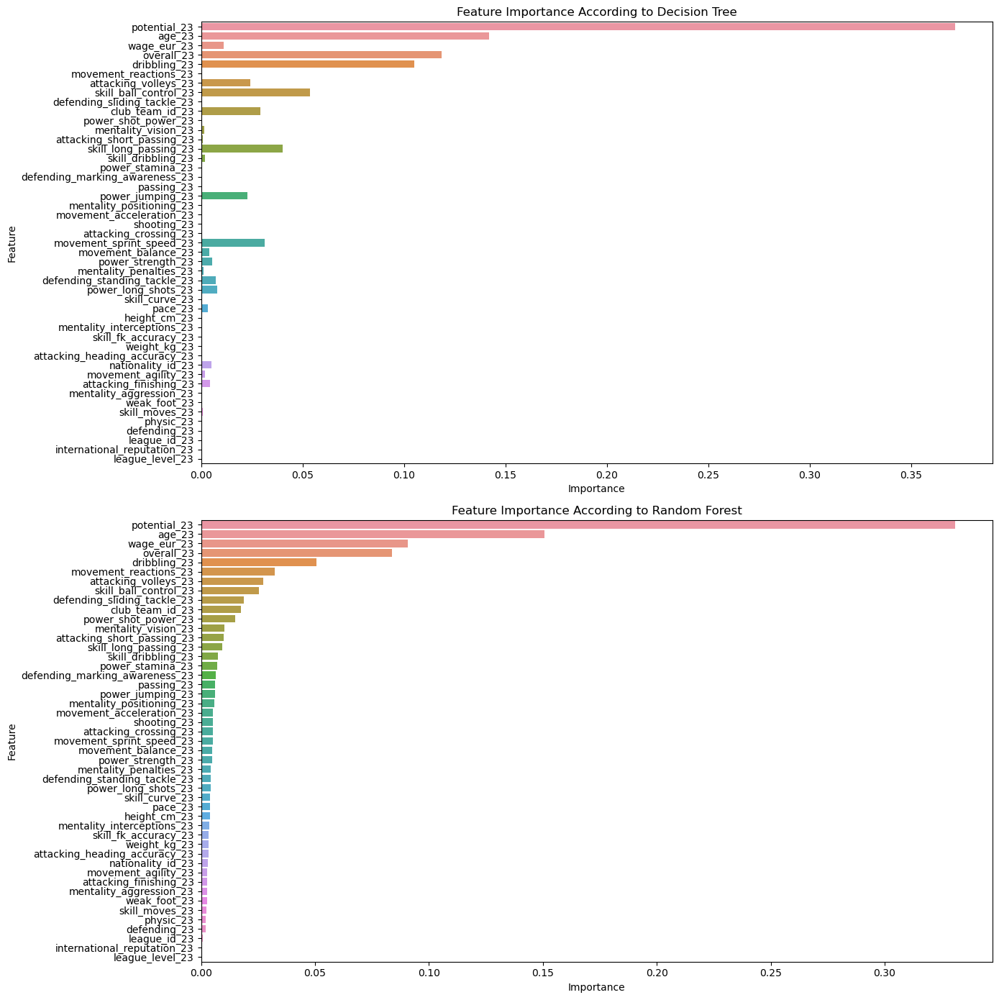

In [72]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming 'data' is your DataFrame and it has been loaded

# Filter data to select only goalkeepers
central_midfielders = data_am_lat[data_am_lat['player_positions_23'].str.contains('CDM|CM|CAM')]

# Define the chosen features for the model
chosen_features_23 = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
central_midfielders['log_value_eur_24'] = np.log(central_midfielders['value_eur_24'] + 1)

# Fill NaN values with 0
central_midfielders = central_midfielders.fillna(0)

# Select features and target variable
X = central_midfielders[chosen_features_23]
y = central_midfielders['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Train a Random Forest Regressor
forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X_train, y_train)

# Get feature importances
tree_importances = tree.feature_importances_
forest_importances = forest.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Decision Tree Importance': tree_importances,
    'Random Forest Importance': forest_importances
})

# Sort DataFrame by Random Forest Importance
importance_df = importance_df.sort_values(by='Random Forest Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(14, 14))
plt.subplot(2, 1, 1)
sns.barplot(x='Decision Tree Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Decision Tree')
plt.xlabel('Importance')

plt.subplot(2, 1, 2)
sns.barplot(x='Random Forest Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Random Forest')
plt.xlabel('Importance')

plt.tight_layout()
plt.show()

                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.890
Model:                            OLS   Adj. R-squared:                  0.841
Method:                 Least Squares   F-statistic:                     18.16
Date:                Wed, 05 Jun 2024   Prob (F-statistic):           9.58e-33
Time:                        20:01:59   Log-Likelihood:                -32.685
No. Observations:                 150   AIC:                             159.4
Df Residuals:                     103   BIC:                             300.9
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2498826027.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  central_midfielders['log_value_eur_24'] = np.log(central_midfielders['value_eur_24'] + 1)


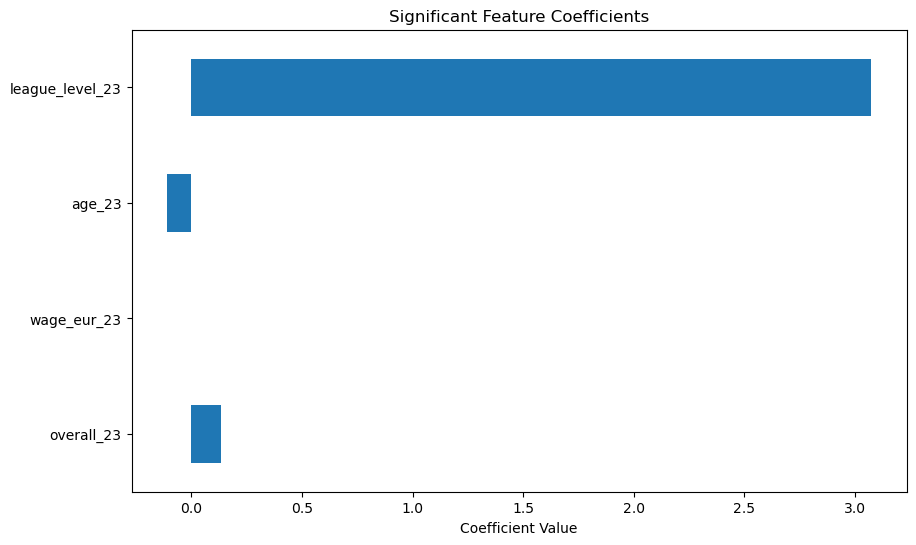

Ridge - R-squared: 0.8249503793403474, MSE: 0.19426779362683, MAE: 0.3642276891223384
Lasso - R-squared: 0.8469746721433553, MSE: 0.16982551975666565, MAE: 0.3419341022353935
Random Forest - R-squared: 0.783440238811729, MSE: 0.2403352080162235, MAE: 0.38363890638680936
ANN - R-squared: -183494.2141404681, MSE: 203640.6034918521, MAE: 434.84168693342815
           Model      R-squared            MSE         MAE
0          Ridge       0.824950       0.194268    0.364228
1          Lasso       0.846975       0.169826    0.341934
2  Random Forest       0.783440       0.240335    0.383639
3            ANN -183494.214140  203640.603492  434.841687
Most under-valued Central Midfielders:       short_name_23  difference_million
424         A. Vera            0.720607
5           M. Díaz            0.475625
126  Wagner Laranjo            0.401424
418     D. Portilla            0.382458
46      W. Mendieta            0.354530
..              ...                 ...
210  Claudio Mouria           

In [76]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from sklearn.linear_model import Ridge, Lasso
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# Assuming 'data' is your DataFrame and it has been loaded

# Filter central midfielders from the dataset
central_midfielders = data_am_lat[data_am_lat['player_positions_23'].str.contains('CM|CDM|CAM')]

# Define the chosen features for the model
chosen_features_23_cm = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
central_midfielders['log_value_eur_24'] = np.log(central_midfielders['value_eur_24'] + 1)

# Fill NaN values with 0
central_midfielders = central_midfielders.fillna(0)

# Create the formula for the OLS model
formula = 'log_value_eur_24 ~ ' + ' + '.join(chosen_features_23_cm)

# Fit the OLS model using the formula
model = ols(formula, data=central_midfielders).fit()
print(model.summary())

# Perform ANOVA
anova_results = anova_lm(model)
print("\nANOVA table:\n", anova_results)

# Plot the importance of significant features
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'Intercept' in significant_features:
    significant_features.remove('Intercept')

coefs = model.params[significant_features]
coefs.plot(kind='barh', figsize=(10, 6))
plt.xlabel('Coefficient Value')
plt.title('Significant Feature Coefficients')
plt.show()

# Prepare data for other models
X = central_midfielders[chosen_features_23_cm]
y = central_midfielders['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model 1: Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
ridge_predictions = ridge.predict(X_test)

# Model 2: Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
lasso_predictions = lasso.predict(X_test)

# Model 3: Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_predictions = rf.predict(X_test)

# Model 4: ANN (MLP Regressor)
mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)
mlp_predictions = mlp.predict(X_test)

# Evaluate the models
def evaluate_model(y_test, predictions, model_name):
    r2 = r2_score(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    print(f"{model_name} - R-squared: {r2}, MSE: {mse}, MAE: {mae}")

evaluate_model(y_test, ridge_predictions, "Ridge")
evaluate_model(y_test, lasso_predictions, "Lasso")
evaluate_model(y_test, rf_predictions, "Random Forest")
evaluate_model(y_test, mlp_predictions, "ANN")

# Compare the models
models = ['Ridge', 'Lasso', 'Random Forest', 'ANN']
r2_scores = [r2_score(y_test, ridge_predictions), r2_score(y_test, lasso_predictions), r2_score(y_test, rf_predictions), r2_score(y_test, mlp_predictions)]
mse_scores = [mean_squared_error(y_test, ridge_predictions), mean_squared_error(y_test, lasso_predictions), mean_squared_error(y_test, rf_predictions), mean_squared_error(y_test, mlp_predictions)]
mae_scores = [mean_absolute_error(y_test, ridge_predictions), mean_absolute_error(y_test, lasso_predictions), mean_absolute_error(y_test, rf_predictions), mean_absolute_error(y_test, mlp_predictions)]

comparison = pd.DataFrame({
    'Model': models,
    'R-squared': r2_scores,
    'MSE': mse_scores,
    'MAE': mae_scores
})

print(comparison)

# Identify under-valued and over-valued central midfielders based on the best model
best_model_name = 'Random Forest'  # Assuming Random Forest is the best model from comparison
best_model_predictions_log = rf.predict(X)
best_model_predictions = np.exp(best_model_predictions_log) - 1

central_midfielders['predicted_value'] = best_model_predictions
central_midfielders['predicted_value_million'] = central_midfielders['predicted_value'] / 1_000_000
central_midfielders['actual_value_million'] = central_midfielders['value_eur_24'] / 1_000_000
central_midfielders['difference_million'] = central_midfielders['predicted_value_million'] - central_midfielders['actual_value_million']

under_valued_cm = central_midfielders[central_midfielders['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_cm = central_midfielders[central_midfielders['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Central Midfielders:", under_valued_cm[['short_name_23', 'difference_million']])
print("Most over-valued Central Midfielders:", over_valued_cm[['short_name_23', 'difference_million']])

## Ridge Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2493774383.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  central_midfielders['log_value_eur_24'] = np.log(central_midfielders['value_eur_24'] + 1)


Most under-valued Central Midfielders:          short_name_23  difference_million
183    Ronaldo Cabrais            3.137997
38            L. Reyes            1.289516
170        Ansel Barni            1.272084
174     Leordinho Paes            1.184741
182      Jessé Ledeiro            0.870567
..                 ...                 ...
156     Vasquão Junior            0.018908
95        Welson Leima            0.013210
247        H. Quintana            0.009675
435        B. González            0.003447
213  R. Piris Da Motta            0.001044

[74 rows x 2 columns]
Most over-valued Central Midfielders:         short_name_23  difference_million
104   Rosival Dourado           -6.499880
99     Melvin Parrela           -4.294951
163   Sidney Pessinho           -2.698197
161      Elildo Petri           -1.665636
179    Adilson Edrada           -1.627285
..                ...                 ...
133  Silaldo Taffarel           -0.019420
378           J. Vera           -0.010471
46    

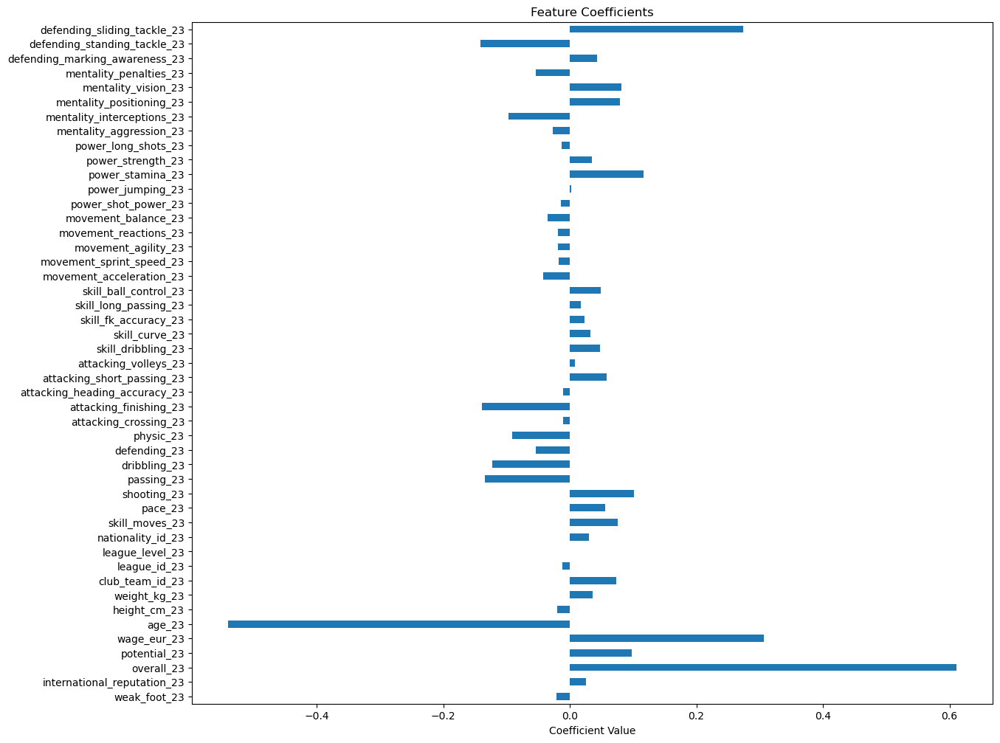

In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler

# Assuming 'data' is your DataFrame and it has been loaded

# Define the chosen features for the model
chosen_features_23_cm = ['weak_foot_23', 'international_reputation_23',
                         'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                         'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                         'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                         'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                         'attacking_finishing_23', 'attacking_heading_accuracy_23',
                         'attacking_short_passing_23', 'attacking_volleys_23',
                         'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                         'skill_long_passing_23', 'skill_ball_control_23',
                         'movement_acceleration_23', 'movement_sprint_speed_23',
                         'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                         'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                         'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                         'mentality_interceptions_23', 'mentality_positioning_23',
                         'mentality_vision_23', 'mentality_penalties_23',
                         'defending_marking_awareness_23', 'defending_standing_tackle_23',
                         'defending_sliding_tackle_23']

# Filter central midfielders from the dataset
central_midfielders = data_am_lat[data_am_lat['player_positions_23'].str.contains('CM|CDM|CAM')]

# Create a new column for the logarithmic transformation of 'value_eur_24'
central_midfielders['log_value_eur_24'] = np.log(central_midfielders['value_eur_24'] + 1)

# Fill NaN values with 0
central_midfielders = central_midfielders.fillna(0)

# Prepare data for Ridge regression
X = central_midfielders[chosen_features_23_cm]
y = central_midfielders['log_value_eur_24']

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit the Ridge regression model
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_scaled, y)

# Predict values on the entire dataset
central_midfielders['predicted_log_value'] = ridge_model.predict(X_scaled)
central_midfielders['predicted_value'] = np.exp(central_midfielders['predicted_log_value']) - 1
central_midfielders['predicted_value_million'] = central_midfielders['predicted_value'] / 1_000_000
central_midfielders['actual_value_million'] = central_midfielders['value_eur_24'] / 1_000_000
central_midfielders['difference_million'] = central_midfielders['predicted_value_million'] - central_midfielders['actual_value_million']

under_valued_cm = central_midfielders[central_midfielders['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_cm = central_midfielders[central_midfielders['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Central Midfielders:", under_valued_cm[['short_name_23', 'difference_million']])
print("Most over-valued Central Midfielders:", over_valued_cm[['short_name_23', 'difference_million']])

# Calculate performance metrics
r2 = r2_score(central_midfielders['value_eur_24'], central_midfielders['predicted_value'])
rmse = mean_squared_error(central_midfielders['value_eur_24'], central_midfielders['predicted_value'], squared=False)
mae = mean_absolute_error(central_midfielders['value_eur_24'], central_midfielders['predicted_value'])

print(f"R-squared: {r2}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")

# Plot the importance of significant features
coefs = pd.Series(ridge_model.coef_, index=chosen_features_23_cm)
coefs.plot(kind='barh', figsize=(14,12))
plt.xlabel('Coefficient Value')
plt.title('Feature Coefficients')
plt.show()

# LM / RM / LW / RW Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/1563676338.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lateral_midfielders['log_value_eur_24'] = np.log(lateral_midfielders['value_eur_24'] + 1)


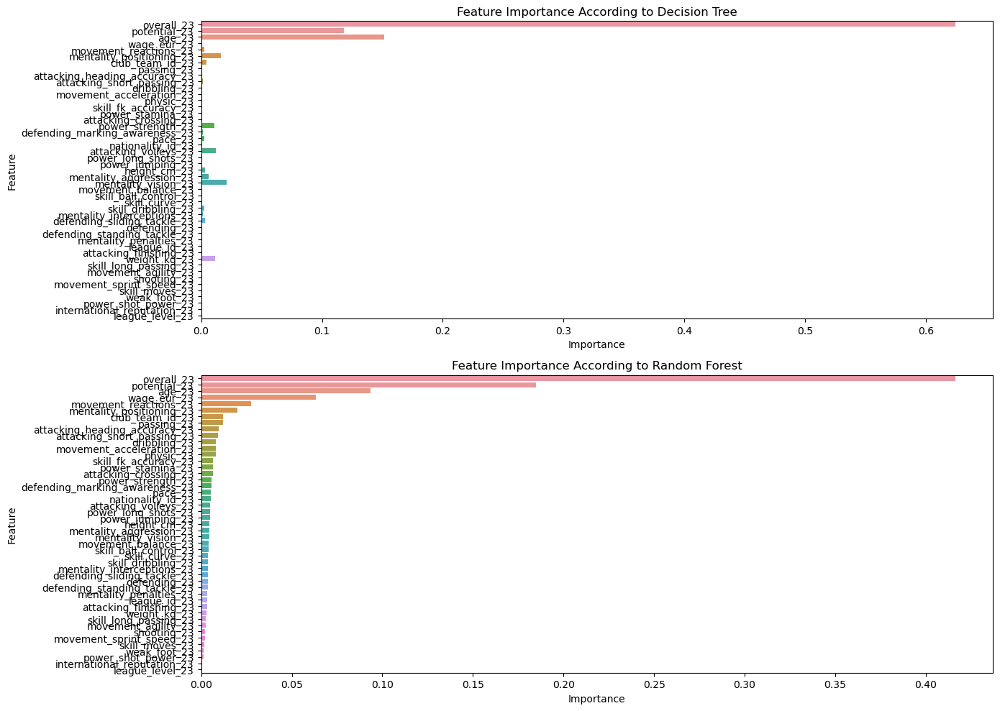

In [79]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming 'data' is your DataFrame and it has been loaded

# Filter data to select only goalkeepers
lateral_midfielders = data_am_lat[data_am_lat['player_positions_23'].str.contains('LM|RM|RW|LW')]

# Define the chosen features for the model
chosen_features_23 = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
lateral_midfielders['log_value_eur_24'] = np.log(lateral_midfielders['value_eur_24'] + 1)

# Fill NaN values with 0
lateral_midfielders = lateral_midfielders.fillna(0)

# Select features and target variable
X = lateral_midfielders[chosen_features_23]
y = lateral_midfielders['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Train a Random Forest Regressor
forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X_train, y_train)

# Get feature importances
tree_importances = tree.feature_importances_
forest_importances = forest.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Decision Tree Importance': tree_importances,
    'Random Forest Importance': forest_importances
})

# Sort DataFrame by Random Forest Importance
importance_df = importance_df.sort_values(by='Random Forest Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(14, 10))
plt.subplot(2, 1, 1)
sns.barplot(x='Decision Tree Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Decision Tree')
plt.xlabel('Importance')

plt.subplot(2, 1, 2)
sns.barplot(x='Random Forest Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Random Forest')
plt.xlabel('Importance')

plt.tight_layout()
plt.show()

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2330090059.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lateral_midfielders_wingers['log_value_eur_24'] = np.log(lateral_midfielders_wingers['value_eur_24'] + 1)


                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.918
Model:                            OLS   Adj. R-squared:                  0.872
Method:                 Least Squares   F-statistic:                     20.18
Date:                Wed, 05 Jun 2024   Prob (F-statistic):           9.03e-30
Time:                        20:07:39   Log-Likelihood:                -3.3067
No. Observations:                 130   AIC:                             100.6
Df Residuals:                      83   BIC:                             235.4
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

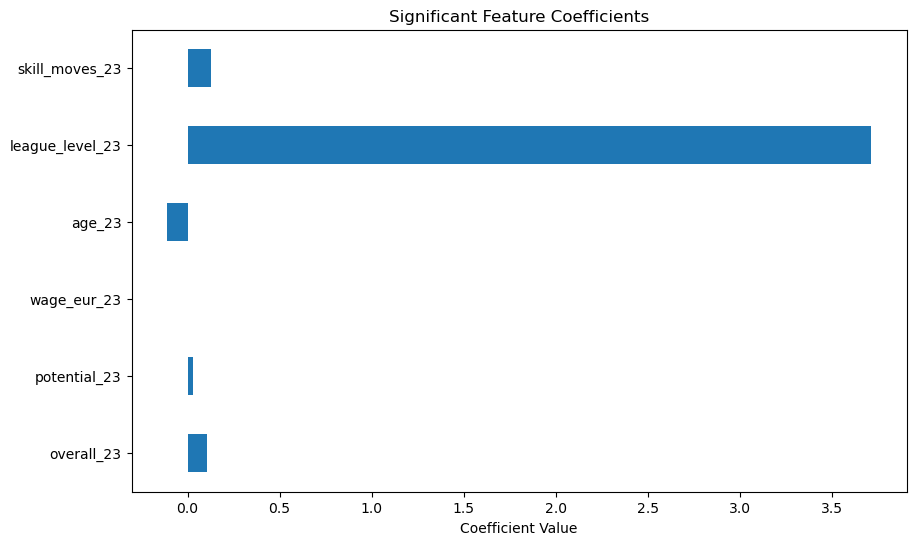

Ridge - R-squared: 0.7666779347853, MSE: 0.15910031400482916, MAE: 0.33132404083017164
Lasso - R-squared: 0.8736061978274681, MSE: 0.08618684904665906, MAE: 0.24505831426814068
Random Forest - R-squared: 0.8756470281289852, MSE: 0.08479522437754267, MAE: 0.23335341837461337
ANN - R-squared: -296850.33598927077, MSE: 202420.37856636645, MAE: 430.8602693243538
           Model      R-squared            MSE         MAE
0          Ridge       0.766678       0.159100    0.331324
1          Lasso       0.873606       0.086187    0.245058
2  Random Forest       0.875647       0.084795    0.233353
3            ANN -296850.335989  202420.378566  430.860269
Most under-valued Lateral Midfielders/Wingers:          short_name_23  difference_million
154     Fabrio Farinha            1.016785
268        A. Ugarriza            0.678751
81         Enaldo Praz            0.593375
329         J. Cáceres            0.548698
181       Dersan Dinis            0.389885
157      Murilo Sancha            0.382

In [80]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from sklearn.linear_model import Ridge, Lasso
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# Assuming 'data' is your DataFrame and it has been loaded

# Filter lateral midfielders and wingers from the dataset
lateral_midfielders_wingers = data_am_lat[data_am_lat['player_positions_23'].str.contains('LM|RM|LW|RW')]

# Define the chosen features for the model
chosen_features_23_lmw = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
lateral_midfielders_wingers['log_value_eur_24'] = np.log(lateral_midfielders_wingers['value_eur_24'] + 1)

# Fill NaN values with 0
lateral_midfielders_wingers = lateral_midfielders_wingers.fillna(0)

# Create the formula for the OLS model
formula = 'log_value_eur_24 ~ ' + ' + '.join(chosen_features_23_lmw)

# Fit the OLS model using the formula
model = ols(formula, data=lateral_midfielders_wingers).fit()
print(model.summary())

# Perform ANOVA
anova_results = anova_lm(model)
print("\nANOVA table:\n", anova_results)

# Plot the importance of significant features
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'Intercept' in significant_features:
    significant_features.remove('Intercept')

coefs = model.params[significant_features]
coefs.plot(kind='barh', figsize=(10, 6))
plt.xlabel('Coefficient Value')
plt.title('Significant Feature Coefficients')
plt.show()

# Prepare data for other models
X = lateral_midfielders_wingers[chosen_features_23_lmw]
y = lateral_midfielders_wingers['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model 1: Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
ridge_predictions = ridge.predict(X_test)

# Model 2: Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
lasso_predictions = lasso.predict(X_test)

# Model 3: Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_predictions = rf.predict(X_test)

# Model 4: ANN (MLP Regressor)
mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)
mlp_predictions = mlp.predict(X_test)

# Evaluate the models
def evaluate_model(y_test, predictions, model_name):
    r2 = r2_score(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    print(f"{model_name} - R-squared: {r2}, MSE: {mse}, MAE: {mae}")

evaluate_model(y_test, ridge_predictions, "Ridge")
evaluate_model(y_test, lasso_predictions, "Lasso")
evaluate_model(y_test, rf_predictions, "Random Forest")
evaluate_model(y_test, mlp_predictions, "ANN")

# Compare the models
models = ['Ridge', 'Lasso', 'Random Forest', 'ANN']
r2_scores = [r2_score(y_test, ridge_predictions), r2_score(y_test, lasso_predictions), r2_score(y_test, rf_predictions), r2_score(y_test, mlp_predictions)]
mse_scores = [mean_squared_error(y_test, ridge_predictions), mean_squared_error(y_test, lasso_predictions), mean_squared_error(y_test, rf_predictions), mean_squared_error(y_test, mlp_predictions)]
mae_scores = [mean_absolute_error(y_test, ridge_predictions), mean_absolute_error(y_test, lasso_predictions), mean_absolute_error(y_test, rf_predictions), mean_absolute_error(y_test, mlp_predictions)]

comparison = pd.DataFrame({
    'Model': models,
    'R-squared': r2_scores,
    'MSE': mse_scores,
    'MAE': mae_scores
})

print(comparison)

# Identify under-valued and over-valued lateral midfielders/wingers based on the best model
best_model_name = 'Random Forest'  # Assuming Random Forest is the best model from comparison
best_model_predictions_log = rf.predict(X)
best_model_predictions = np.exp(best_model_predictions_log) - 1

lateral_midfielders_wingers['predicted_value'] = best_model_predictions
lateral_midfielders_wingers['predicted_value_million'] = lateral_midfielders_wingers['predicted_value'] / 1_000_000
lateral_midfielders_wingers['actual_value_million'] = lateral_midfielders_wingers['value_eur_24'] / 1_000_000
lateral_midfielders_wingers['difference_million'] = lateral_midfielders_wingers['predicted_value_million'] - lateral_midfielders_wingers['actual_value_million']

under_valued_lmw = lateral_midfielders_wingers[lateral_midfielders_wingers['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_lmw = lateral_midfielders_wingers[lateral_midfielders_wingers['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Lateral Midfielders/Wingers:", under_valued_lmw[['short_name_23', 'difference_million']])
print("Most over-valued Lateral Midfielders/Wingers:", over_valued_lmw[['short_name_23', 'difference_million']])

## Ridge Regression :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2184262522.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lateral_midfielders['log_value_eur_24'] = np.log(lateral_midfielders['value_eur_24'] + 1)


Most under-valued Lateral Midfielders:         short_name_23  difference_million
137        Hediselton            5.450885
134      Germano Cuba            1.718816
130  Jonaldo Monteiro            1.016443
107   Nicolás Formido            0.960396
113     Eltildo Bessa            0.892156
..                ...                 ...
243       E. Wiemberg            0.004539
215        A. Hohberg            0.002990
269      A. Rodríguez            0.001427
346      V. Rodríguez            0.000752
3           G. Castro            0.000291

[71 rows x 2 columns]
Most over-valued Lateral Midfielders:         short_name_23  difference_million
183   Ronaldo Cabrais           -5.951559
103      Adryan Zonta           -5.451956
79       Gerson Armão           -4.832058
82    Maikel Catarino           -4.581042
322        A. Aravena           -2.483332
152      Murildo Kauê           -2.100414
25        D. González           -1.674466
143    Victorio Jabim           -1.527172
18       L. Melgar

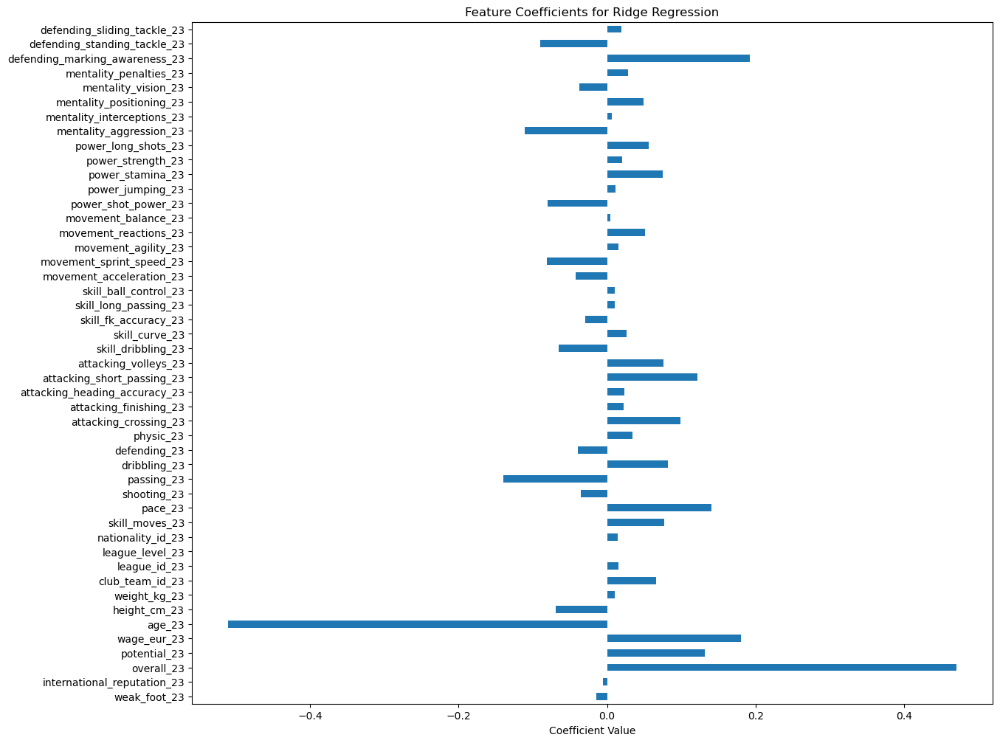

In [81]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler

# Define the chosen features for the model
chosen_features_23_lm = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Assuming 'data' is your DataFrame and it has been loaded
# Filter lateral midfielders from the dataset
lateral_midfielders = data_am_lat[data_am_lat['player_positions_23'].str.contains('LM|RM|LW|RW')]

# Create a new column for the logarithmic transformation of 'value_eur_24'
lateral_midfielders['log_value_eur_24'] = np.log(lateral_midfielders['value_eur_24'] + 1)

# Fill NaN values with 0
lateral_midfielders = lateral_midfielders.fillna(0)

# Prepare data for Ridge regression
X = lateral_midfielders[chosen_features_23_lm]
y = lateral_midfielders['log_value_eur_24']

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit the Ridge regression model
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_scaled, y)

# Predict values on the entire dataset
lateral_midfielders['predicted_log_value'] = ridge_model.predict(X_scaled)
lateral_midfielders['predicted_value'] = np.exp(lateral_midfielders['predicted_log_value']) - 1
lateral_midfielders['predicted_value_million'] = lateral_midfielders['predicted_value'] / 1_000_000
lateral_midfielders['actual_value_million'] = lateral_midfielders['value_eur_24'] / 1_000_000
lateral_midfielders['difference_million'] = lateral_midfielders['predicted_value_million'] - lateral_midfielders['actual_value_million']

under_valued_lm = lateral_midfielders[lateral_midfielders['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_lm = lateral_midfielders[lateral_midfielders['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Lateral Midfielders:", under_valued_lm[['short_name_23', 'difference_million']])
print("Most over-valued Lateral Midfielders:", over_valued_lm[['short_name_23', 'difference_million']])

# Calculate performance metrics
r2 = r2_score(lateral_midfielders['value_eur_24'], lateral_midfielders['predicted_value'])
rmse = mean_squared_error(lateral_midfielders['value_eur_24'], lateral_midfielders['predicted_value'], squared=False)
mae = mean_absolute_error(lateral_midfielders['value_eur_24'], lateral_midfielders['predicted_value'])

print(f"R-squared: {r2}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")

# Plot the importance of significant features
coefs = pd.Series(ridge_model.coef_, index=chosen_features_23_lm)
coefs.plot(kind='barh', figsize=(14,12))
plt.xlabel('Coefficient Value')
plt.title('Feature Coefficients for Ridge Regression')
plt.show()

# ST / CF Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2959337791.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  central_forwards['log_value_eur_24'] = np.log(central_forwards['value_eur_24'] + 1)


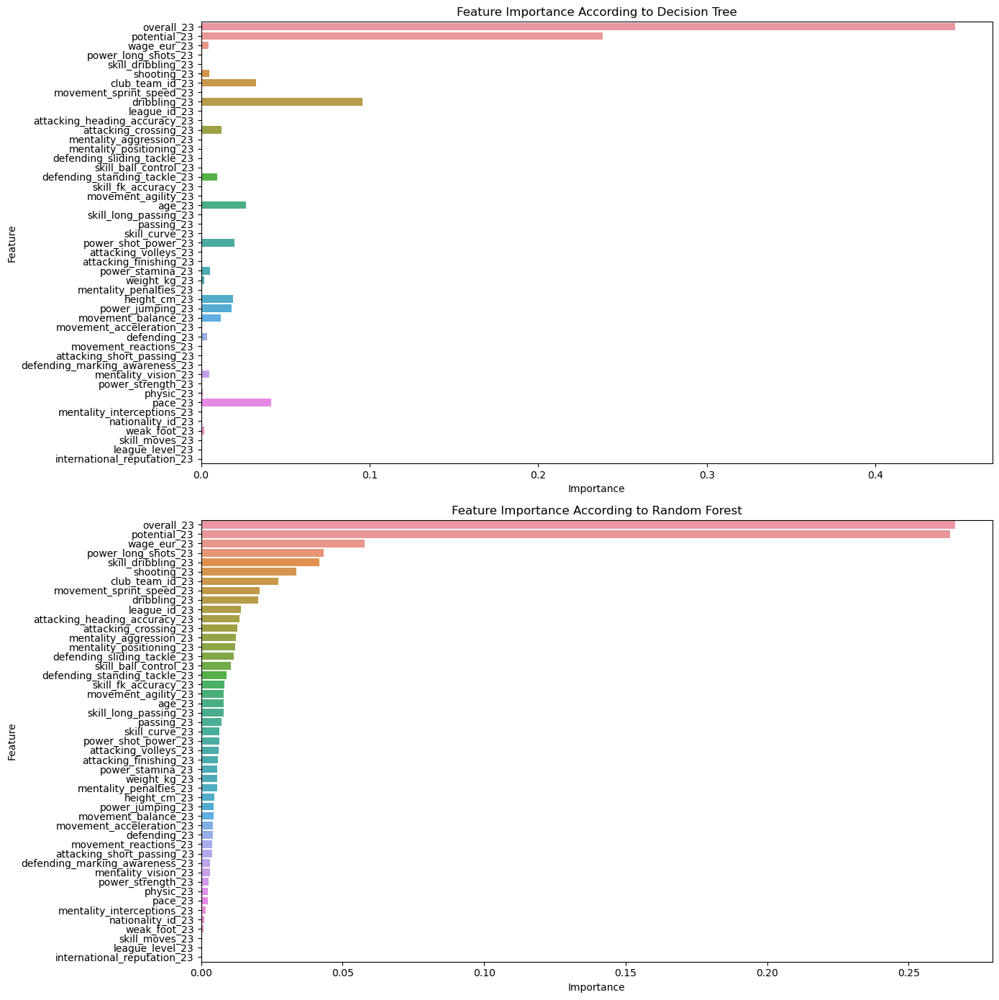

In [82]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming 'data' is your DataFrame and it has been loaded

# Filter data to select only goalkeepers
central_forwards = data_am_lat[data_am_lat['player_positions_23'].str.contains('CF|ST')]

# Define the chosen features for the model
chosen_features_23 = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
central_forwards['log_value_eur_24'] = np.log(central_forwards['value_eur_24'] + 1)

# Fill NaN values with 0
central_forwards = central_forwards.fillna(0)

# Select features and target variable
X = central_forwards[chosen_features_23]
y = central_forwards['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Train a Random Forest Regressor
forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X_train, y_train)

# Get feature importances
tree_importances = tree.feature_importances_
forest_importances = forest.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Decision Tree Importance': tree_importances,
    'Random Forest Importance': forest_importances
})

# Sort DataFrame by Random Forest Importance
importance_df = importance_df.sort_values(by='Random Forest Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(14, 14))
plt.subplot(2, 1, 1)
sns.barplot(x='Decision Tree Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Decision Tree')
plt.xlabel('Importance')

plt.subplot(2, 1, 2)
sns.barplot(x='Random Forest Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Random Forest')
plt.xlabel('Importance')

plt.tight_layout()
plt.show()

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/1330289561.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  central_forwards['log_value_eur_24'] = np.log(central_forwards['value_eur_24'] + 1)


                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.947
Model:                            OLS   Adj. R-squared:                  0.825
Method:                 Least Squares   F-statistic:                     7.768
Date:                Wed, 05 Jun 2024   Prob (F-statistic):           3.83e-06
Time:                        20:12:27   Log-Likelihood:                 8.7711
No. Observations:                  67   AIC:                             76.46
Df Residuals:                      20   BIC:                             180.1
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

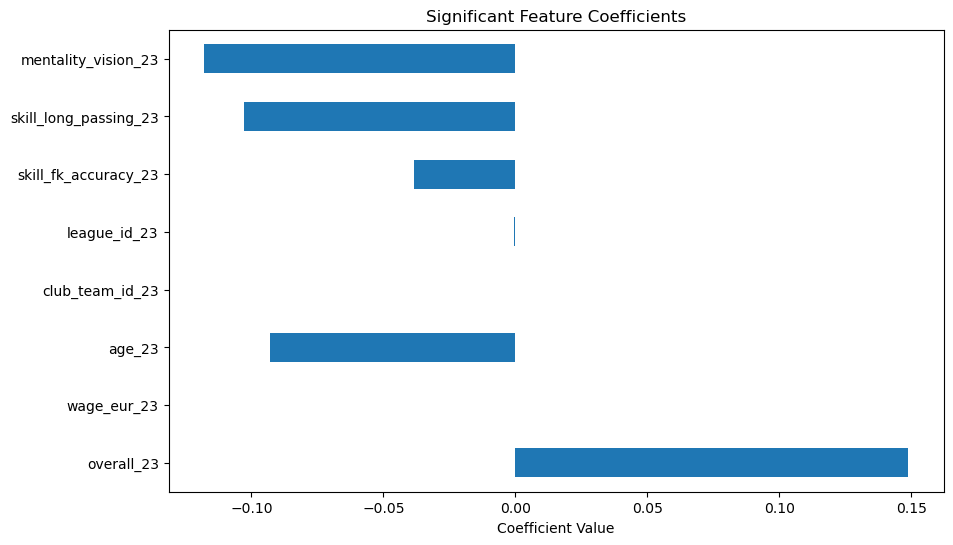

Ridge - R-squared: 0.42102722128076053, MSE: 0.6669525540393738, MAE: 0.6537288911412087
Lasso - R-squared: 0.7514630479548041, MSE: 0.28630422885578827, MAE: 0.42220989997377295
Random Forest - R-squared: 0.6965491243859387, MSE: 0.34956278421930087, MAE: 0.4916908571330329
ANN - R-squared: -147131.65521494794, MSE: 169490.697637428, MAE: 373.7316853326782
           Model      R-squared            MSE         MAE
0          Ridge       0.421027       0.666953    0.653729
1          Lasso       0.751463       0.286304    0.422210
2  Random Forest       0.696549       0.349563    0.491691
3            ANN -147131.655215  169490.697637  373.731685
Most under-valued Central Forwards:         short_name_23  difference_million
2             I. Sosa            1.124929
281          E. Rivas            0.963418
168       Fredditinho            0.957675
202       F. Zampedri            0.919313
421       B. Portugal            0.453217
57      C. Bordacahar            0.410100
37           P.

In [84]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from sklearn.linear_model import Ridge, Lasso
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# Assuming 'data' is your DataFrame and it has been loaded

# Filter central forwards from the dataset
central_forwards = data_am_lat[data_am_lat['player_positions_23'].str.contains('CF|ST')]

# Define the chosen features for the model
chosen_features_23_cf = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
central_forwards['log_value_eur_24'] = np.log(central_forwards['value_eur_24'] + 1)

# Fill NaN values with 0
central_forwards = central_forwards.fillna(0)

# Create the formula for the OLS model
formula = 'log_value_eur_24 ~ ' + ' + '.join(chosen_features_23_cf)

# Fit the OLS model using the formula
model = ols(formula, data=central_forwards).fit()
print(model.summary())

# Perform ANOVA
anova_results = anova_lm(model)
print("\nANOVA table:\n", anova_results)

# Plot the importance of significant features
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'Intercept' in significant_features:
    significant_features.remove('Intercept')

coefs = model.params[significant_features]
coefs.plot(kind='barh', figsize=(10, 6))
plt.xlabel('Coefficient Value')
plt.title('Significant Feature Coefficients')
plt.show()

# Prepare data for other models
X = central_forwards[chosen_features_23_cf]
y = central_forwards['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model 1: Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
ridge_predictions = ridge.predict(X_test)

# Model 2: Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
lasso_predictions = lasso.predict(X_test)

# Model 3: Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_predictions = rf.predict(X_test)

# Model 4: ANN (MLP Regressor)
mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)
mlp_predictions = mlp.predict(X_test)

# Evaluate the models
def evaluate_model(y_test, predictions, model_name):
    r2 = r2_score(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    print(f"{model_name} - R-squared: {r2}, MSE: {mse}, MAE: {mae}")

evaluate_model(y_test, ridge_predictions, "Ridge")
evaluate_model(y_test, lasso_predictions, "Lasso")
evaluate_model(y_test, rf_predictions, "Random Forest")
evaluate_model(y_test, mlp_predictions, "ANN")

# Compare the models
models = ['Ridge', 'Lasso', 'Random Forest', 'ANN']
r2_scores = [r2_score(y_test, ridge_predictions), r2_score(y_test, lasso_predictions), r2_score(y_test, rf_predictions), r2_score(y_test, mlp_predictions)]
mse_scores = [mean_squared_error(y_test, ridge_predictions), mean_squared_error(y_test, lasso_predictions), mean_squared_error(y_test, rf_predictions), mean_squared_error(y_test, mlp_predictions)]
mae_scores = [mean_absolute_error(y_test, ridge_predictions), mean_absolute_error(y_test, lasso_predictions), mean_absolute_error(y_test, rf_predictions), mean_absolute_error(y_test, mlp_predictions)]

comparison = pd.DataFrame({
    'Model': models,
    'R-squared': r2_scores,
    'MSE': mse_scores,
    'MAE': mae_scores
})

print(comparison)

# Identify under-valued and over-valued central forwards based on the best model
best_model_name = 'Random Forest'  # Assuming Random Forest is the best model from comparison
best_model_predictions_log = rf.predict(X)
best_model_predictions = np.exp(best_model_predictions_log) - 1

central_forwards['predicted_value'] = best_model_predictions
central_forwards['predicted_value_million'] = central_forwards['predicted_value'] / 1_000_000
central_forwards['actual_value_million'] = central_forwards['value_eur_24'] / 1_000_000
central_forwards['difference_million'] = central_forwards['predicted_value_million'] - central_forwards['actual_value_million']

under_valued_cf = central_forwards[central_forwards['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_cf = central_forwards[central_forwards['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Central Forwards:", under_valued_cf[['short_name_23', 'difference_million']])
print("Most over-valued Central Forwards:", over_valued_cf[['short_name_23', 'difference_million']])

## Ridge Regression Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2874032836.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  central_forwards['log_value_eur_24'] = np.log(central_forwards['value_eur_24'] + 1)


Most under-valued Central Forwards:          short_name_23  difference_million
165      Nuno Lisareda            2.183560
280         I. Ramírez            0.900825
2              I. Sosa            0.819270
193    Leandro Vivenço            0.697802
108  Gustavo Lobateiro            0.631665
323           G. Tapia            0.601917
281           E. Rivas            0.546683
188      Gérson Noalha            0.511328
408         R. Sanchez            0.437767
403         S. Herrera            0.436960
37            P. Rubio            0.313269
325          D. Duarte            0.282035
268        A. Ugarriza            0.272066
287           I. Antón            0.259056
113      Eltildo Bessa            0.251116
233          B. Cuesta            0.219350
421        B. Portugal            0.161706
117    Arthur Silbeira            0.144808
328       S. Guarirapa            0.141044
434         A. Alcaraz            0.135606
184    Adrián Burnabão            0.133587
344       M. Monze

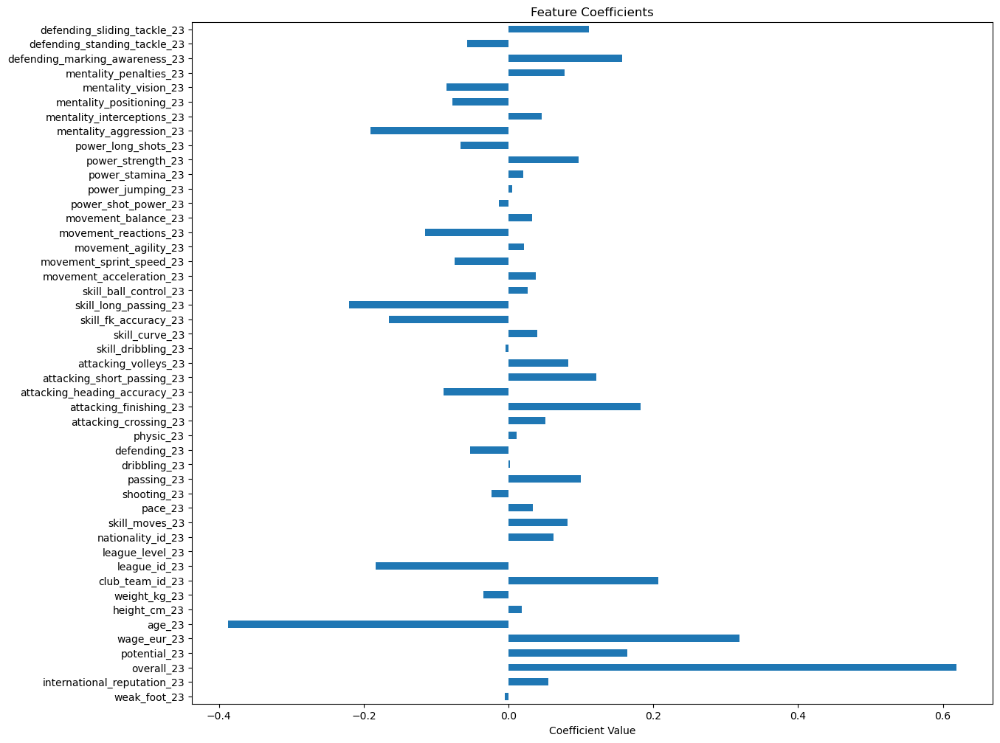

In [85]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler

# Define the chosen features for the model
chosen_features_23_cf = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Filter central forwards from the dataset
central_forwards = data_am_lat[data_am_lat['player_positions_23'].str.contains('CF|ST')]

# Create a new column for the logarithmic transformation of 'value_eur_24'
central_forwards['log_value_eur_24'] = np.log(central_forwards['value_eur_24'] + 1)

# Fill NaN values with 0
central_forwards = central_forwards.fillna(0)

# Prepare data for Ridge model
X = central_forwards[chosen_features_23_cf]
y = central_forwards['log_value_eur_24']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit the Ridge model
ridge = Ridge(alpha=1.0)
ridge.fit(X_scaled, y)

# Predict values on the entire dataset
central_forwards['predicted_log_value'] = ridge.predict(X_scaled)
central_forwards['predicted_value'] = np.exp(central_forwards['predicted_log_value']) - 1
central_forwards['predicted_value_million'] = central_forwards['predicted_value'] / 1_000_000
central_forwards['actual_value_million'] = central_forwards['value_eur_24'] / 1_000_000
central_forwards['difference_million'] = central_forwards['predicted_value_million'] - central_forwards['actual_value_million']

under_valued_cf = central_forwards[central_forwards['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_cf = central_forwards[central_forwards['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Central Forwards:", under_valued_cf[['short_name_23', 'difference_million']])
print("Most over-valued Central Forwards:", over_valued_cf[['short_name_23', 'difference_million']])

# Calculate performance metrics
r2 = r2_score(central_forwards['value_eur_24'], central_forwards['predicted_value'])
rmse = mean_squared_error(central_forwards['value_eur_24'], central_forwards['predicted_value'], squared=False)
mae = mean_absolute_error(central_forwards['value_eur_24'], central_forwards['predicted_value'])

print(f"R-squared: {r2}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")

# Plot the importance of significant features
coefs = pd.Series(ridge.coef_, index=X.columns)
coefs.plot(kind='barh', figsize=(14,12))
plt.xlabel('Coefficient Value')
plt.title('Feature Coefficients')
plt.show()

# PART 2 - FOCUS TOUS LES JOUEURS TOP 5 CHAMPIONNATS EUROPEENS 

## + Grande échelle 

On veut garder ici tous les joueurs présents sur FIFA 23 et FIFA 24 dans les Top 5 Grands Championnats Européens :
- Premier League
- Serie A
- Bundesliga
- La Liga
- Ligue 1

## FIFA 23 :

In [88]:
data_23 = pd.read_excel('data_fifa_23.xlsx')
data_23.head()

,player_id,player_url,fifa_version,fifa_update,update_as_of,short_name,long_name,player_positions,overall,potential,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,1179,/player/1179/gianluigi-buffon/230002,23,2,2022-09-26,G. Buffon,Gianluigi Buffon,GK,79,79,...,32+3,32+3,32+3,27+3,26+3,28+3,28+3,28+3,26+3,78+1
1,2147,/player/2147/maarten-stekelenburg/230002,23,2,2022-09-26,M. Stekelenburg,Maarten Stekelenburg,GK,74,74,...,32+2,32+2,32+2,27+2,26+2,29+2,29+2,29+2,26+2,73+1
2,3467,/player/3467/yuri-de-souza-fonseca/230002,23,2,2022-09-26,Yuri,Yuri de Souza Fonseca,ST,72,72,...,52+2,52+2,52+2,52+2,49+2,49+2,49+2,49+2,49+2,15+2
3,18115,/player/18115/ruben-miguel-santos-fernandes/23...,23,2,2022-09-26,Rúben Fernandes,Rúben Miguel Marques dos Santos Fernandes,CB,71,71,...,69+2,69+2,69+2,66+2,68+2,71,71,71,68+2,18+2
4,18122,/player/18122/nicolas-penneteau/230002,23,2,2022-09-26,N. Penneteau,Nicolas Penneteau,GK,67,67,...,28+2,28+2,28+2,24+2,23+2,27+2,27+2,27+2,23+2,66+1


In [95]:
leagues_to_keep_23 = ["Bundesliga", "Liga", "Ligue 1", "Premier League", "Serie A"]

# Filtrage des données
Filtered_data_23 = data_23[data_23['league_name'].isin(leagues_to_keep)]

# Affichage des premières lignes du dataframe filtré pour vérifier
Filtered_data_23.head()

,player_id,player_url,fifa_version,fifa_update,update_as_of,short_name,long_name,player_positions,overall,potential,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
4,18122,/player/18122/nicolas-penneteau/230002,23,2,2022-09-26,N. Penneteau,Nicolas Penneteau,GK,67,67,...,28+2,28+2,28+2,24+2,23+2,27+2,27+2,27+2,23+2,66+1
6,20801,/player/20801/c-ronaldo-dos-santos-aveiro/230002,23,2,2022-09-26,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,ST,90,90,...,59+3,59+3,59+3,62+3,58+3,53+3,53+3,53+3,58+3,20+3
9,41236,/player/41236/zlatan-ibrahimovic/230002,23,2,2022-09-26,Z. Ibrahimović,Zlatan Ibrahimović,ST,82,82,...,56+3,56+3,56+3,51+3,49+3,52+3,52+3,52+3,49+3,19+3
14,52326,/player/52326/eldin-jakupovic/230002,23,2,2022-09-26,E. Jakupović,Eldin Jakupović,GK,63,63,...,30+2,30+2,30+2,24+2,23+2,26+2,26+2,26+2,23+2,62+1
19,106795,/player/106795/gianluca-pegolo/230002,23,2,2022-09-26,G. Pegolo,Gianluca Pegolo,GK,70,70,...,27+2,27+2,27+2,25+2,25+2,25+2,25+2,25+2,25+2,69+1


## FIFA 24 :

In [89]:
data_24 = pd.read_excel('data_fifa_24.xlsx')
data_24.head()

,player_id,player_url,fifa_version,fifa_update,update_as_of,short_name,long_name,player_positions,overall,potential,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,18115,/player/18115/ruben-miguel-santos-fernandes/24...,24,2,2023-09-22,Rúben Fernandes,Rúben Miguel Marques dos Santos Fernandes,CB,71,71,...,69+2,69+2,69+2,66+2,67+2,71,71,71,67+2,18+2
1,19541,/player/19541/glenn-morris/240002,24,2,2023-09-22,G. Morris,Glenn James Morris,GK,62,62,...,32+2,32+2,32+2,27+2,26+2,28+2,28+2,28+2,26+2,61+1
2,20801,/player/20801/c-ronaldo-dos-santos-aveiro/240002,24,2,2023-09-22,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,ST,86,86,...,57+3,57+3,57+3,59+3,56+3,52+3,52+3,52+3,56+3,19+3
3,23823,/player/23823/andreas-johansson/240002,24,2,2023-09-22,A. Johansson,Karl Tommy Andreas Johansson,CB,65,65,...,65,65,65,58+2,58+2,65,65,65,58+2,18+2
4,24630,/player/24630/jose-manuel-reina-paez/240002,24,2,2023-09-22,Pepe Reina,José Manuel Reina Páez,GK,77,77,...,34+3,34+3,34+3,30+3,30+3,32+3,32+3,32+3,30+3,76+1


In [94]:
leagues_to_keep_24 = ["Bundesliga", "Liga", "Ligue 1", "Premier League", "Serie A"]

# Filtrage des données
Filtered_data_24 = data_24[data_24['league_name'].isin(leagues_to_keep)]

# Affichage des premières lignes du dataframe filtré pour vérifier
Filtered_data_24.head()

,player_id,player_url,fifa_version,fifa_update,update_as_of,short_name,long_name,player_positions,overall,potential,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
6,49472,/player/49472/ludovic-butelle/240002,24,2,2023-09-22,L. Butelle,Ludovic Butelle,GK,68,68,...,26+2,26+2,26+2,22+2,22+2,25+2,25+2,25+2,22+2,67+1
10,106795,/player/106795/gianluca-pegolo/240002,24,2,2023-09-22,G. Pegolo,Gianluca Pegolo,GK,69,69,...,26+2,26+2,26+2,25+2,25+2,25+2,25+2,25+2,25+2,68+1
14,118794,/player/118794/andy-lonergan/240002,24,2,2023-09-22,A. Lonergan,Andrew Lonergan,GK,58,58,...,25+2,25+2,25+2,23+2,23+2,24+2,24+2,24+2,23+2,57+1
21,138412,/player/138412/james-milner/240002,24,2,2023-09-22,J. Milner,James Philip Milner,"CM, RB",77,77,...,78-1,78-1,78-1,76+1,75+2,76+1,76+1,76+1,75+2,17+2
27,140233,/player/140233/guillermo-ochoa/240002,24,2,2023-09-22,G. Ochoa,Francisco Guillermo Ochoa Magaña,GK,81,81,...,30+2,30+2,30+2,28+2,28+2,27+2,27+2,27+2,28+2,79+2


In [103]:
Filtered_data_23.describe()

,player_id,fifa_version,fifa_update,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,...,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
count,2944.000000,2944.0,2944.0,2944.000000,2944.000000,2.943000e+03,2944.000000,2944.000000,2944.000000,2944.000000,...,2944.000000,2944.000000,2944.000000,2944.000000,2944.000000,2944.000000,2944.000000,2944.000000,2944.000000,342.000000
mean,233089.267663,23.0,2.0,71.094769,76.016644,8.367345e+06,26186.158288,25.156250,182.540421,76.092731,...,64.016304,50.705842,52.491168,49.954823,17.228261,16.943614,16.928329,17.036685,17.449728,38.921053
std,25905.118145,0.0,0.0,7.185768,5.836491,1.490555e+07,33738.367767,4.614759,6.885432,7.248178,...,12.632461,22.621825,23.392221,22.976143,19.562464,18.671332,18.342180,18.981222,19.959120,10.750826
min,18122.000000,23.0,2.0,50.000000,60.000000,4.500000e+04,500.000000,16.000000,160.000000,53.000000,...,19.000000,4.000000,7.000000,7.000000,2.000000,2.000000,2.000000,2.000000,3.000000,17.000000
25%,219690.500000,23.0,2.0,66.000000,72.000000,1.100000e+06,4000.000000,22.000000,178.000000,71.000000,...,57.000000,30.000000,31.000000,28.000000,8.000000,8.000000,8.000000,8.000000,8.000000,30.000000
50%,234026.500000,23.0,2.0,72.000000,76.000000,2.700000e+06,16000.000000,25.000000,183.000000,76.000000,...,66.000000,57.000000,61.000000,58.000000,11.000000,11.000000,11.000000,11.000000,11.000000,41.000000
75%,253079.500000,23.0,2.0,76.000000,80.000000,8.500000e+06,34000.000000,28.000000,188.000000,81.000000,...,73.000000,70.000000,73.000000,70.000000,14.000000,14.000000,14.000000,14.000000,14.000000,46.000000
max,271808.000000,23.0,2.0,91.000000,95.000000,1.905000e+08,350000.000000,41.000000,204.000000,102.000000,...,96.000000,92.000000,93.000000,90.000000,90.000000,88.000000,93.000000,91.000000,90.000000,65.000000


In [102]:
Filtered_data_24.describe()

,player_id,fifa_version,fifa_update,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,...,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
count,2871.000000,2871.0,2871.0,2871.000000,2871.000000,2.871000e+03,2871.000000,2871.000000,2871.000000,2871.000000,...,2871.000000,2871.000000,2871.000000,2871.000000,2871.000000,2871.000000,2871.00000,2871.000000,2871.000000,332.000000
mean,238301.404737,24.0,2.0,71.386973,76.514803,8.300521e+06,27258.812261,25.142807,182.905608,76.094044,...,64.440613,51.026820,53.060258,50.507837,17.138628,16.876698,16.85162,16.905259,17.349007,38.906627
std,25287.928514,0.0,0.0,6.894452,5.587166,1.445674e+07,32786.815475,4.625842,6.855589,7.075664,...,12.566695,22.857451,23.274506,22.911400,19.495044,18.720039,18.28368,19.027234,19.950342,10.471960
min,49472.000000,24.0,2.0,48.000000,58.000000,2.500000e+04,500.000000,17.000000,162.000000,53.000000,...,15.000000,3.000000,8.000000,7.000000,2.000000,2.000000,3.00000,2.000000,3.000000,15.000000
25%,225057.000000,24.0,2.0,67.000000,73.000000,1.200000e+06,6000.000000,22.000000,178.000000,71.000000,...,58.000000,30.000000,31.000000,28.000000,8.000000,8.000000,8.00000,8.000000,8.000000,31.000000
50%,238067.000000,24.0,2.0,72.000000,77.000000,3.000000e+06,17000.000000,25.000000,183.000000,76.000000,...,66.000000,58.000000,62.000000,59.000000,11.000000,11.000000,11.00000,11.000000,11.000000,40.500000
75%,258821.500000,24.0,2.0,76.000000,81.000000,9.000000e+06,36000.000000,28.000000,188.000000,81.000000,...,73.000000,70.500000,73.000000,70.000000,14.000000,14.000000,14.00000,14.000000,14.000000,46.000000
max,278119.000000,24.0,2.0,91.000000,94.000000,1.850000e+08,350000.000000,42.000000,206.000000,100.000000,...,92.000000,91.000000,91.000000,90.000000,90.000000,87.000000,91.00000,90.000000,90.000000,65.000000


In [96]:
Merged_data_24 = pd.merge(Filtered_data_23,Filtered_data_24, on='player_id', how='inner')

In [98]:
Merged_data_24.describe()

,player_id,fifa_version_x,fifa_update_x,overall_x,potential_x,value_eur_x,wage_eur_x,age_x,height_cm_x,weight_kg_x,...,mentality_composure_y,defending_marking_awareness_y,defending_standing_tackle_y,defending_sliding_tackle_y,goalkeeping_diving_y,goalkeeping_handling_y,goalkeeping_kicking_y,goalkeeping_positioning_y,goalkeeping_reflexes_y,goalkeeping_speed_y
count,2022.000000,2022.0,2022.0,2022.000000,2022.000000,2.022000e+03,2022.000000,2022.000000,2022.000000,2022.000000,...,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,230.000000
mean,232198.649852,23.0,2.0,72.494065,77.110781,1.011121e+07,30121.612265,25.205242,182.825420,76.484669,...,66.903066,53.607814,55.328882,52.581108,17.292285,17.056874,17.051434,17.110287,17.461424,40.569565
std,23455.827185,0.0,0.0,6.690937,5.713132,1.618143e+07,34285.067577,4.399734,6.813097,7.161701,...,11.736658,22.970476,23.469650,23.198263,19.906514,19.121974,18.705545,19.503846,20.375064,10.129379
min,106795.000000,23.0,2.0,52.000000,60.000000,4.500000e+04,500.000000,16.000000,162.000000,53.000000,...,22.000000,4.000000,8.000000,7.000000,2.000000,2.000000,3.000000,2.000000,3.000000,17.000000
25%,219663.500000,23.0,2.0,68.000000,73.000000,1.600000e+06,7000.000000,22.000000,178.000000,71.000000,...,62.000000,33.000000,34.000000,31.000000,8.000000,8.000000,8.000000,8.000000,8.000000,34.000000
50%,231901.000000,23.0,2.0,73.000000,77.000000,3.700000e+06,20000.000000,25.000000,183.000000,76.000000,...,69.000000,63.000000,66.000000,62.000000,11.000000,11.000000,11.000000,11.000000,11.000000,42.000000
75%,247565.000000,23.0,2.0,77.000000,81.000000,1.200000e+07,40000.000000,28.000000,188.000000,81.000000,...,75.000000,73.000000,74.000000,72.000000,14.000000,14.000000,14.000000,14.000000,14.000000,47.000000
max,271808.000000,23.0,2.0,91.000000,95.000000,1.905000e+08,350000.000000,41.000000,204.000000,100.000000,...,92.000000,91.000000,91.000000,90.000000,90.000000,87.000000,91.000000,90.000000,90.000000,65.000000


In [104]:
nom_fichier_excel = 'Merged_data_23_to_24_Top_5_Leagues_Europe_Full.xlsx'  
Merged_data_24.to_excel(nom_fichier_excel, index=False)  

print("Fichier Excel créé avec succès :", nom_fichier_excel)

Fichier Excel créé avec succès : Merged_data_23_to_24_Top_5_Leagues_Europe_Full.xlsx


## Dataset Merged :

In [108]:
data = pd.read_excel('Merged_data_23_to_24_Top_5_Leagues_Europe_Full.xlsx')

In [109]:
data.describe()

,player_id,fifa_version_23,fifa_update_23,overall_23,potential_23,value_eur_23,wage_eur_23,age_23,height_cm_23,weight_kg_23,...,mentality_composure_24,defending_marking_awareness_24,defending_standing_tackle_24,defending_sliding_tackle_24,goalkeeping_diving_24,goalkeeping_handling_24,goalkeeping_kicking_24,goalkeeping_positioning_24,goalkeeping_reflexes_24,goalkeeping_speed_24
count,2022.000000,2022.0,2022.0,2022.000000,2022.000000,2.022000e+03,2022.000000,2022.000000,2022.000000,2022.000000,...,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,230.000000
mean,232198.649852,23.0,2.0,72.494065,77.110781,1.011121e+07,30121.612265,25.205242,182.825420,76.484669,...,66.903066,53.607814,55.328882,52.581108,17.292285,17.056874,17.051434,17.110287,17.461424,40.569565
std,23455.827185,0.0,0.0,6.690937,5.713132,1.618143e+07,34285.067577,4.399734,6.813097,7.161701,...,11.736658,22.970476,23.469650,23.198263,19.906514,19.121974,18.705545,19.503846,20.375064,10.129379
min,106795.000000,23.0,2.0,52.000000,60.000000,4.500000e+04,500.000000,16.000000,162.000000,53.000000,...,22.000000,4.000000,8.000000,7.000000,2.000000,2.000000,3.000000,2.000000,3.000000,17.000000
25%,219663.500000,23.0,2.0,68.000000,73.000000,1.600000e+06,7000.000000,22.000000,178.000000,71.000000,...,62.000000,33.000000,34.000000,31.000000,8.000000,8.000000,8.000000,8.000000,8.000000,34.000000
50%,231901.000000,23.0,2.0,73.000000,77.000000,3.700000e+06,20000.000000,25.000000,183.000000,76.000000,...,69.000000,63.000000,66.000000,62.000000,11.000000,11.000000,11.000000,11.000000,11.000000,42.000000
75%,247565.000000,23.0,2.0,77.000000,81.000000,1.200000e+07,40000.000000,28.000000,188.000000,81.000000,...,75.000000,73.000000,74.000000,72.000000,14.000000,14.000000,14.000000,14.000000,14.000000,47.000000
max,271808.000000,23.0,2.0,91.000000,95.000000,1.905000e+08,350000.000000,41.000000,204.000000,100.000000,...,92.000000,91.000000,91.000000,90.000000,90.000000,87.000000,91.000000,90.000000,90.000000,65.000000


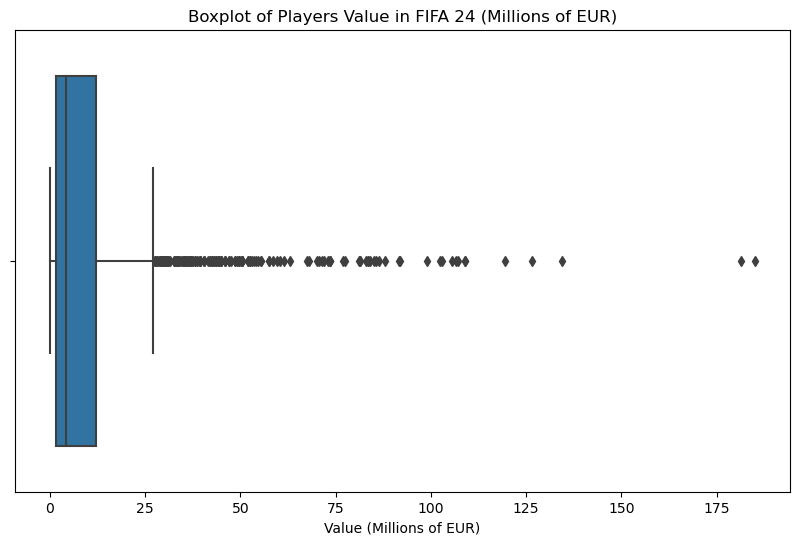

In [110]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it has been loaded

# Convert 'value_eur_24' to millions of euros
data['value_eur_24_millions'] = data['value_eur_24'] / 1e6

plt.figure(figsize=(10, 6))
sns.boxplot(x=data['value_eur_24_millions'])
plt.title('Boxplot of Players Value in FIFA 24 (Millions of EUR)')
plt.xlabel('Value (Millions of EUR)')
plt.show()

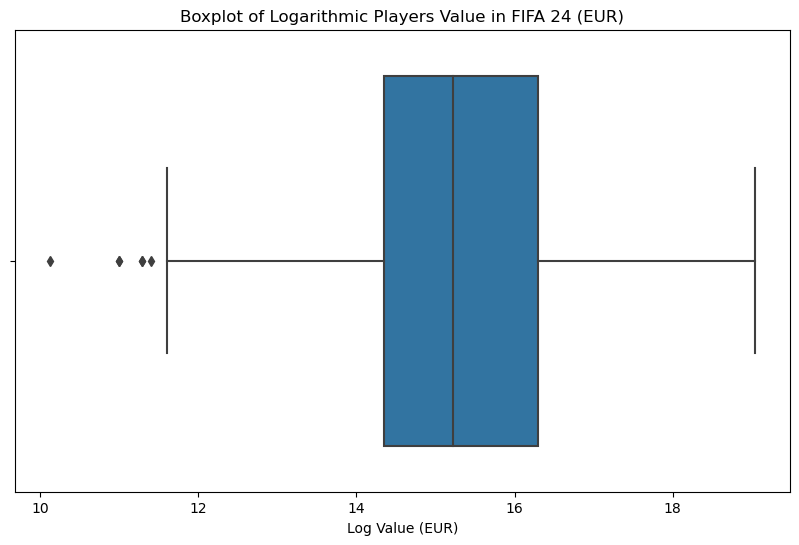

In [111]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it has been loaded

# Create a new column for the logarithmic transformation of 'value_eur_24'
data['log_value_eur_24'] = np.log(data['value_eur_24'] + 1)  # Adding 1 to avoid log(0)

# Create a boxplot for the new logarithmic variable
plt.figure(figsize=(10, 6))
sns.boxplot(x=data['log_value_eur_24'])
plt.title('Boxplot of Logarithmic Players Value in FIFA 24 (EUR)')
plt.xlabel('Log Value (EUR)')
plt.show()

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/983268384.py:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data['value_eur_24_million'], shade=True)


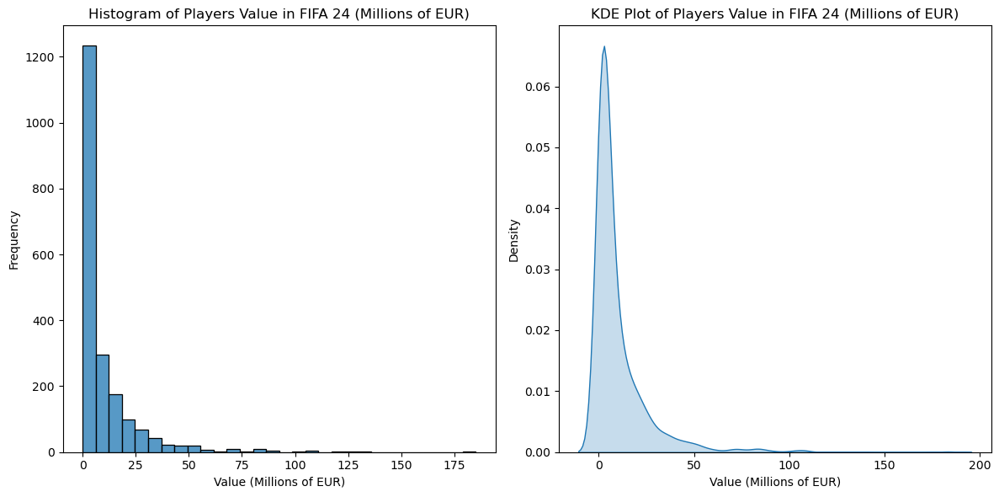

In [112]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it has been loaded

# Convert the values to millions of euros
data['value_eur_24_million'] = data['value_eur_24'] / 1_000_000

# Create the histogram and KDE plot
plt.figure(figsize=(12, 6))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(data['value_eur_24_million'], bins=30, kde=False)
plt.title('Histogram of Players Value in FIFA 24 (Millions of EUR)')
plt.xlabel('Value (Millions of EUR)')
plt.ylabel('Frequency')

# KDE Plot
plt.subplot(1, 2, 2)
sns.kdeplot(data['value_eur_24_million'], shade=True)
plt.title('KDE Plot of Players Value in FIFA 24 (Millions of EUR)')
plt.xlabel('Value (Millions of EUR)')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/1349393079.py:23: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data['log_value_eur_24'], shade=True)


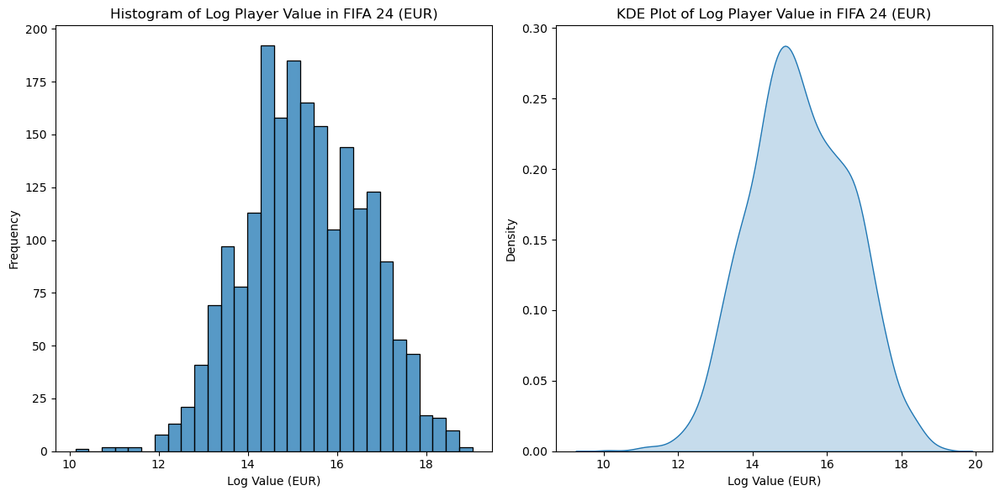

In [113]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'data' is your DataFrame and it has been loaded

# Create a new column for the logarithmic transformation of 'value_eur_24'
data['log_value_eur_24'] = np.log(data['value_eur_24'] + 1)

# Create the histogram and KDE plot
plt.figure(figsize=(12, 6))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(data['log_value_eur_24'], bins=30, kde=False)
plt.title('Histogram of Log Player Value in FIFA 24 (EUR)')
plt.xlabel('Log Value (EUR)')
plt.ylabel('Frequency')

# KDE Plot
plt.subplot(1, 2, 2)
sns.kdeplot(data['log_value_eur_24'], shade=True)
plt.title('KDE Plot of Log Player Value in FIFA 24 (EUR)')
plt.xlabel('Log Value (EUR)')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

In [114]:
fifa_23_features = ['release_clause_eur_23','overall_23', 'potential_23', 'wage_eur_23', 'age_23', 
                       'height_cm_23', 'weight_kg_23', 'club_team_id_23', 
                       'league_id_23', 'league_level_23', 'nationality_id_23', 
                       'weak_foot_23', 'skill_moves_23', 'international_reputation_23', 
                       'pace_23', 'shooting_23', 'passing_23', 'dribbling_23', 
                       'defending_23', 'physic_23', 'attacking_crossing_23', 
                       'attacking_finishing_23', 'attacking_heading_accuracy_23', 
                       'attacking_short_passing_23', 'attacking_volleys_23', 
                       'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23', 
                       'skill_long_passing_23', 'skill_ball_control_23', 
                       'movement_acceleration_23', 'movement_sprint_speed_23', 
                       'movement_agility_23', 'movement_reactions_23', 
                       'movement_balance_23', 'power_shot_power_23', 'power_jumping_23', 
                       'power_stamina_23', 'power_strength_23', 'power_long_shots_23', 
                       'mentality_aggression_23', 'mentality_interceptions_23', 
                       'mentality_positioning_23', 'mentality_vision_23', 
                       'mentality_penalties_23', 'defending_marking_awareness_23', 
                       'defending_standing_tackle_23', 'defending_sliding_tackle_23']

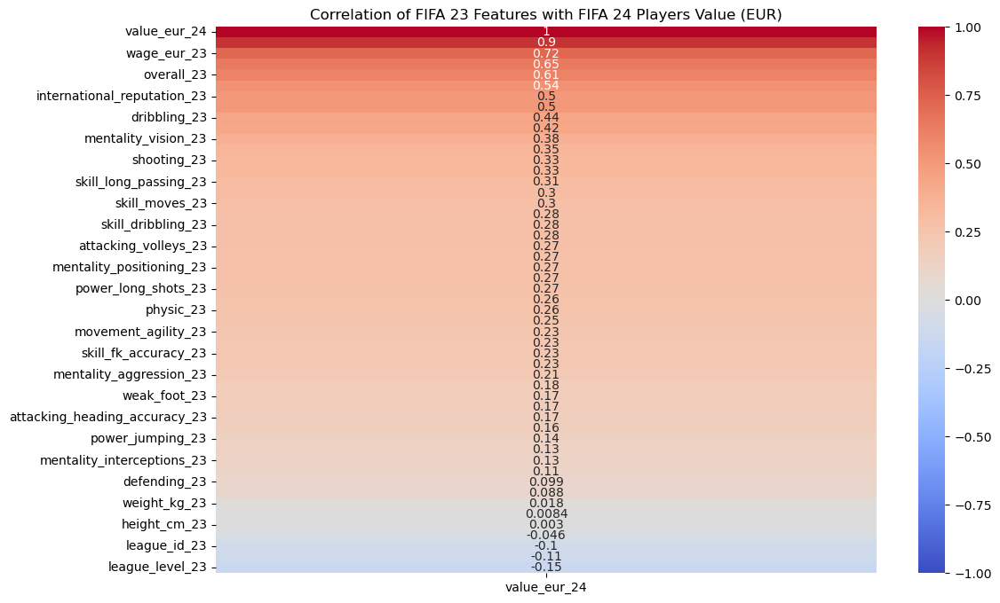

In [119]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it has been loaded

# Define the features and the target variable
fifa_23_features = ['weak_foot_23','international_reputation_23','release_clause_eur_23', 'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 
                    'height_cm_23', 'weight_kg_23', 'club_team_id_23', 
                    'league_id_23', 'league_level_23', 'nationality_id_23', 
                    'weak_foot_23', 'skill_moves_23', 'international_reputation_23', 
                    'pace_23', 'shooting_23', 'passing_23', 'dribbling_23', 
                    'defending_23', 'physic_23', 'attacking_crossing_23', 
                    'attacking_finishing_23', 'attacking_heading_accuracy_23', 
                    'attacking_short_passing_23', 'attacking_volleys_23', 
                    'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23', 
                    'skill_long_passing_23', 'skill_ball_control_23', 
                    'movement_acceleration_23', 'movement_sprint_speed_23', 
                    'movement_agility_23', 'movement_reactions_23', 
                    'movement_balance_23', 'power_shot_power_23', 'power_jumping_23', 
                    'power_stamina_23', 'power_strength_23', 'power_long_shots_23', 
                    'mentality_aggression_23', 'mentality_interceptions_23', 
                    'mentality_positioning_23', 'mentality_vision_23', 
                    'mentality_penalties_23', 'defending_marking_awareness_23', 
                    'defending_standing_tackle_23', 'defending_sliding_tackle_23']

# Add the target variable to the list of features for correlation computation
features_with_target = fifa_23_features + ['value_eur_24']

# Select only the numerical features and the target variable
numerical_data = data[features_with_target]

# Compute the correlation matrix
correlation_matrix = numerical_data.corr()

# Extract the correlation with the target variable
correlation_with_target = correlation_matrix['value_eur_24'].sort_values(ascending=False)

# Plot the correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_with_target.to_frame(), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation of FIFA 23 Features with FIFA 24 Players Value (EUR)')
plt.show()

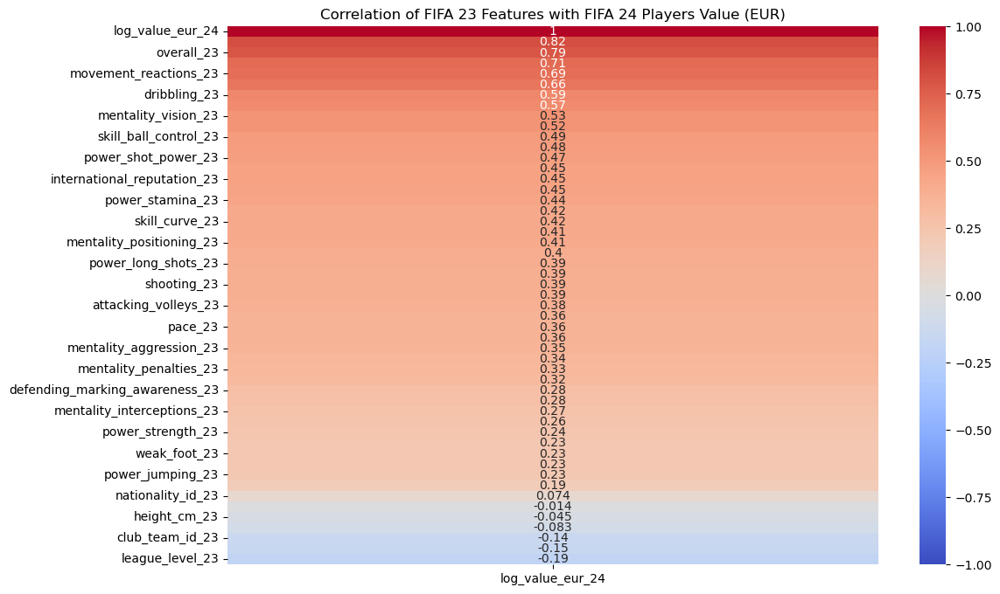

In [121]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it has been loaded

# Define the features and the target variable
fifa_23_features = ['weak_foot_23','international_reputation_23','release_clause_eur_23', 'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 
                    'height_cm_23', 'weight_kg_23', 'club_team_id_23', 
                    'league_id_23', 'league_level_23', 'nationality_id_23', 
                    'weak_foot_23', 'skill_moves_23', 'international_reputation_23', 
                    'pace_23', 'shooting_23', 'passing_23', 'dribbling_23', 
                    'defending_23', 'physic_23', 'attacking_crossing_23', 
                    'attacking_finishing_23', 'attacking_heading_accuracy_23', 
                    'attacking_short_passing_23', 'attacking_volleys_23', 
                    'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23', 
                    'skill_long_passing_23', 'skill_ball_control_23', 
                    'movement_acceleration_23', 'movement_sprint_speed_23', 
                    'movement_agility_23', 'movement_reactions_23', 
                    'movement_balance_23', 'power_shot_power_23', 'power_jumping_23', 
                    'power_stamina_23', 'power_strength_23', 'power_long_shots_23', 
                    'mentality_aggression_23', 'mentality_interceptions_23', 
                    'mentality_positioning_23', 'mentality_vision_23', 
                    'mentality_penalties_23', 'defending_marking_awareness_23', 
                    'defending_standing_tackle_23', 'defending_sliding_tackle_23']

# Add the target variable to the list of features for correlation computation
features_with_target = fifa_23_features + ['log_value_eur_24']

# Select only the numerical features and the target variable
numerical_data = data[features_with_target]

# Compute the correlation matrix
correlation_matrix = numerical_data.corr()

# Extract the correlation with the target variable
correlation_with_target = correlation_matrix['log_value_eur_24'].sort_values(ascending=False)

# Plot the correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_with_target.to_frame(), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation of FIFA 23 Features with FIFA 24 Players Value (EUR)')
plt.show()

In [124]:
choosen_features_23 = ['weak_foot_23', 'international_reputation_23', 'release_clause_eur_23',
       'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
       'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
       'nationality_id_23', 'weak_foot_23', 'skill_moves_23',
       'international_reputation_23', 'pace_23', 'shooting_23', 'passing_23',
       'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
       'attacking_finishing_23', 'attacking_heading_accuracy_23',
       'attacking_short_passing_23', 'attacking_volleys_23',
       'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
       'skill_long_passing_23', 'skill_ball_control_23',
       'movement_acceleration_23', 'movement_sprint_speed_23',
       'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
       'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
       'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
       'mentality_interceptions_23', 'mentality_positioning_23',
       'mentality_vision_23', 'mentality_penalties_23',
       'defending_marking_awareness_23', 'defending_standing_tackle_23',
       'defending_sliding_tackle_23', 'value_eur_24']

## Correlation Matrix :

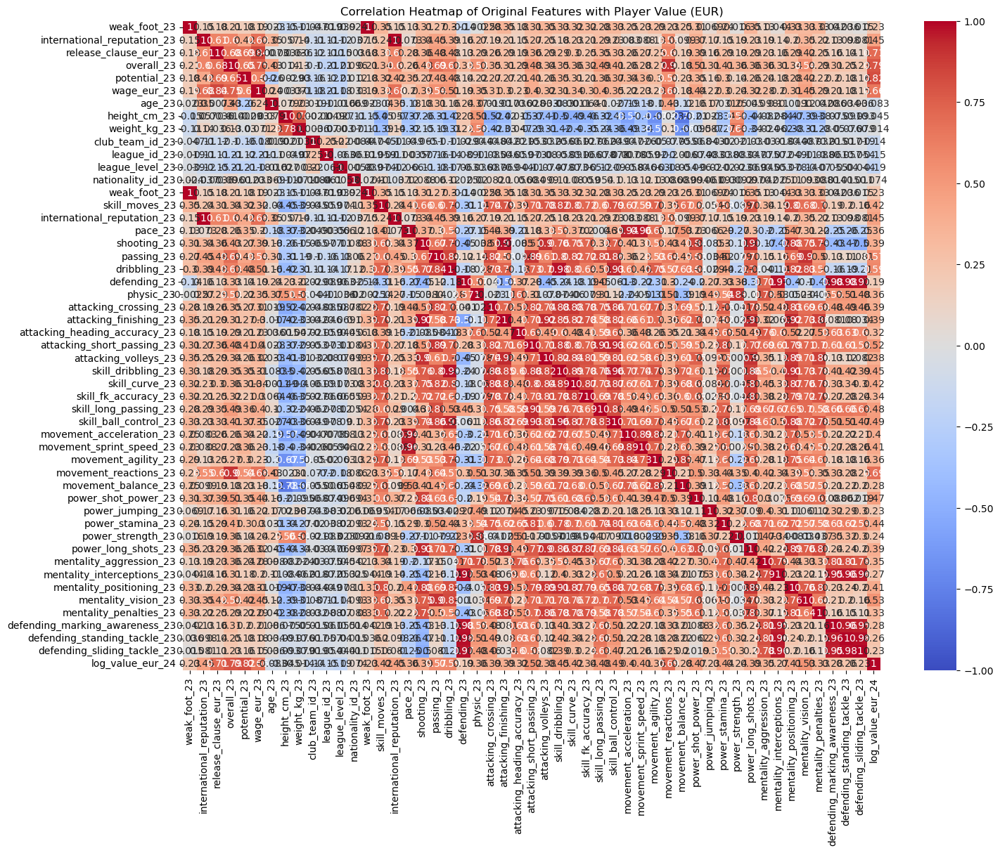

In [125]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it has been loaded

# Define the original numerical features and the target variable
choosen_features_23 = ['weak_foot_23', 'international_reputation_23', 'release_clause_eur_23',
       'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
       'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
       'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
       'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
       'attacking_finishing_23', 'attacking_heading_accuracy_23',
       'attacking_short_passing_23', 'attacking_volleys_23',
       'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
       'skill_long_passing_23', 'skill_ball_control_23',
       'movement_acceleration_23', 'movement_sprint_speed_23',
       'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
       'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
       'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
       'mentality_interceptions_23', 'mentality_positioning_23',
       'mentality_vision_23', 'mentality_penalties_23',
       'defending_marking_awareness_23', 'defending_standing_tackle_23',
       'defending_sliding_tackle_23']

# Add the target variable to the list of features for correlation computation
features_with_target = fifa_23_features + ['log_value_eur_24']

# Select only the numerical features and the target variable
numerical_data = data[features_with_target]

# Compute the correlation matrix
correlation_matrix = numerical_data.corr()

# Plot the correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Original Features with Player Value (EUR)')
plt.show()

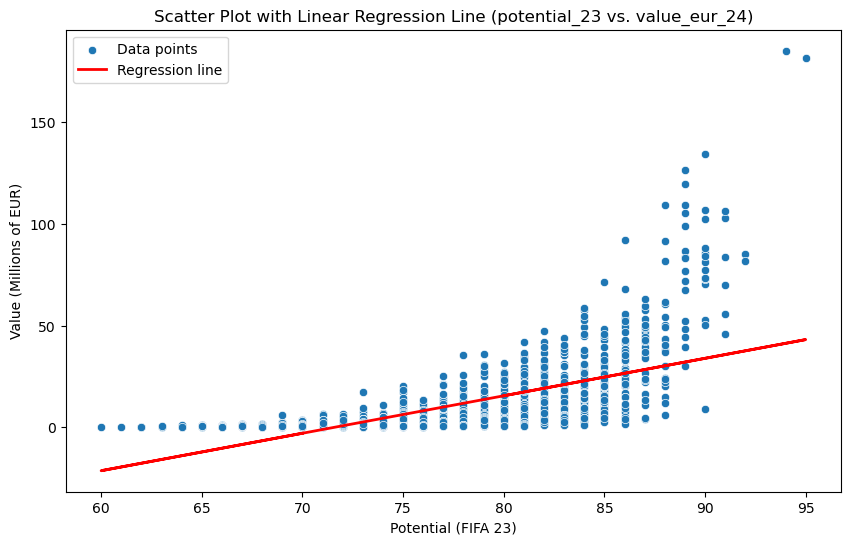

Intercept: -131.74943518642945
Coefficient: 1.840459747732528


In [126]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np

# Assuming 'data' is your DataFrame and it has been loaded

# Define the features
X = data[['potential_23']]  # Predictor
y = data['value_eur_24'] / 1e6  # Target variable converted to millions of euros

# Fit a simple linear regression model
model = LinearRegression()
model.fit(X, y)

# Predict values for the regression line
predicted_values = model.predict(X)

# Plot the scatter plot and regression line
plt.figure(figsize=(10, 6))
sns.scatterplot(x='potential_23', y=y, data=data, label='Data points')
plt.plot(data['potential_23'], predicted_values, color='red', linewidth=2, label='Regression line')
plt.title('Scatter Plot with Linear Regression Line (potential_23 vs. value_eur_24)')
plt.xlabel('Potential (FIFA 23)')
plt.ylabel('Value (Millions of EUR)')
plt.legend()
plt.show()

# Print the regression coefficients
print(f"Intercept: {model.intercept_}")
print(f"Coefficient: {model.coef_[0]}")

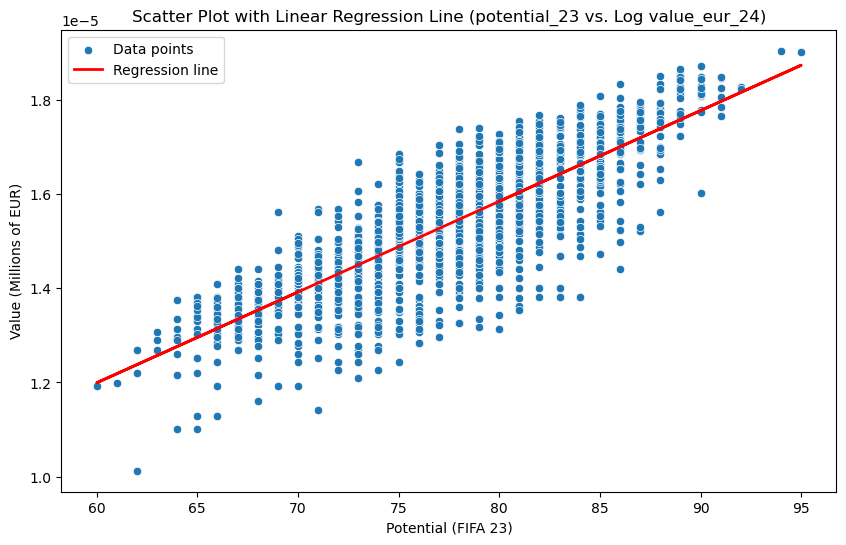

Intercept: 4.4186611627735445e-07
Coefficient: 1.9249377585323562e-07


In [127]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np

# Assuming 'data' is your DataFrame and it has been loaded

# Define the features
X = data[['potential_23']]  # Predictor
y = data['log_value_eur_24'] / 1e6  # Target variable converted to millions of euros

# Fit a simple linear regression model
model = LinearRegression()
model.fit(X, y)

# Predict values for the regression line
predicted_values = model.predict(X)

# Plot the scatter plot and regression line
plt.figure(figsize=(10, 6))
sns.scatterplot(x='potential_23', y=y, data=data, label='Data points')
plt.plot(data['potential_23'], predicted_values, color='red', linewidth=2, label='Regression line')
plt.title('Scatter Plot with Linear Regression Line (potential_23 vs. Log value_eur_24)')
plt.xlabel('Potential (FIFA 23)')
plt.ylabel('Value (Millions of EUR)')
plt.legend()
plt.show()

# Print the regression coefficients
print(f"Intercept: {model.intercept_}")
print(f"Coefficient: {model.coef_[0]}")

# General OLS Model :

                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.853
Model:                            OLS   Adj. R-squared:                  0.849
Method:                 Least Squares   F-statistic:                     238.2
Date:                Thu, 06 Jun 2024   Prob (F-statistic):               0.00
Time:                        15:00:11   Log-Likelihood:                -1529.3
No. Observations:                2022   AIC:                             3157.
Df Residuals:                    1973   BIC:                             3432.
Df Model:                          48                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

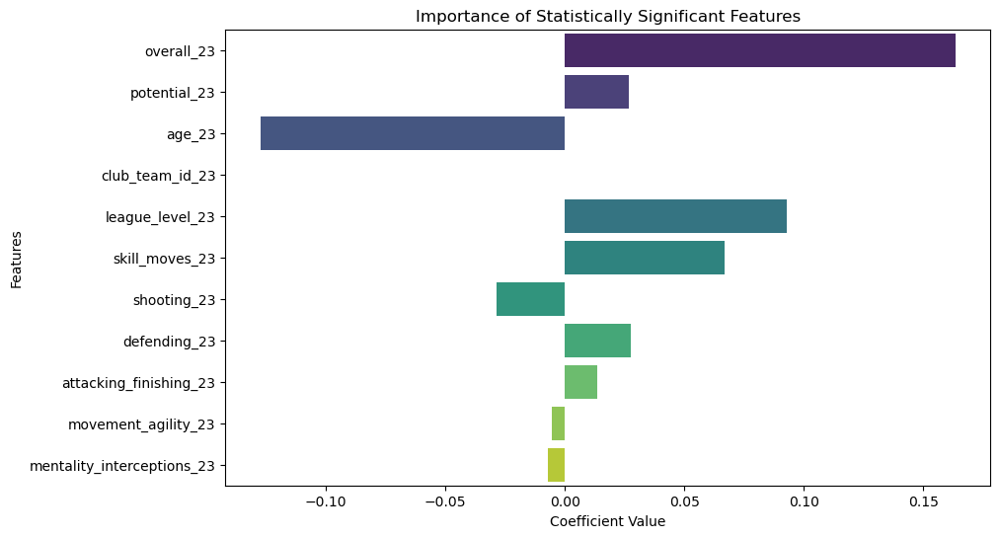

In [128]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame and it has been loaded

# Define the chosen features for the model
chosen_features_23 = ['weak_foot_23', 'international_reputation_23', 'release_clause_eur_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
data['log_value_eur_24'] = np.log(data['value_eur_24'] + 1)

# Select the features and target variable
X = data[chosen_features_23]
y = data['log_value_eur_24']

# Fill NaN values with 0
X = X.fillna(0)
y = y.fillna(0)

# Add a constant term to the predictors
X = sm.add_constant(X)

# Fit the OLS model
model = sm.OLS(y, X).fit()
print(model.summary())

# Get the statistically significant features (p-value < 0.05)
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'const' in significant_features:
    significant_features.remove('const')

# Get the coefficients of the significant features
coefs = model.params[significant_features]

# Plot the importance of the statistically significant features
plt.figure(figsize=(10, 6))
sns.barplot(x=coefs.values, y=coefs.index, palette='viridis')
plt.title('Importance of Statistically Significant Features')
plt.xlabel('Coefficient Value')
plt.ylabel('Features')
plt.show()

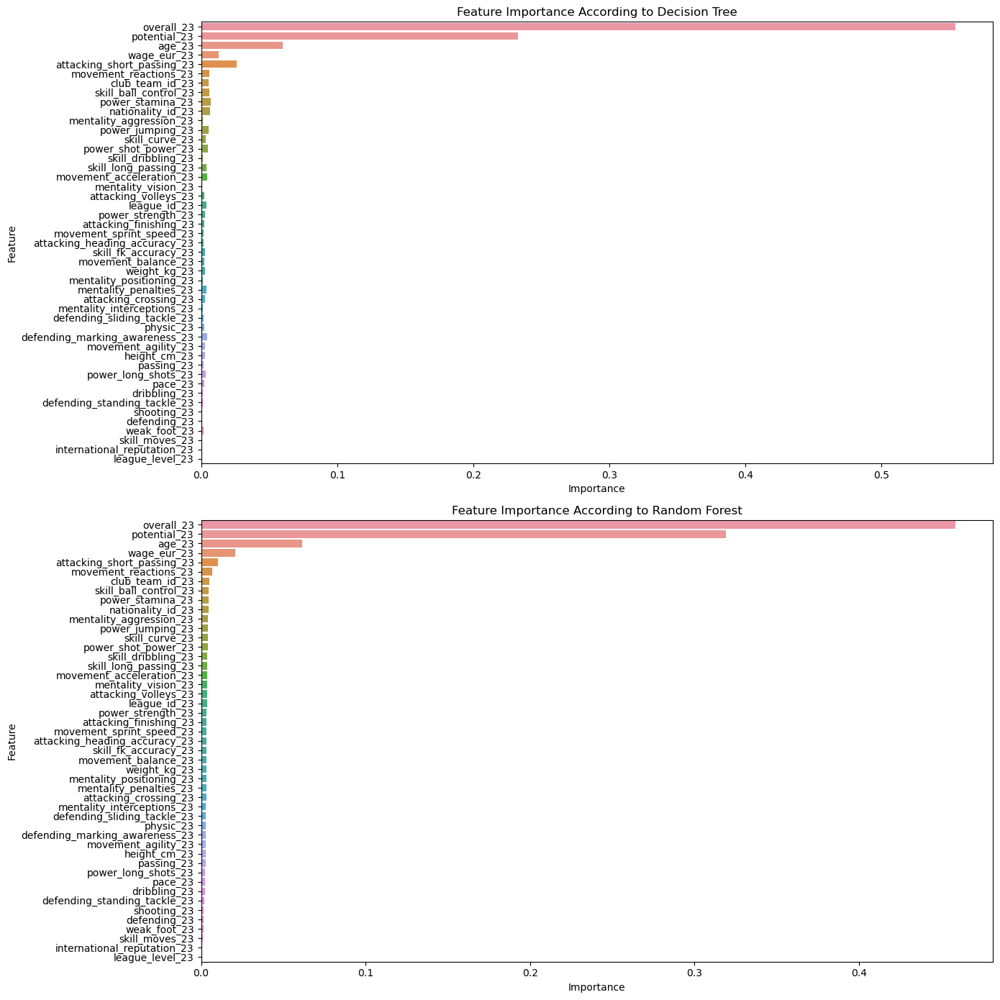

In [129]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming 'data' is your DataFrame and it has been loaded

# Define the chosen features for the model
chosen_features_23 = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
data['log_value_eur_24'] = np.log(data['value_eur_24'] + 1)

# Fill NaN values with 0
data = data.fillna(0)

# Select features and target variable
X = data[chosen_features_23]
y = data['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Train a Random Forest Regressor
forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X_train, y_train)

# Get feature importances
tree_importances = tree.feature_importances_
forest_importances = forest.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Decision Tree Importance': tree_importances,
    'Random Forest Importance': forest_importances
})

# Sort DataFrame by Random Forest Importance
importance_df = importance_df.sort_values(by='Random Forest Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(14, 14))
plt.subplot(2, 1, 1)
sns.barplot(x='Decision Tree Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Decision Tree')
plt.xlabel('Importance')

plt.subplot(2, 1, 2)
sns.barplot(x='Random Forest Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Random Forest')
plt.xlabel('Importance')

plt.tight_layout()
plt.show()

# GK Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/3889304891.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goalkeepers['log_value_eur_24'] = np.log(goalkeepers['value_eur_24'] + 1)


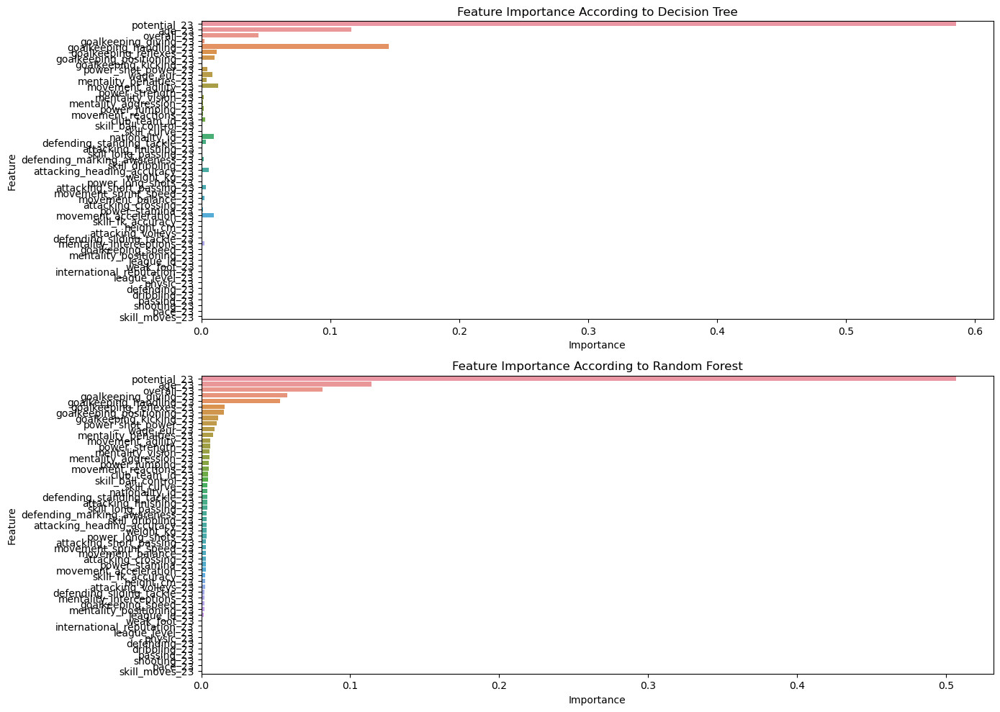

In [131]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming 'data' is your DataFrame and it has been loaded

# Filter data to select only goalkeepers
goalkeepers = data[data['player_positions_23'].str.contains('GK')]

# Define the chosen features for the model
chosen_features_23 = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23','goalkeeping_diving_23','goalkeeping_handling_23','goalkeeping_kicking_23','goalkeeping_positioning_23','goalkeeping_reflexes_23','goalkeeping_speed_23']



# Create a new column for the logarithmic transformation of 'value_eur_24'
goalkeepers['log_value_eur_24'] = np.log(goalkeepers['value_eur_24'] + 1)

# Fill NaN values with 0
goalkeepers = goalkeepers.fillna(0)

# Select features and target variable
X = goalkeepers[chosen_features_23]
y = goalkeepers['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Train a Random Forest Regressor
forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X_train, y_train)

# Get feature importances
tree_importances = tree.feature_importances_
forest_importances = forest.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Decision Tree Importance': tree_importances,
    'Random Forest Importance': forest_importances
})

# Sort DataFrame by Random Forest Importance
importance_df = importance_df.sort_values(by='Random Forest Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(14, 10))
plt.subplot(2, 1, 1)
sns.barplot(x='Decision Tree Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Decision Tree')
plt.xlabel('Importance')

plt.subplot(2, 1, 2)
sns.barplot(x='Random Forest Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Random Forest')
plt.xlabel('Importance')

plt.tight_layout()
plt.show()

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/598840221.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goalkeepers['log_value_eur_24'] = np.log(goalkeepers['value_eur_24'] + 1)


                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.890
Model:                            OLS   Adj. R-squared:                  0.862
Method:                 Least Squares   F-statistic:                     32.07
Date:                Thu, 06 Jun 2024   Prob (F-statistic):           3.39e-66
Time:                        15:07:09   Log-Likelihood:                -181.12
No. Observations:                 230   AIC:                             456.2
Df Residuals:                     183   BIC:                             617.8
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

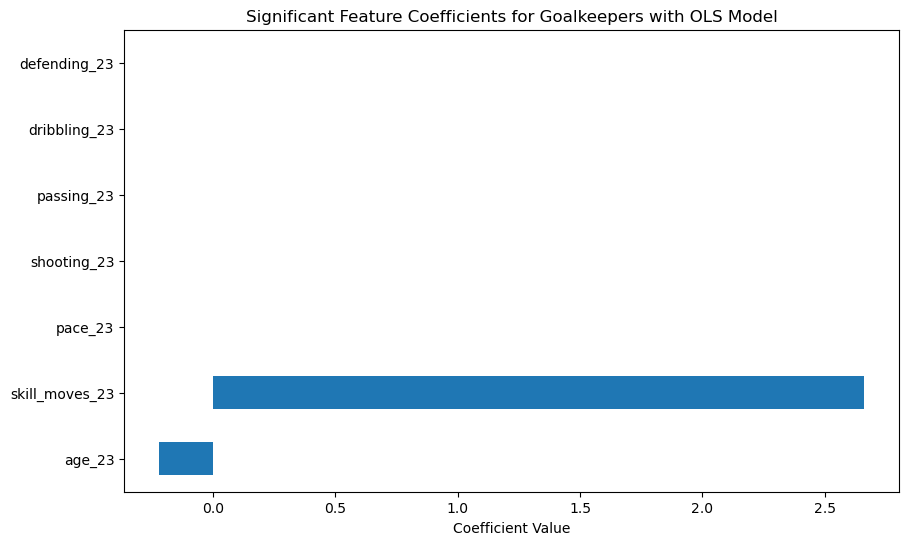

In [132]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

# Assuming 'data' is your DataFrame and it has been loaded

# Filter data to select only goalkeepers
goalkeepers = data[data['player_positions_23'].str.contains('GK')]

# Define the chosen features for the model
chosen_features_23_gk = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23','goalkeeping_diving_23','goalkeeping_handling_23','goalkeeping_kicking_23','goalkeeping_positioning_23','goalkeeping_reflexes_23','goalkeeping_speed_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
goalkeepers['log_value_eur_24'] = np.log(goalkeepers['value_eur_24'] + 1)

# Fill NaN values with 0
goalkeepers = goalkeepers.fillna(0)

# Create the formula for the OLS model
formula = 'log_value_eur_24 ~ ' + ' + '.join(chosen_features_23_gk)

# Fit the OLS model using the formula
model = ols(formula, data=goalkeepers).fit()
print(model.summary())

# Perform ANOVA
anova_results = anova_lm(model)
print("\nANOVA table:\n", anova_results)

# Plot the importance of significant features
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'Intercept' in significant_features:
    significant_features.remove('Intercept')

coefs = model.params[significant_features]
coefs.plot(kind='barh', figsize=(10, 6))
plt.xlabel('Coefficient Value')
plt.title('Significant Feature Coefficients for Goalkeepers with OLS Model')
plt.show()

## Ridge Regression Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/3528343488.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  goalkeepers['log_value_eur_24'] = np.log(goalkeepers['value_eur_24'] + 1)


Ridge Regression Coefficients:
[-2.90397262e-02 -1.72316220e-02  9.04611571e-02 -2.19799751e-02
  1.99970238e-06 -2.19183930e-01  3.87354192e-03 -2.44899878e-03
  8.76409114e-07 -2.83730932e-04  1.94301072e-01  8.34692118e-04
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.55818947e-02
  1.11325274e-02  6.71645975e-03  8.50336659e-03  1.23658792e-02
  3.63115308e-03  2.12634647e-02 -5.59541095e-03 -5.40091989e-03
  6.12738798e-03  5.25891918e-02  2.99262232e-02 -9.89307747e-03
  9.06834833e-03 -6.20767850e-03 -2.54081390e-01  1.76184598e-03
 -7.69701178e-03 -2.81079854e-03 -1.31987711e-02  2.97170904e-03
 -9.58094460e-03  1.03380758e-02 -9.27850916e-04 -9.77901869e-03
 -1.50397906e-03 -1.92143793e-02  1.09183255e-02  3.60181012e-02
  2.70744541e-02  1.98644118e-01  2.31424926e-02  3.01337850e-02
 -7.03705299e-02]
Most under-valued Goalkeepers:       short_name_23  difference_million
474      M. Maignan           60.55

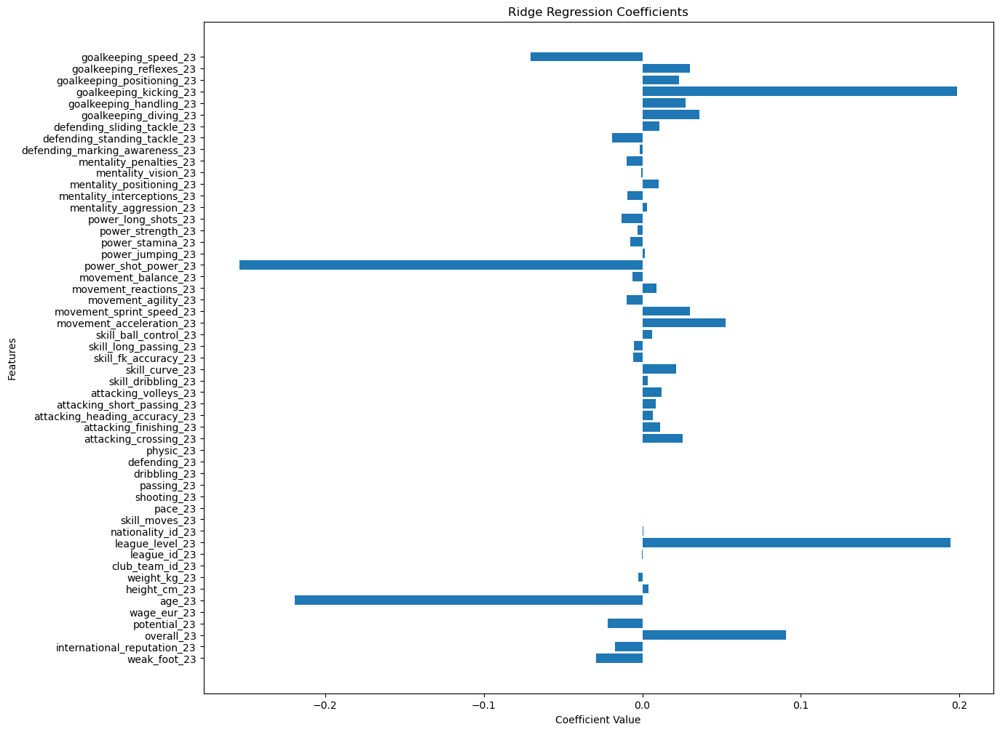

In [133]:
import pandas as pd
import numpy as np
from sklearn.linear_model import Ridge
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assuming 'data' is your DataFrame and it has been loaded

# Define the chosen features for the model
chosen_features_23_gk = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23','goalkeeping_diving_23','goalkeeping_handling_23','goalkeeping_kicking_23','goalkeeping_positioning_23','goalkeeping_reflexes_23','goalkeeping_speed_23']

# Filter goalkeepers from the dataset
goalkeepers = data[data['player_positions_23'].str.contains('GK')]

# Create a new column for the logarithmic transformation of 'value_eur_24'
goalkeepers['log_value_eur_24'] = np.log(goalkeepers['value_eur_24'] + 1)

# Fill NaN values with 0
goalkeepers = goalkeepers.fillna(0)

# Prepare data for Ridge model
X = goalkeepers[chosen_features_23_gk]
y = goalkeepers['log_value_eur_24']

# Fit the Ridge model
ridge = Ridge(alpha=0.1)  # You can adjust the alpha value as needed
ridge.fit(X, y)

# Print the coefficients
print("Ridge Regression Coefficients:")
print(ridge.coef_)

# Predict values on the entire dataset
goalkeepers['predicted_log_value'] = ridge.predict(X)
goalkeepers['predicted_value'] = np.exp(goalkeepers['predicted_log_value']) - 1
goalkeepers['predicted_value_million'] = goalkeepers['predicted_value'] / 1_000_000
goalkeepers['actual_value_million'] = goalkeepers['value_eur_24'] / 1_000_000
goalkeepers['difference_million'] = goalkeepers['predicted_value_million'] - goalkeepers['actual_value_million']

# Filter under-valued and over-valued goalkeepers
under_valued_gk = goalkeepers[goalkeepers['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_gk = goalkeepers[goalkeepers['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Goalkeepers:", under_valued_gk[['short_name_23', 'difference_million']])
print("Most over-valued Goalkeepers:", over_valued_gk[['short_name_23', 'difference_million']])

# Calculate performance metrics
r2 = r2_score(goalkeepers['value_eur_24'], goalkeepers['predicted_value'])
rmse = mean_squared_error(goalkeepers['value_eur_24'], goalkeepers['predicted_value'], squared=False)
mae = mean_absolute_error(goalkeepers['value_eur_24'], goalkeepers['predicted_value'])

print(f"R-squared: {r2}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")

# Plot the importance of significant features
plt.figure(figsize=(14, 12))
plt.barh(chosen_features_23_gk, ridge.coef_)
plt.xlabel('Coefficient Value')
plt.ylabel('Features')
plt.title('Ridge Regression Coefficients')
plt.show()

# CB Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/3049730003.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  center_backs['log_value_eur_24'] = np.log(center_backs['value_eur_24'] + 1)


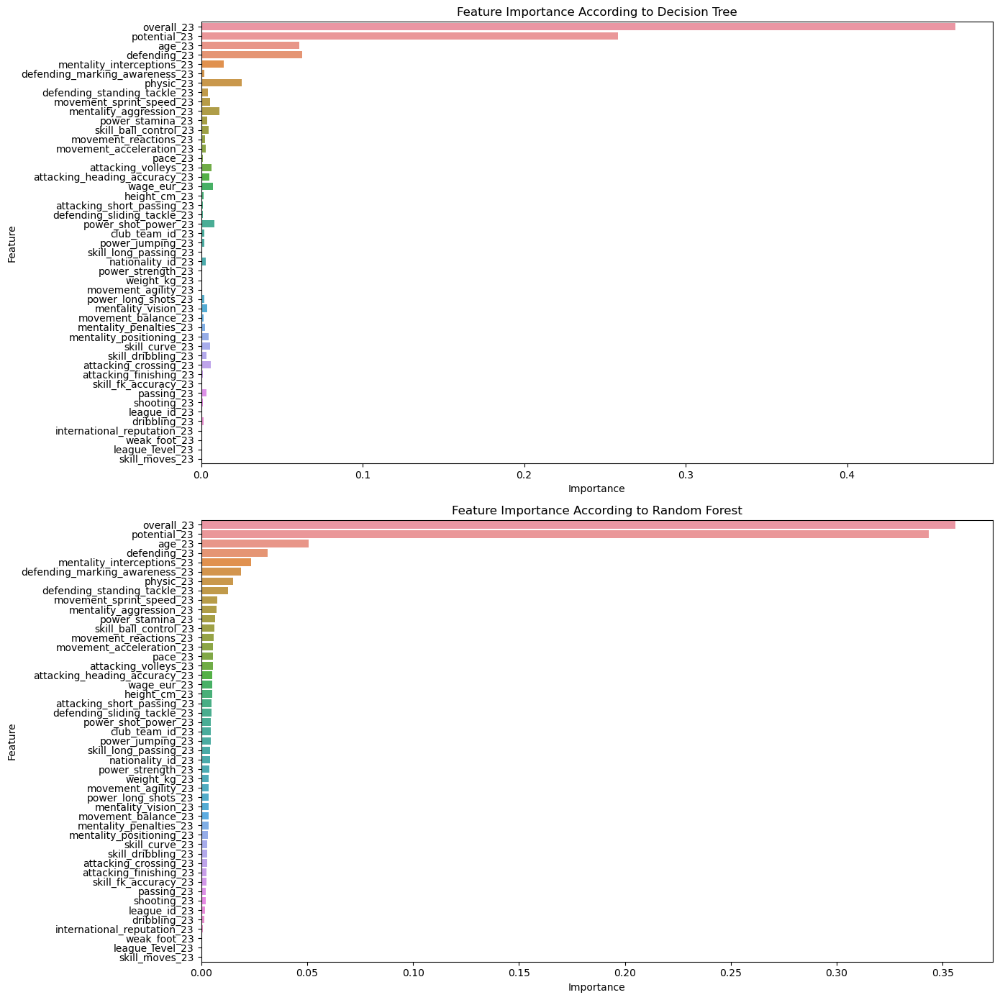

In [134]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming 'data' is your DataFrame and it has been loaded

# Filter data to select only goalkeepers
center_backs = data[data['player_positions_23'].str.contains('CB')]

# Define the chosen features for the model
chosen_features_23 = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
center_backs['log_value_eur_24'] = np.log(center_backs['value_eur_24'] + 1)

# Fill NaN values with 0
center_backs = center_backs.fillna(0)

# Select features and target variable
X = center_backs[chosen_features_23]
y = center_backs['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Train a Random Forest Regressor
forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X_train, y_train)

# Get feature importances
tree_importances = tree.feature_importances_
forest_importances = forest.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Decision Tree Importance': tree_importances,
    'Random Forest Importance': forest_importances
})

# Sort DataFrame by Random Forest Importance
importance_df = importance_df.sort_values(by='Random Forest Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(14, 14))
plt.subplot(2, 1, 1)
sns.barplot(x='Decision Tree Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Decision Tree')
plt.xlabel('Importance')

plt.subplot(2, 1, 2)
sns.barplot(x='Random Forest Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Random Forest')
plt.xlabel('Importance')

plt.tight_layout()
plt.show()

                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.865
Model:                            OLS   Adj. R-squared:                  0.849
Method:                 Least Squares   F-statistic:                     54.55
Date:                Thu, 06 Jun 2024   Prob (F-statistic):          1.68e-145
Time:                        15:12:24   Log-Likelihood:                -293.26
No. Observations:                 448   AIC:                             682.5
Df Residuals:                     400   BIC:                             879.5
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/1351395053.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  center_backs['log_value_eur_24'] = np.log(center_backs['value_eur_24'] + 1)


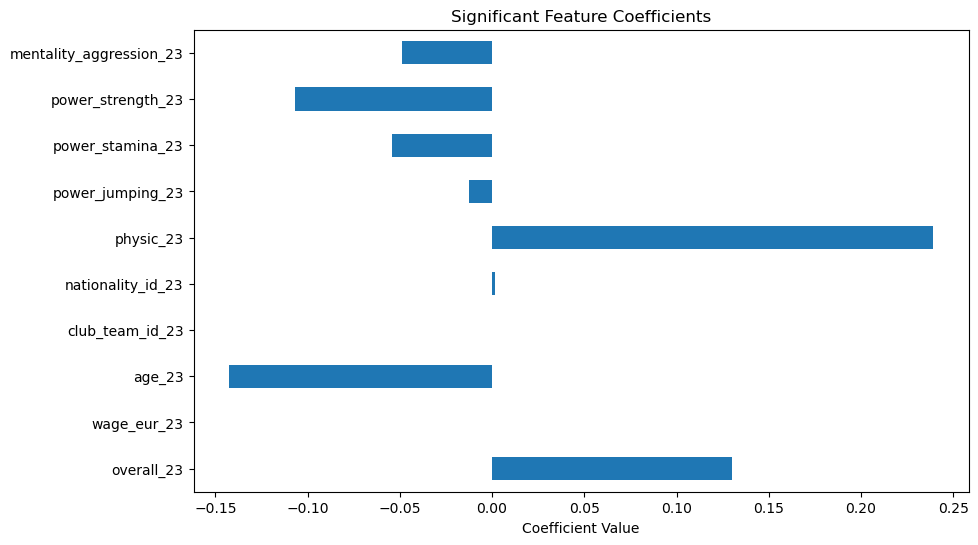

Ridge - R-squared: 0.8860272921980672, MSE: 0.22353481855444868, MAE: 0.37509668307372834
Lasso - R-squared: 0.8809942447904223, MSE: 0.23340614091522838, MAE: 0.3842736831390029
Random Forest - R-squared: 0.861210960259983, MSE: 0.272207122336219, MAE: 0.4390884452650996
ANN - R-squared: -87.81397347425762, MSE: 174.19096052512248, MAE: 6.165468158179926
           Model  R-squared         MSE       MAE
0          Ridge   0.886027    0.223535  0.375097
1          Lasso   0.880994    0.233406  0.384274
2  Random Forest   0.861211    0.272207  0.439088
3            ANN -87.813973  174.190961  6.165468


In [136]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from sklearn.linear_model import Ridge, Lasso
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# Assuming 'data' is your DataFrame and it has been loaded
center_backs = data[data['player_positions_23'].str.contains('CB')]

# Define the chosen features for the model
chosen_features_23_cb = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
center_backs['log_value_eur_24'] = np.log(center_backs['value_eur_24'] + 1)

# Fill NaN values with 0
center_backs = center_backs.fillna(0)

# Create the formula for the OLS model
formula = 'log_value_eur_24 ~ ' + ' + '.join(chosen_features_23_cb)

# Fit the OLS model using the formula
model = ols(formula, data=center_backs).fit()
print(model.summary())

# Perform ANOVA
anova_results = anova_lm(model)
print("\nANOVA table:\n", anova_results)

# Plot the importance of significant features
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'Intercept' in significant_features:
    significant_features.remove('Intercept')

coefs = model.params[significant_features]
coefs.plot(kind='barh', figsize=(10, 6))
plt.xlabel('Coefficient Value')
plt.title('Significant Feature Coefficients')
plt.show()

# Prepare data for other models
X = center_backs[chosen_features_23_cb]
y = center_backs['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model 1: Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
ridge_predictions = ridge.predict(X_test)

# Model 2: Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
lasso_predictions = lasso.predict(X_test)

# Model 3: Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_predictions = rf.predict(X_test)

# Model 4: ANN (MLP Regressor)
mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)
mlp_predictions = mlp.predict(X_test)

# Evaluate the models
def evaluate_model(y_test, predictions, model_name):
    r2 = r2_score(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    print(f"{model_name} - R-squared: {r2}, MSE: {mse}, MAE: {mae}")

evaluate_model(y_test, ridge_predictions, "Ridge")
evaluate_model(y_test, lasso_predictions, "Lasso")
evaluate_model(y_test, rf_predictions, "Random Forest")
evaluate_model(y_test, mlp_predictions, "ANN")

# Compare the models
models = ['Ridge', 'Lasso', 'Random Forest', 'ANN']
r2_scores = [r2_score(y_test, ridge_predictions), r2_score(y_test, lasso_predictions), r2_score(y_test, rf_predictions), r2_score(y_test, mlp_predictions)]
mse_scores = [mean_squared_error(y_test, ridge_predictions), mean_squared_error(y_test, lasso_predictions), mean_squared_error(y_test, rf_predictions), mean_squared_error(y_test, mlp_predictions)]
mae_scores = [mean_absolute_error(y_test, ridge_predictions), mean_absolute_error(y_test, lasso_predictions), mean_absolute_error(y_test, rf_predictions), mean_absolute_error(y_test, mlp_predictions)]

comparison = pd.DataFrame({
    'Model': models,
    'R-squared': r2_scores,
    'MSE': mse_scores,
    'MAE': mae_scores
})

print(comparison)

## Ridge Regression Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2735292522.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  center_backs['log_value_eur_24'] = np.log(center_backs['value_eur_24'] + 1)


Ridge Regression Coefficients:
[ 5.91844709e-03  2.42009094e-02  1.29830486e-01  1.42066866e-02
  3.75924577e-06 -1.42669113e-01  8.67432541e-03 -7.88312035e-03
 -1.75491581e-06  2.16993129e-04  1.35786334e-01  1.75446255e-03
 -7.37981729e-02 -9.31268972e-02 -2.02528368e-02  2.70523257e-03
  1.65555099e-02  5.99437725e-02  2.38184551e-01  1.74516344e-03
  8.36845605e-03  3.10688113e-03  2.63720826e-03  7.89717157e-03
  4.97910400e-04 -8.04716911e-03  1.02717329e-03 -7.42694218e-03
 -3.90546491e-03  4.36844629e-02  5.25268886e-02 -5.24811994e-03
  8.23522242e-03 -1.75416555e-03  2.77624765e-03 -1.25513735e-02
 -5.37839614e-02 -1.06501509e-01  2.49704161e-03 -4.88901248e-02
 -1.59707372e-02  4.49319969e-03 -4.38029365e-04  1.45129745e-03
 -1.52213998e-02 -1.51747696e-02  4.62075535e-03]
Most under-valued Center Backs:              short_name_23  difference_million
1284            Rúben Dias           90.876132
253            V. van Dijk           32.343178
1021           M. Škriniar     

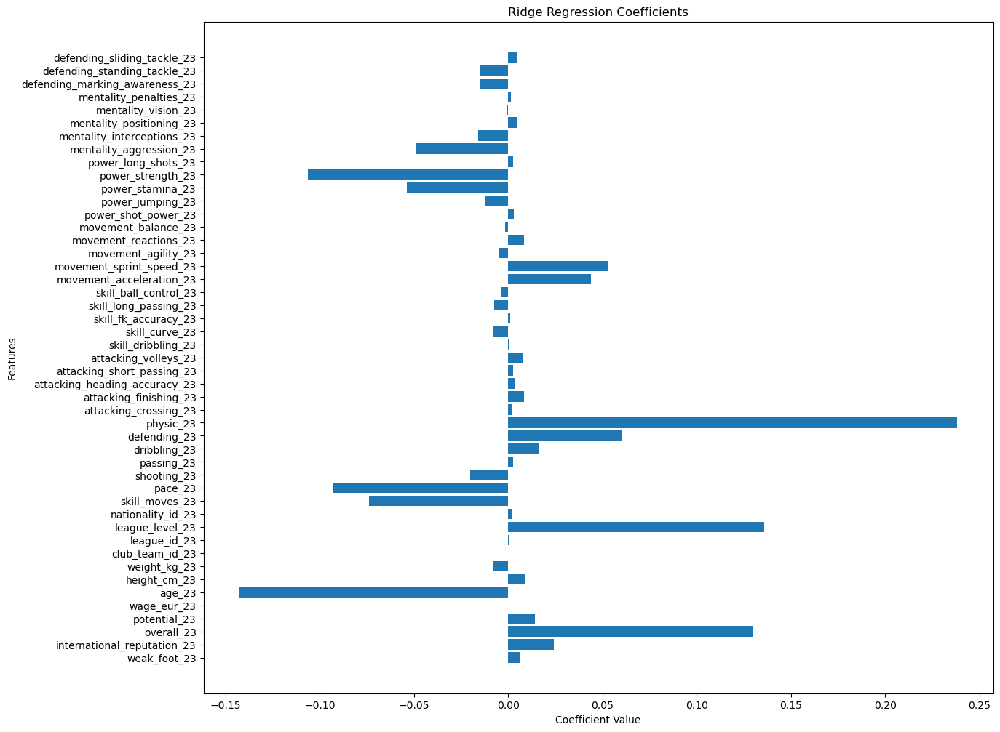

In [137]:
import pandas as pd
import numpy as np
from sklearn.linear_model import Ridge
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Assuming 'data' is your DataFrame and it has been loaded

# Define the chosen features for the model
chosen_features_23_cb = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Filter center backs from the dataset
center_backs = data[data['player_positions_23'].str.contains('CB')]

# Create a new column for the logarithmic transformation of 'value_eur_24'
center_backs['log_value_eur_24'] = np.log(center_backs['value_eur_24'] + 1)

# Fill NaN values with 0
center_backs = center_backs.fillna(0)

# Prepare data for Ridge Regression model
X = center_backs[chosen_features_23_cb]
y = center_backs['log_value_eur_24']

# Fit the Ridge Regression model
ridge = Ridge(alpha=0.1)  # You can adjust the alpha value as needed
ridge.fit(X, y)

# Print the coefficients
print("Ridge Regression Coefficients:")
print(ridge.coef_)

# Predict values on the entire dataset
center_backs['predicted_log_value'] = ridge.predict(X)
center_backs['predicted_value'] = np.exp(center_backs['predicted_log_value']) - 1
center_backs['predicted_value_million'] = center_backs['predicted_value'] / 1_000_000
center_backs['actual_value_million'] = center_backs['value_eur_24'] / 1_000_000
center_backs['difference_million'] = center_backs['predicted_value_million'] - center_backs['actual_value_million']

under_valued_cb = center_backs[center_backs['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_cb = center_backs[center_backs['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Center Backs:", under_valued_cb[['short_name_23', 'difference_million']])
print("Most over-valued Center Backs:", over_valued_cb[['short_name_23', 'difference_million']])

# Calculate performance metrics
r2 = r2_score(center_backs['value_eur_24'], center_backs['predicted_value'])
rmse = mean_squared_error(center_backs['value_eur_24'], center_backs['predicted_value'], squared=False)
mae = mean_absolute_error(center_backs['value_eur_24'], center_backs['predicted_value'])

print(f"R-squared: {r2}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")

# Plot the importance of significant features
plt.figure(figsize=(14, 12))
plt.barh(chosen_features_23_cb, ridge.coef_)
plt.xlabel('Coefficient Value')
plt.ylabel('Features')
plt.title('Ridge Regression Coefficients')
plt.show()

# LB / RB Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/3858675712.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lateral_defenders['log_value_eur_24'] = np.log(lateral_defenders['value_eur_24'] + 1)


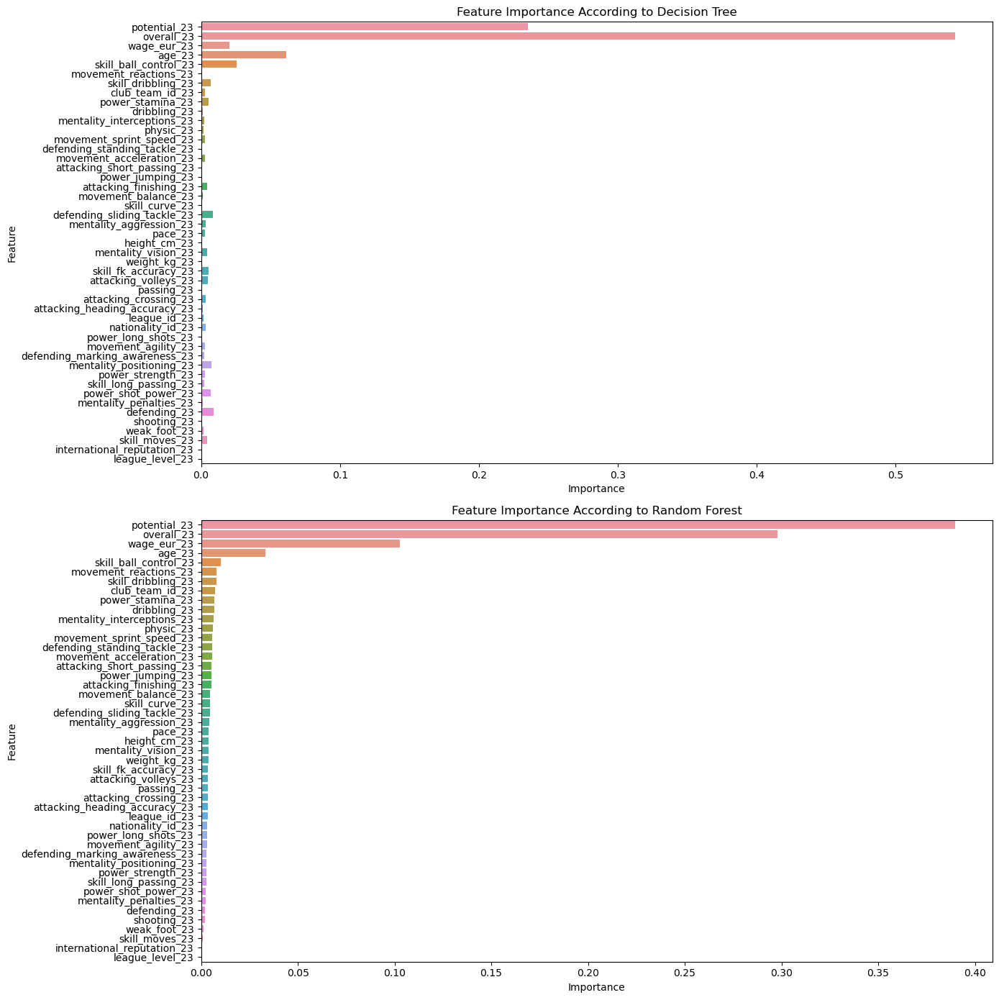

In [138]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming 'data' is your DataFrame and it has been loaded

# Filter data to select only goalkeepers
lateral_defenders = data[data['player_positions_23'].str.contains('LB|RB|LWB|RWB')]

# Define the chosen features for the model
chosen_features_23 = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
lateral_defenders['log_value_eur_24'] = np.log(lateral_defenders['value_eur_24'] + 1)

# Fill NaN values with 0
lateral_defenders = lateral_defenders.fillna(0)

# Select features and target variable
X = lateral_defenders[chosen_features_23]
y = lateral_defenders['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Train a Random Forest Regressor
forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X_train, y_train)

# Get feature importances
tree_importances = tree.feature_importances_
forest_importances = forest.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Decision Tree Importance': tree_importances,
    'Random Forest Importance': forest_importances
})

# Sort DataFrame by Random Forest Importance
importance_df = importance_df.sort_values(by='Random Forest Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(14, 14))
plt.subplot(2, 1, 1)
sns.barplot(x='Decision Tree Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Decision Tree')
plt.xlabel('Importance')

plt.subplot(2, 1, 2)
sns.barplot(x='Random Forest Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Random Forest')
plt.xlabel('Importance')

plt.tight_layout()
plt.show()

                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.943
Model:                            OLS   Adj. R-squared:                  0.898
Method:                 Least Squares   F-statistic:                     20.66
Date:                Thu, 06 Jun 2024   Prob (F-statistic):           2.34e-22
Time:                        15:16:45   Log-Likelihood:                 5.8543
No. Observations:                 102   AIC:                             80.29
Df Residuals:                      56   BIC:                             201.0
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2401562808.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lateral_defenders['log_value_eur_24'] = np.log(lateral_defenders['value_eur_24'] + 1)


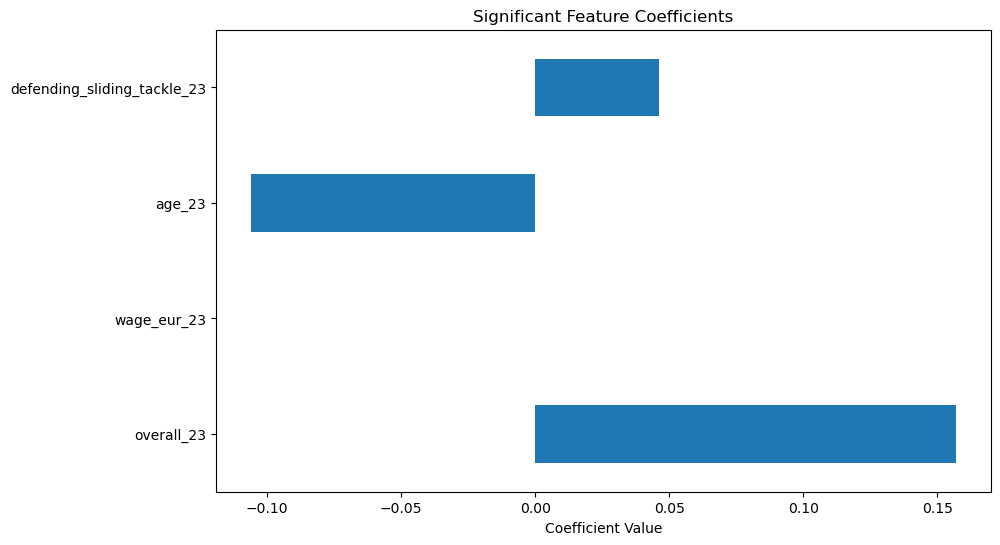

Ridge - R-squared: 0.8383164299203529, MSE: 0.1401160476003142, MAE: 0.3125443594376158
Lasso - R-squared: 0.8743570013607542, MSE: 0.10888305082149385, MAE: 0.23824417290945443
Random Forest - R-squared: 0.6987837660855606, MSE: 0.26103597383674926, MAE: 0.36338797600847317
ANN - R-squared: -210630.05485690344, MSE: 182534.26055533008, MAE: 396.6076607356211
           Model      R-squared            MSE         MAE
0          Ridge       0.838316       0.140116    0.312544
1          Lasso       0.874357       0.108883    0.238244
2  Random Forest       0.698784       0.261036    0.363388
3            ANN -210630.054857  182534.260555  396.607661
Most under-valued Lateral Defenders:        short_name_23  difference_million
91   Otávio Cairinho            2.315262
425         A. Nuñez            1.170681
19          I. Piris            1.043048
226  Douglas Armeira            0.655950
81       Enaldo Praz            0.576326
257      M. Espinoza            0.454669
319         R. Riva

In [139]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from sklearn.linear_model import Ridge, Lasso
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# Assuming 'data' is your DataFrame and it has been loaded

# Filter lateral defenders from the dataset
lateral_defenders = data_am_lat[data_am_lat['player_positions_23'].str.contains('LB|RB|LWB|RWB')]

# Define the chosen features for the model
chosen_features_23_lb = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
lateral_defenders['log_value_eur_24'] = np.log(lateral_defenders['value_eur_24'] + 1)

# Fill NaN values with 0
lateral_defenders = lateral_defenders.fillna(0)

# Create the formula for the OLS model
formula = 'log_value_eur_24 ~ ' + ' + '.join(chosen_features_23_lb)

# Fit the OLS model using the formula
model = ols(formula, data=lateral_defenders).fit()
print(model.summary())

# Perform ANOVA
anova_results = anova_lm(model)
print("\nANOVA table:\n", anova_results)

# Plot the importance of significant features
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'Intercept' in significant_features:
    significant_features.remove('Intercept')

coefs = model.params[significant_features]
coefs.plot(kind='barh', figsize=(10, 6))
plt.xlabel('Coefficient Value')
plt.title('Significant Feature Coefficients')
plt.show()

# Prepare data for other models
X = lateral_defenders[chosen_features_23_lb]
y = lateral_defenders['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model 1: Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
ridge_predictions = ridge.predict(X_test)

# Model 2: Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
lasso_predictions = lasso.predict(X_test)

# Model 3: Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_predictions = rf.predict(X_test)

# Model 4: ANN (MLP Regressor)
mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)
mlp_predictions = mlp.predict(X_test)

# Evaluate the models
def evaluate_model(y_test, predictions, model_name):
    r2 = r2_score(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    print(f"{model_name} - R-squared: {r2}, MSE: {mse}, MAE: {mae}")

evaluate_model(y_test, ridge_predictions, "Ridge")
evaluate_model(y_test, lasso_predictions, "Lasso")
evaluate_model(y_test, rf_predictions, "Random Forest")
evaluate_model(y_test, mlp_predictions, "ANN")

# Compare the models
models = ['Ridge', 'Lasso', 'Random Forest', 'ANN']
r2_scores = [r2_score(y_test, ridge_predictions), r2_score(y_test, lasso_predictions), r2_score(y_test, rf_predictions), r2_score(y_test, mlp_predictions)]
mse_scores = [mean_squared_error(y_test, ridge_predictions), mean_squared_error(y_test, lasso_predictions), mean_squared_error(y_test, rf_predictions), mean_squared_error(y_test, mlp_predictions)]
mae_scores = [mean_absolute_error(y_test, ridge_predictions), mean_absolute_error(y_test, lasso_predictions), mean_absolute_error(y_test, rf_predictions), mean_absolute_error(y_test, mlp_predictions)]

comparison = pd.DataFrame({
    'Model': models,
    'R-squared': r2_scores,
    'MSE': mse_scores,
    'MAE': mae_scores
})

print(comparison)

# Identify under-valued and over-valued lateral defenders based on the best model
best_model_name = 'Random Forest'  # Assuming Random Forest is the best model from comparison
best_model_predictions_log = rf.predict(X)
best_model_predictions = np.exp(best_model_predictions_log) - 1

lateral_defenders['predicted_value'] = best_model_predictions
lateral_defenders['predicted_value_million'] = lateral_defenders['predicted_value'] / 1_000_000
lateral_defenders['actual_value_million'] = lateral_defenders['value_eur_24'] / 1_000_000
lateral_defenders['difference_million'] = lateral_defenders['predicted_value_million'] - lateral_defenders['actual_value_million']

under_valued_ld = lateral_defenders[lateral_defenders['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_ld = lateral_defenders[lateral_defenders['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Lateral Defenders:", under_valued_ld[['short_name_23', 'difference_million']])
print("Most over-valued Lateral Defenders:", over_valued_ld[['short_name_23', 'difference_million']])

## Ridge Regression :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/3236996392.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lateral_defenders['log_value_eur_24'] = np.log(lateral_defenders['value_eur_24'] + 1)


Ridge coefficients: [-9.24276467e-03  5.04770746e-02  7.16203038e-01  2.42860260e-01
  8.57841981e-02 -4.10976579e-01  9.63218803e-03 -8.32631038e-02
 -4.77226038e-02  1.34540532e-02  1.06011614e-02  1.51065351e-02
  1.13518104e-02  4.76817355e-01  3.10652319e-01  1.20063259e+00
  3.64956366e-02 -1.19574659e-01  6.70882822e-01 -3.07479820e-01
 -1.48359219e-01 -7.76528711e-04 -3.62191677e-01  1.05167371e-02
  2.56586463e-02 -1.11986615e-01 -9.63312193e-02 -2.43176930e-01
 -5.53085786e-02 -1.81594518e-01 -2.62420733e-01 -1.82150494e-02
  6.10759497e-02 -3.69472249e-02 -9.87958173e-02 -5.03676465e-02
 -1.65411977e-01 -3.81022868e-01 -6.69613042e-02 -1.78592598e-01
  4.76773623e-02 -7.04161593e-02 -3.01105596e-01  1.50790745e-02
  1.12900890e-02  9.51165333e-02  2.01029948e-02]
Most under-valued Lateral Defenders:             short_name_23  difference_million
990   T. Alexander-Arnold           33.617211
1079            A. Davies           25.373724
1105            A. Hakimi           13.0

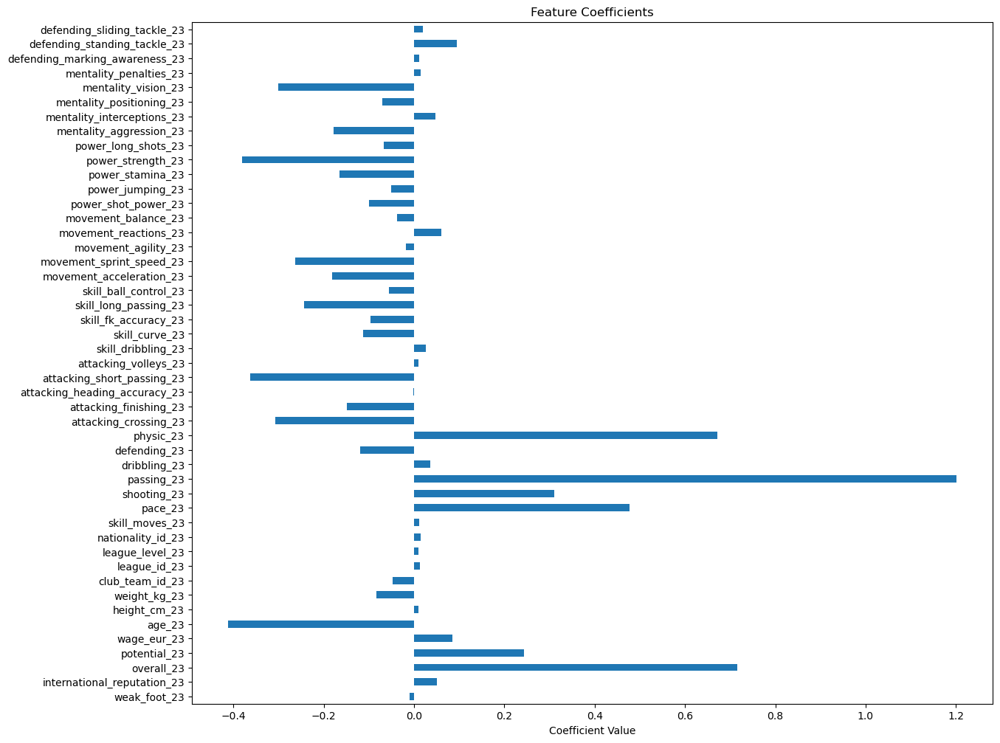

In [140]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler


# Define the chosen features for the model
chosen_features_23_ld = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Filter lateral defenders from the dataset
lateral_defenders = data[data['player_positions_23'].str.contains('LB|RB|LWB|RWB')]

# Create a new column for the logarithmic transformation of 'value_eur_24'
lateral_defenders['log_value_eur_24'] = np.log(lateral_defenders['value_eur_24'] + 1)

# Fill NaN values with 0
lateral_defenders = lateral_defenders.fillna(0)

# Prepare data for Ridge model
X = lateral_defenders[chosen_features_23_ld]
y = lateral_defenders['log_value_eur_24']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit the Ridge model
ridge = Ridge(alpha=0.1)
ridge.fit(X_scaled, y)

# Print model coefficients
print(f'Ridge coefficients: {ridge.coef_}')

# Predict values on the entire dataset
lateral_defenders['predicted_log_value'] = ridge.predict(X_scaled)
lateral_defenders['predicted_value'] = np.exp(lateral_defenders['predicted_log_value']) - 1
lateral_defenders['predicted_value_million'] = lateral_defenders['predicted_value'] / 1_000_000
lateral_defenders['actual_value_million'] = lateral_defenders['value_eur_24'] / 1_000_000
lateral_defenders['difference_million'] = lateral_defenders['predicted_value_million'] - lateral_defenders['actual_value_million']

under_valued_ld = lateral_defenders[lateral_defenders['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_ld = lateral_defenders[lateral_defenders['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Lateral Defenders:", under_valued_ld[['short_name_23', 'difference_million']])
print("Most over-valued Lateral Defenders:", over_valued_ld[['short_name_23', 'difference_million']])

# Calculate performance metrics
r2 = r2_score(lateral_defenders['value_eur_24'], lateral_defenders['predicted_value'])
rmse = mean_squared_error(lateral_defenders['value_eur_24'], lateral_defenders['predicted_value'], squared=False)
mae = mean_absolute_error(lateral_defenders['value_eur_24'], lateral_defenders['predicted_value'])

print(f"R-squared: {r2}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")

# Plot the importance of significant features
coefs = pd.Series(ridge.coef_, index=chosen_features_23_ld)
coefs.plot(kind='barh', figsize=(14,12))
plt.xlabel('Coefficient Value')
plt.title('Feature Coefficients')
plt.show()

# CDM / CM / CAM Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/3736661425.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  central_midfielders['log_value_eur_24'] = np.log(central_midfielders['value_eur_24'] + 1)


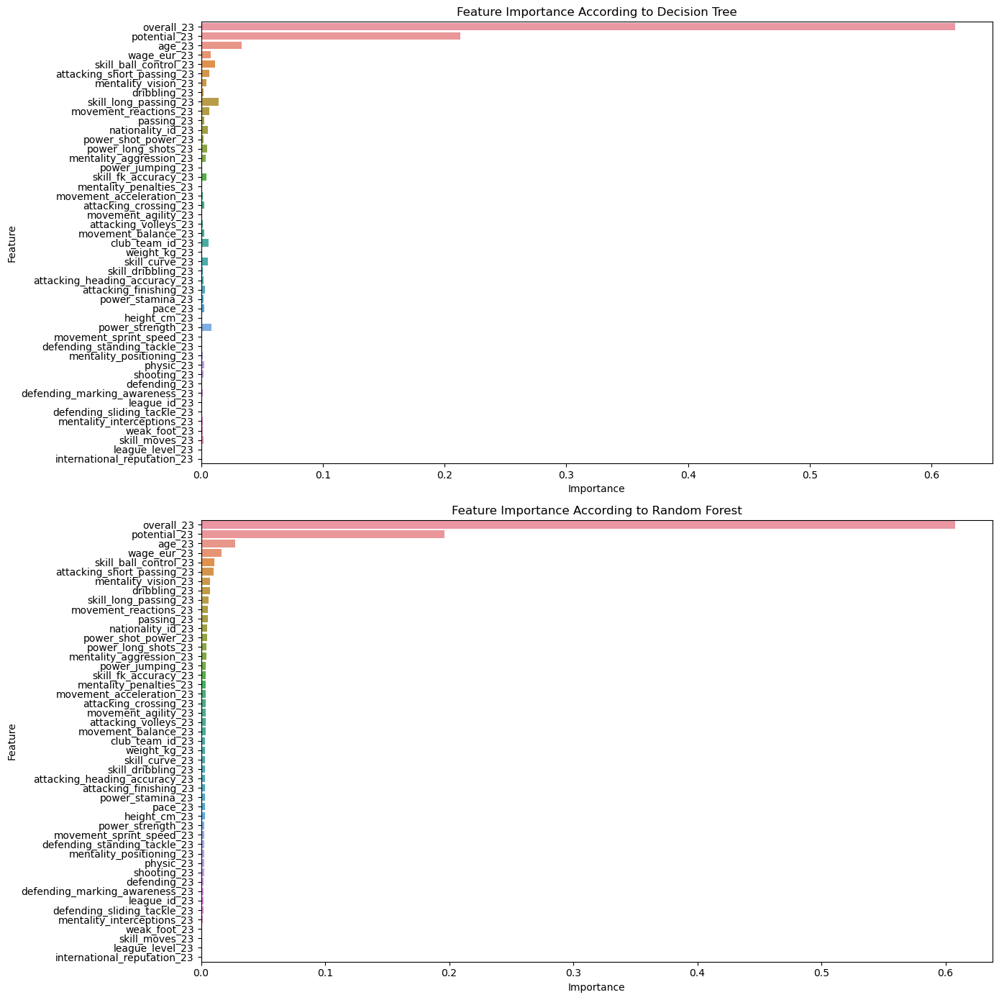

In [141]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming 'data' is your DataFrame and it has been loaded

# Filter data to select only goalkeepers
central_midfielders = data[data['player_positions_23'].str.contains('CDM|CM|CAM')]

# Define the chosen features for the model
chosen_features_23 = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
central_midfielders['log_value_eur_24'] = np.log(central_midfielders['value_eur_24'] + 1)

# Fill NaN values with 0
central_midfielders = central_midfielders.fillna(0)

# Select features and target variable
X = central_midfielders[chosen_features_23]
y = central_midfielders['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Train a Random Forest Regressor
forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X_train, y_train)

# Get feature importances
tree_importances = tree.feature_importances_
forest_importances = forest.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Decision Tree Importance': tree_importances,
    'Random Forest Importance': forest_importances
})

# Sort DataFrame by Random Forest Importance
importance_df = importance_df.sort_values(by='Random Forest Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(14, 14))
plt.subplot(2, 1, 1)
sns.barplot(x='Decision Tree Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Decision Tree')
plt.xlabel('Importance')

plt.subplot(2, 1, 2)
sns.barplot(x='Random Forest Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Random Forest')
plt.xlabel('Importance')

plt.tight_layout()
plt.show()

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/3439759156.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  central_midfielders['log_value_eur_24'] = np.log(central_midfielders['value_eur_24'] + 1)


                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.868
Model:                            OLS   Adj. R-squared:                  0.858
Method:                 Least Squares   F-statistic:                     88.68
Date:                Thu, 06 Jun 2024   Prob (F-statistic):          6.01e-246
Time:                        15:26:02   Log-Likelihood:                -463.18
No. Observations:                 682   AIC:                             1022.
Df Residuals:                     634   BIC:                             1240.
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

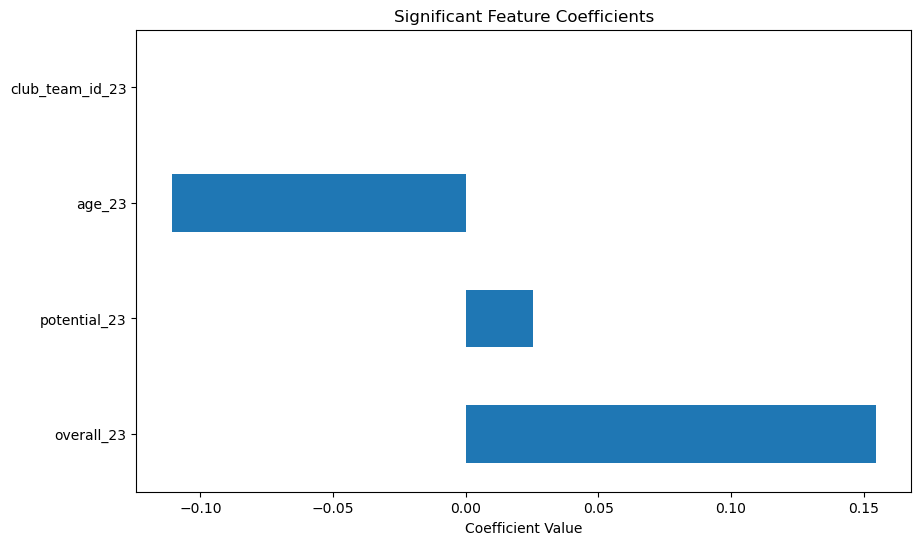

Ridge - R-squared: 0.8451599105573879, MSE: 0.24847417822419876, MAE: 0.39118923092048996
Lasso - R-squared: 0.857537679886121, MSE: 0.22861138898610858, MAE: 0.3700952144779359
Random Forest - R-squared: 0.8285555795589049, MSE: 0.275119393392069, MAE: 0.3873311964290278
ANN - R-squared: -71.51072063535236, MSE: 116.35902424992614, MAE: 5.227334333412872
           Model  R-squared         MSE       MAE
0          Ridge   0.845160    0.248474  0.391189
1          Lasso   0.857538    0.228611  0.370095
2  Random Forest   0.828556    0.275119  0.387331
3            ANN -71.510721  116.359024  5.227334
Most under-valued Central Midfielders:         short_name_23  difference_million
1072     Carlos Soler           41.665061
131          I. Gueye           16.271248
286          Jorginho           11.997223
605       K. Phillips           11.722938
658       Fabián Ruiz           10.534472
...               ...                 ...
1969     K. Šekularac            0.006332
1064    Tomás Nun

In [142]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from sklearn.linear_model import Ridge, Lasso
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# Assuming 'data' is your DataFrame and it has been loaded

# Filter central midfielders from the dataset
central_midfielders = data[data['player_positions_23'].str.contains('CM|CDM|CAM')]

# Define the chosen features for the model
chosen_features_23_cm = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
central_midfielders['log_value_eur_24'] = np.log(central_midfielders['value_eur_24'] + 1)

# Fill NaN values with 0
central_midfielders = central_midfielders.fillna(0)

# Create the formula for the OLS model
formula = 'log_value_eur_24 ~ ' + ' + '.join(chosen_features_23_cm)

# Fit the OLS model using the formula
model = ols(formula, data=central_midfielders).fit()
print(model.summary())

# Perform ANOVA
anova_results = anova_lm(model)
print("\nANOVA table:\n", anova_results)

# Plot the importance of significant features
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'Intercept' in significant_features:
    significant_features.remove('Intercept')

coefs = model.params[significant_features]
coefs.plot(kind='barh', figsize=(10, 6))
plt.xlabel('Coefficient Value')
plt.title('Significant Feature Coefficients')
plt.show()

# Prepare data for other models
X = central_midfielders[chosen_features_23_cm]
y = central_midfielders['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model 1: Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
ridge_predictions = ridge.predict(X_test)

# Model 2: Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
lasso_predictions = lasso.predict(X_test)

# Model 3: Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_predictions = rf.predict(X_test)

# Model 4: ANN (MLP Regressor)
mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)
mlp_predictions = mlp.predict(X_test)

# Evaluate the models
def evaluate_model(y_test, predictions, model_name):
    r2 = r2_score(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    print(f"{model_name} - R-squared: {r2}, MSE: {mse}, MAE: {mae}")

evaluate_model(y_test, ridge_predictions, "Ridge")
evaluate_model(y_test, lasso_predictions, "Lasso")
evaluate_model(y_test, rf_predictions, "Random Forest")
evaluate_model(y_test, mlp_predictions, "ANN")

# Compare the models
models = ['Ridge', 'Lasso', 'Random Forest', 'ANN']
r2_scores = [r2_score(y_test, ridge_predictions), r2_score(y_test, lasso_predictions), r2_score(y_test, rf_predictions), r2_score(y_test, mlp_predictions)]
mse_scores = [mean_squared_error(y_test, ridge_predictions), mean_squared_error(y_test, lasso_predictions), mean_squared_error(y_test, rf_predictions), mean_squared_error(y_test, mlp_predictions)]
mae_scores = [mean_absolute_error(y_test, ridge_predictions), mean_absolute_error(y_test, lasso_predictions), mean_absolute_error(y_test, rf_predictions), mean_absolute_error(y_test, mlp_predictions)]

comparison = pd.DataFrame({
    'Model': models,
    'R-squared': r2_scores,
    'MSE': mse_scores,
    'MAE': mae_scores
})

print(comparison)

# Identify under-valued and over-valued central midfielders based on the best model
best_model_name = 'Random Forest'  # Assuming Random Forest is the best model from comparison
best_model_predictions_log = rf.predict(X)
best_model_predictions = np.exp(best_model_predictions_log) - 1

central_midfielders['predicted_value'] = best_model_predictions
central_midfielders['predicted_value_million'] = central_midfielders['predicted_value'] / 1_000_000
central_midfielders['actual_value_million'] = central_midfielders['value_eur_24'] / 1_000_000
central_midfielders['difference_million'] = central_midfielders['predicted_value_million'] - central_midfielders['actual_value_million']

under_valued_cm = central_midfielders[central_midfielders['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_cm = central_midfielders[central_midfielders['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Central Midfielders:", under_valued_cm[['short_name_23', 'difference_million']])
print("Most over-valued Central Midfielders:", over_valued_cm[['short_name_23', 'difference_million']])

## Ridge Regression Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/3951356279.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  central_midfielders['log_value_eur_24'] = np.log(central_midfielders['value_eur_24'] + 1)


Most under-valued Central Midfielders:        short_name_23  difference_million
116     K. De Bruyne           67.079440
1121      K. Havertz           48.280618
1212        P. Foden           47.822846
1040        M. Mount           30.974927
1238     W. McKennie           20.882604
...              ...                 ...
938   Lucas Medeirão            0.039613
539      F. Jagiełło            0.019580
582         L. Jäger            0.016908
1178        H. Maïga            0.014658
560          O. Duda            0.011604

[345 rows x 2 columns]
Most over-valued Central Midfielders:          short_name_23  difference_million
1517  K. Kvaratskhelia          -91.004445
1660        J. Musiala          -70.538411
1285   A. Mac Allister          -26.645574
1326         S. Tonali          -25.936236
581          Joelinton          -24.747383
...                ...                 ...
1407   B. Lyons-Foster           -0.011030
1951           E. Omić           -0.010249
1831      G. Manvely

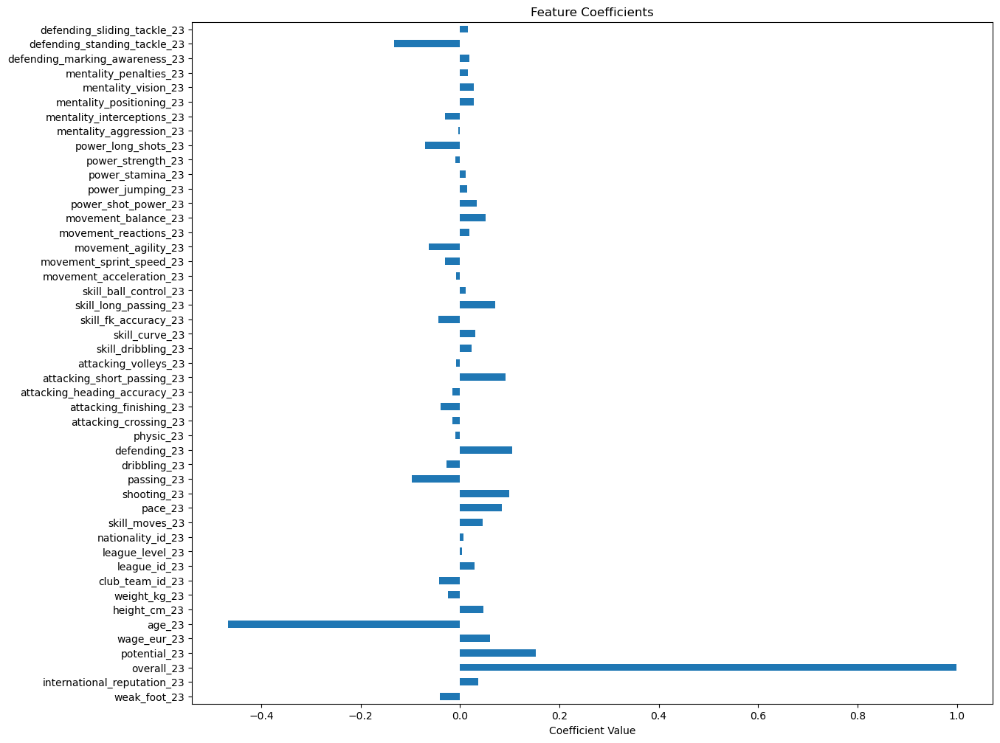

In [144]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler

# Assuming 'data' is your DataFrame and it has been loaded

# Define the chosen features for the model
chosen_features_23_cm = ['weak_foot_23', 'international_reputation_23',
                         'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                         'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                         'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                         'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                         'attacking_finishing_23', 'attacking_heading_accuracy_23',
                         'attacking_short_passing_23', 'attacking_volleys_23',
                         'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                         'skill_long_passing_23', 'skill_ball_control_23',
                         'movement_acceleration_23', 'movement_sprint_speed_23',
                         'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                         'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                         'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                         'mentality_interceptions_23', 'mentality_positioning_23',
                         'mentality_vision_23', 'mentality_penalties_23',
                         'defending_marking_awareness_23', 'defending_standing_tackle_23',
                         'defending_sliding_tackle_23']

# Filter central midfielders from the dataset
central_midfielders = data[data['player_positions_23'].str.contains('CM|CDM|CAM')]

# Create a new column for the logarithmic transformation of 'value_eur_24'
central_midfielders['log_value_eur_24'] = np.log(central_midfielders['value_eur_24'] + 1)

# Fill NaN values with 0
central_midfielders = central_midfielders.fillna(0)

# Prepare data for Ridge regression
X = central_midfielders[chosen_features_23_cm]
y = central_midfielders['log_value_eur_24']

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit the Ridge regression model
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_scaled, y)

# Predict values on the entire dataset
central_midfielders['predicted_log_value'] = ridge_model.predict(X_scaled)
central_midfielders['predicted_value'] = np.exp(central_midfielders['predicted_log_value']) - 1
central_midfielders['predicted_value_million'] = central_midfielders['predicted_value'] / 1_000_000
central_midfielders['actual_value_million'] = central_midfielders['value_eur_24'] / 1_000_000
central_midfielders['difference_million'] = central_midfielders['predicted_value_million'] - central_midfielders['actual_value_million']

under_valued_cm = central_midfielders[central_midfielders['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_cm = central_midfielders[central_midfielders['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Central Midfielders:", under_valued_cm[['short_name_23', 'difference_million']])
print("Most over-valued Central Midfielders:", over_valued_cm[['short_name_23', 'difference_million']])

# Calculate performance metrics
r2 = r2_score(central_midfielders['value_eur_24'], central_midfielders['predicted_value'])
rmse = mean_squared_error(central_midfielders['value_eur_24'], central_midfielders['predicted_value'], squared=False)
mae = mean_absolute_error(central_midfielders['value_eur_24'], central_midfielders['predicted_value'])

print(f"R-squared: {r2}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")

# Plot the importance of significant features
coefs = pd.Series(ridge_model.coef_, index=chosen_features_23_cm)
coefs.plot(kind='barh', figsize=(14,12))
plt.xlabel('Coefficient Value')
plt.title('Feature Coefficients')
plt.show()

# LM / RM / LW / RW Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2102363683.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lateral_midfielders['log_value_eur_24'] = np.log(lateral_midfielders['value_eur_24'] + 1)


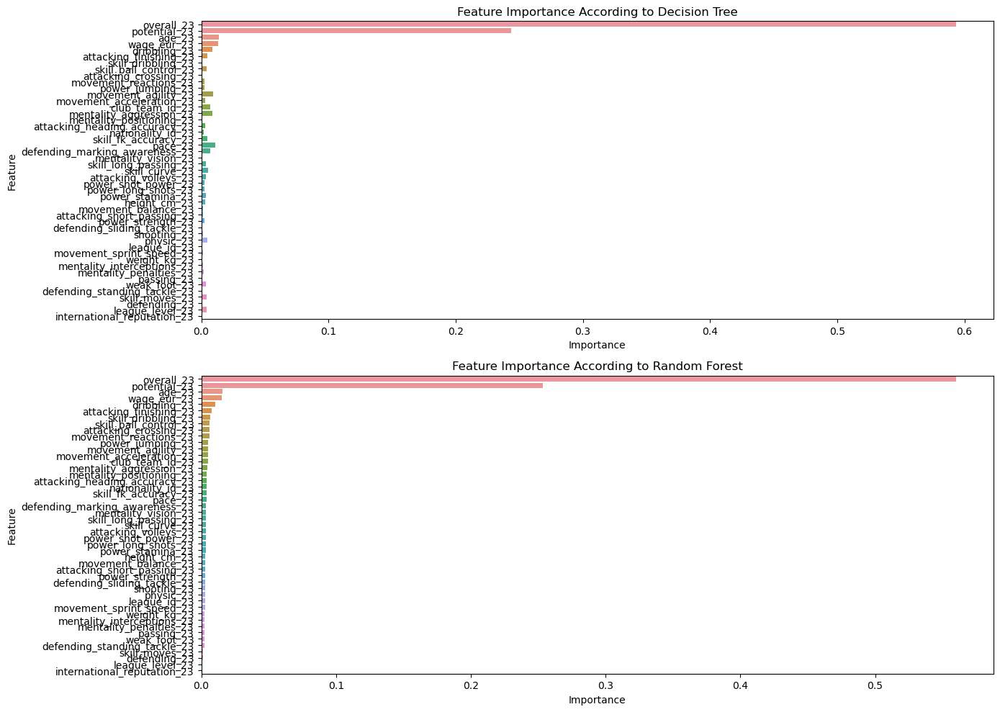

In [145]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming 'data' is your DataFrame and it has been loaded

# Filter data to select only goalkeepers
lateral_midfielders = data[data['player_positions_23'].str.contains('LM|RM|RW|LW')]

# Define the chosen features for the model
chosen_features_23 = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
lateral_midfielders['log_value_eur_24'] = np.log(lateral_midfielders['value_eur_24'] + 1)

# Fill NaN values with 0
lateral_midfielders = lateral_midfielders.fillna(0)

# Select features and target variable
X = lateral_midfielders[chosen_features_23]
y = lateral_midfielders['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Train a Random Forest Regressor
forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X_train, y_train)

# Get feature importances
tree_importances = tree.feature_importances_
forest_importances = forest.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Decision Tree Importance': tree_importances,
    'Random Forest Importance': forest_importances
})

# Sort DataFrame by Random Forest Importance
importance_df = importance_df.sort_values(by='Random Forest Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(14, 10))
plt.subplot(2, 1, 1)
sns.barplot(x='Decision Tree Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Decision Tree')
plt.xlabel('Importance')

plt.subplot(2, 1, 2)
sns.barplot(x='Random Forest Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Random Forest')
plt.xlabel('Importance')

plt.tight_layout()
plt.show()

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/928538199.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lateral_midfielders_wingers['log_value_eur_24'] = np.log(lateral_midfielders_wingers['value_eur_24'] + 1)


                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.862
Model:                            OLS   Adj. R-squared:                  0.850
Method:                 Least Squares   F-statistic:                     73.51
Date:                Thu, 06 Jun 2024   Prob (F-statistic):          7.30e-207
Time:                        15:31:50   Log-Likelihood:                -389.01
No. Observations:                 603   AIC:                             874.0
Df Residuals:                     555   BIC:                             1085.
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

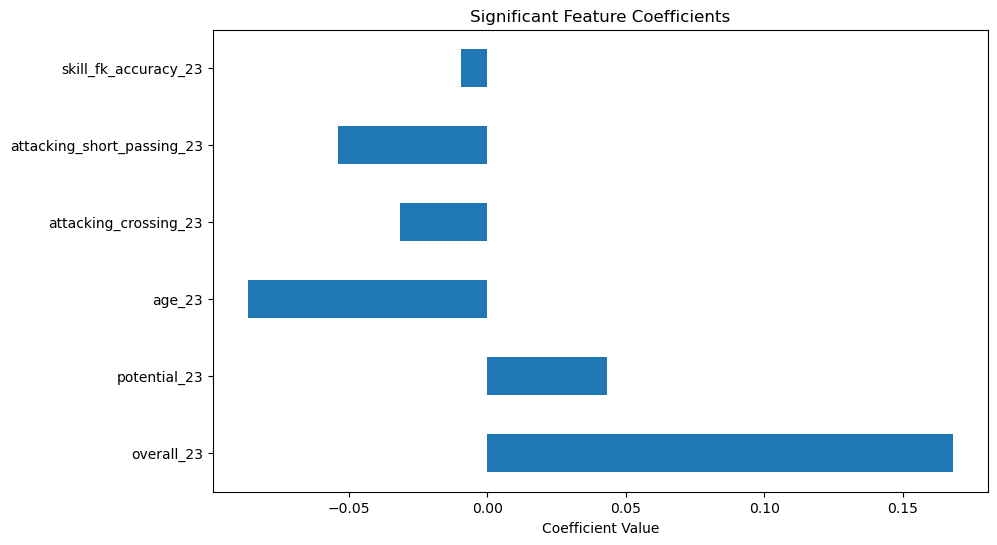

Ridge - R-squared: 0.8129393264809006, MSE: 0.28815674401484737, MAE: 0.40405467816282487
Lasso - R-squared: 0.8293115897254064, MSE: 0.26293616728999625, MAE: 0.38936943722289435
Random Forest - R-squared: 0.8187478575020242, MSE: 0.2792090194340027, MAE: 0.3994406271016202
ANN - R-squared: -138.77862917789204, MSE: 215.32133884168658, MAE: 5.518589169182792
           Model   R-squared         MSE       MAE
0          Ridge    0.812939    0.288157  0.404055
1          Lasso    0.829312    0.262936  0.389369
2  Random Forest    0.818748    0.279209  0.399441
3            ANN -138.778629  215.321339  5.518589
Most under-valued Lateral Midfielders/Wingers:         short_name_23  difference_million
682        C. Pulisic           27.876841
72            M. Reus           22.626385
45         I. Perišić           20.734614
1314        H. Traorè           16.205716
1419      J. Burkardt           12.918377
...               ...                 ...
1524         T. Ballo            0.006402


In [146]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from sklearn.linear_model import Ridge, Lasso
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# Assuming 'data' is your DataFrame and it has been loaded

# Filter lateral midfielders and wingers from the dataset
lateral_midfielders_wingers = data[data['player_positions_23'].str.contains('LM|RM|LW|RW')]

# Define the chosen features for the model
chosen_features_23_lmw = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
lateral_midfielders_wingers['log_value_eur_24'] = np.log(lateral_midfielders_wingers['value_eur_24'] + 1)

# Fill NaN values with 0
lateral_midfielders_wingers = lateral_midfielders_wingers.fillna(0)

# Create the formula for the OLS model
formula = 'log_value_eur_24 ~ ' + ' + '.join(chosen_features_23_lmw)

# Fit the OLS model using the formula
model = ols(formula, data=lateral_midfielders_wingers).fit()
print(model.summary())

# Perform ANOVA
anova_results = anova_lm(model)
print("\nANOVA table:\n", anova_results)

# Plot the importance of significant features
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'Intercept' in significant_features:
    significant_features.remove('Intercept')

coefs = model.params[significant_features]
coefs.plot(kind='barh', figsize=(10, 6))
plt.xlabel('Coefficient Value')
plt.title('Significant Feature Coefficients')
plt.show()

# Prepare data for other models
X = lateral_midfielders_wingers[chosen_features_23_lmw]
y = lateral_midfielders_wingers['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model 1: Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
ridge_predictions = ridge.predict(X_test)

# Model 2: Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
lasso_predictions = lasso.predict(X_test)

# Model 3: Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_predictions = rf.predict(X_test)

# Model 4: ANN (MLP Regressor)
mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)
mlp_predictions = mlp.predict(X_test)

# Evaluate the models
def evaluate_model(y_test, predictions, model_name):
    r2 = r2_score(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    print(f"{model_name} - R-squared: {r2}, MSE: {mse}, MAE: {mae}")

evaluate_model(y_test, ridge_predictions, "Ridge")
evaluate_model(y_test, lasso_predictions, "Lasso")
evaluate_model(y_test, rf_predictions, "Random Forest")
evaluate_model(y_test, mlp_predictions, "ANN")

# Compare the models
models = ['Ridge', 'Lasso', 'Random Forest', 'ANN']
r2_scores = [r2_score(y_test, ridge_predictions), r2_score(y_test, lasso_predictions), r2_score(y_test, rf_predictions), r2_score(y_test, mlp_predictions)]
mse_scores = [mean_squared_error(y_test, ridge_predictions), mean_squared_error(y_test, lasso_predictions), mean_squared_error(y_test, rf_predictions), mean_squared_error(y_test, mlp_predictions)]
mae_scores = [mean_absolute_error(y_test, ridge_predictions), mean_absolute_error(y_test, lasso_predictions), mean_absolute_error(y_test, rf_predictions), mean_absolute_error(y_test, mlp_predictions)]

comparison = pd.DataFrame({
    'Model': models,
    'R-squared': r2_scores,
    'MSE': mse_scores,
    'MAE': mae_scores
})

print(comparison)

# Identify under-valued and over-valued lateral midfielders/wingers based on the best model
best_model_name = 'Random Forest'  # Assuming Random Forest is the best model from comparison
best_model_predictions_log = rf.predict(X)
best_model_predictions = np.exp(best_model_predictions_log) - 1

lateral_midfielders_wingers['predicted_value'] = best_model_predictions
lateral_midfielders_wingers['predicted_value_million'] = lateral_midfielders_wingers['predicted_value'] / 1_000_000
lateral_midfielders_wingers['actual_value_million'] = lateral_midfielders_wingers['value_eur_24'] / 1_000_000
lateral_midfielders_wingers['difference_million'] = lateral_midfielders_wingers['predicted_value_million'] - lateral_midfielders_wingers['actual_value_million']

under_valued_lmw = lateral_midfielders_wingers[lateral_midfielders_wingers['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_lmw = lateral_midfielders_wingers[lateral_midfielders_wingers['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Lateral Midfielders/Wingers:", under_valued_lmw[['short_name_23', 'difference_million']])
print("Most over-valued Lateral Midfielders/Wingers:", over_valued_lmw[['short_name_23', 'difference_million']])

## Ridge Regression Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/112436805.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lateral_midfielders['log_value_eur_24'] = np.log(lateral_midfielders['value_eur_24'] + 1)


Most under-valued Lateral Midfielders:      short_name_23  difference_million
1004     K. Mbappé          130.467693
358       M. Salah           27.041393
1038     J. Sancho           26.801255
1040      M. Mount           25.908855
191         H. Son           23.861014
...            ...                 ...
1206       F. Pick            0.018235
1656   O. Marmoush            0.014281
1462     N. Alioui            0.011549
1662    Fali Candé            0.007383
1831  G. Manvelyan            0.002358

[330 rows x 2 columns]
Most over-valued Lateral Midfielders:          short_name_23  difference_million
1517  K. Kvaratskhelia          -87.054531
1660        J. Musiala          -75.056052
1489           B. Saka          -44.839732
1211     R. Kolo Muani          -37.896403
1001       M. Rashford          -34.795909
...                ...                 ...
1507          Anderson           -0.016383
1708         E. Dinkçi           -0.015077
935     Wilsson Rosito           -0.006658
9

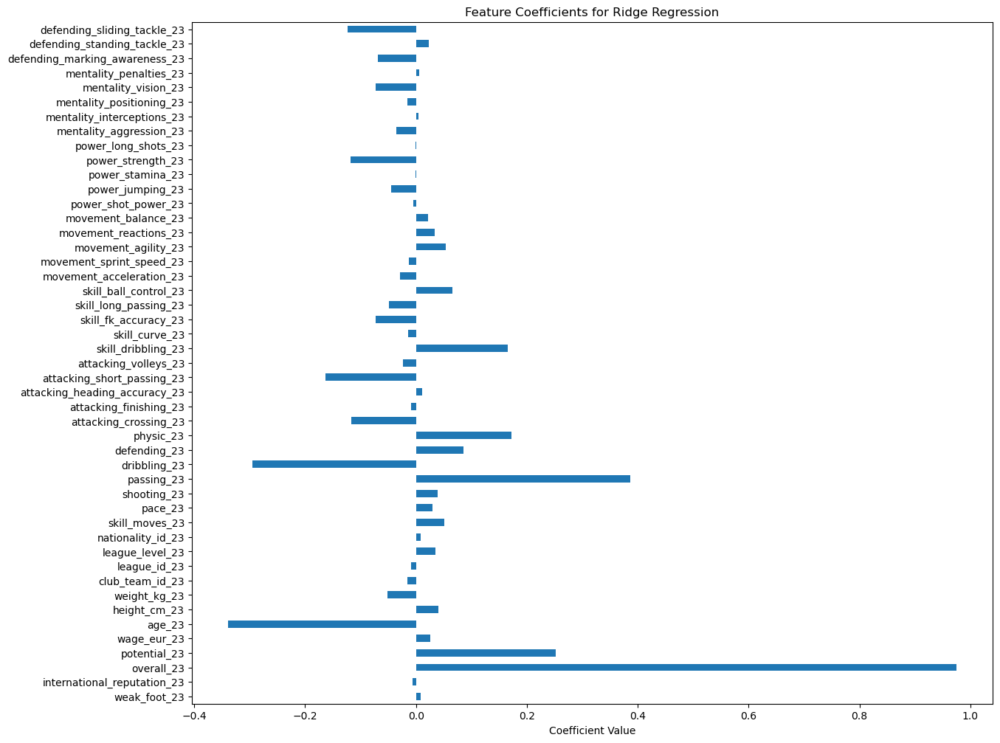

In [147]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler

# Define the chosen features for the model
chosen_features_23_lm = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Assuming 'data' is your DataFrame and it has been loaded
# Filter lateral midfielders from the dataset
lateral_midfielders = data[data['player_positions_23'].str.contains('LM|RM|LW|RW')]

# Create a new column for the logarithmic transformation of 'value_eur_24'
lateral_midfielders['log_value_eur_24'] = np.log(lateral_midfielders['value_eur_24'] + 1)

# Fill NaN values with 0
lateral_midfielders = lateral_midfielders.fillna(0)

# Prepare data for Ridge regression
X = lateral_midfielders[chosen_features_23_lm]
y = lateral_midfielders['log_value_eur_24']

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit the Ridge regression model
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_scaled, y)

# Predict values on the entire dataset
lateral_midfielders['predicted_log_value'] = ridge_model.predict(X_scaled)
lateral_midfielders['predicted_value'] = np.exp(lateral_midfielders['predicted_log_value']) - 1
lateral_midfielders['predicted_value_million'] = lateral_midfielders['predicted_value'] / 1_000_000
lateral_midfielders['actual_value_million'] = lateral_midfielders['value_eur_24'] / 1_000_000
lateral_midfielders['difference_million'] = lateral_midfielders['predicted_value_million'] - lateral_midfielders['actual_value_million']

under_valued_lm = lateral_midfielders[lateral_midfielders['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_lm = lateral_midfielders[lateral_midfielders['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Lateral Midfielders:", under_valued_lm[['short_name_23', 'difference_million']])
print("Most over-valued Lateral Midfielders:", over_valued_lm[['short_name_23', 'difference_million']])

# Calculate performance metrics
r2 = r2_score(lateral_midfielders['value_eur_24'], lateral_midfielders['predicted_value'])
rmse = mean_squared_error(lateral_midfielders['value_eur_24'], lateral_midfielders['predicted_value'], squared=False)
mae = mean_absolute_error(lateral_midfielders['value_eur_24'], lateral_midfielders['predicted_value'])

print(f"R-squared: {r2}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")

# Plot the importance of significant features
coefs = pd.Series(ridge_model.coef_, index=chosen_features_23_lm)
coefs.plot(kind='barh', figsize=(14,12))
plt.xlabel('Coefficient Value')
plt.title('Feature Coefficients for Ridge Regression')
plt.show()

# ST / CF Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/1772794527.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  central_forwards['log_value_eur_24'] = np.log(central_forwards['value_eur_24'] + 1)


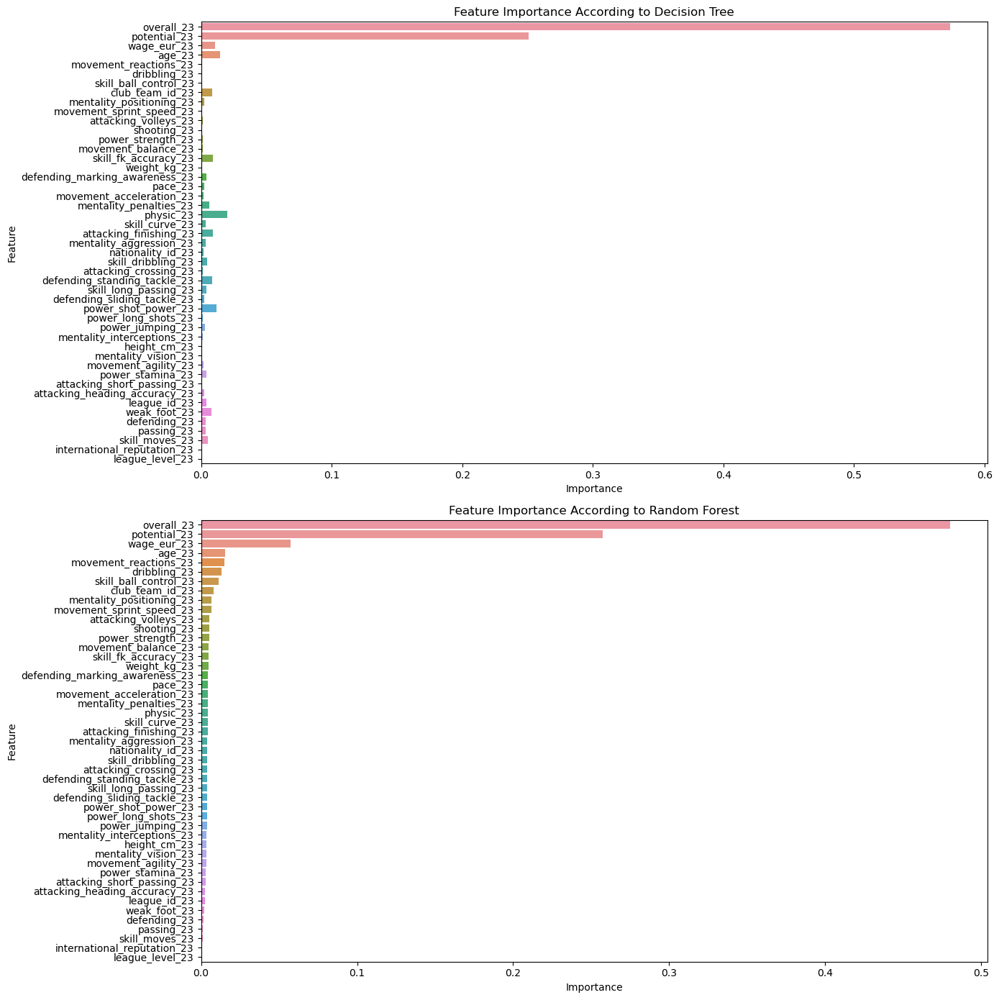

In [148]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming 'data' is your DataFrame and it has been loaded

# Filter data to select only goalkeepers
central_forwards = data[data['player_positions_23'].str.contains('CF|ST')]

# Define the chosen features for the model
chosen_features_23 = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
central_forwards['log_value_eur_24'] = np.log(central_forwards['value_eur_24'] + 1)

# Fill NaN values with 0
central_forwards = central_forwards.fillna(0)

# Select features and target variable
X = central_forwards[chosen_features_23]
y = central_forwards['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Train a Random Forest Regressor
forest = RandomForestRegressor(n_estimators=100, random_state=42)
forest.fit(X_train, y_train)

# Get feature importances
tree_importances = tree.feature_importances_
forest_importances = forest.feature_importances_

# Create a DataFrame for visualization
features = X.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Decision Tree Importance': tree_importances,
    'Random Forest Importance': forest_importances
})

# Sort DataFrame by Random Forest Importance
importance_df = importance_df.sort_values(by='Random Forest Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(14, 14))
plt.subplot(2, 1, 1)
sns.barplot(x='Decision Tree Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Decision Tree')
plt.xlabel('Importance')

plt.subplot(2, 1, 2)
sns.barplot(x='Random Forest Importance', y='Feature', data=importance_df)
plt.title('Feature Importance According to Random Forest')
plt.xlabel('Importance')

plt.tight_layout()
plt.show()

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2696514350.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  central_forwards['log_value_eur_24'] = np.log(central_forwards['value_eur_24'] + 1)


                            OLS Regression Results                            
Dep. Variable:       log_value_eur_24   R-squared:                       0.849
Model:                            OLS   Adj. R-squared:                  0.827
Method:                 Least Squares   F-statistic:                     39.25
Date:                Thu, 06 Jun 2024   Prob (F-statistic):          2.05e-108
Time:                        15:42:48   Log-Likelihood:                -272.67
No. Observations:                 377   AIC:                             641.3
Df Residuals:                     329   BIC:                             830.1
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

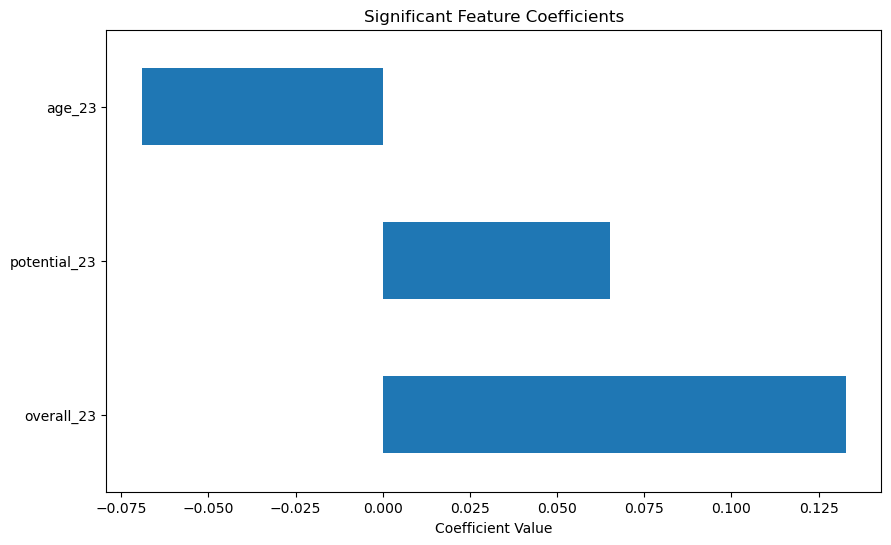

Ridge - R-squared: 0.8286823449883083, MSE: 0.2766321051202667, MAE: 0.4331108290617321
Lasso - R-squared: 0.8345966727231984, MSE: 0.2670820506815564, MAE: 0.42318866272493816
Random Forest - R-squared: 0.8251063976521971, MSE: 0.28240630182708093, MAE: 0.43035129699731295
ANN - R-squared: -80.2970381216085, MSE: 131.2729315264578, MAE: 5.568431742710209
           Model  R-squared         MSE       MAE
0          Ridge   0.828682    0.276632  0.433111
1          Lasso   0.834597    0.267082  0.423189
2  Random Forest   0.825106    0.282406  0.430351
3            ANN -80.297038  131.272932  5.568432
Most under-valued Central Forwards:         short_name_23  difference_million
1597         D. Núñez           23.738372
1087       J. Brekalo           21.908053
74      P. Aubameyang            7.334112
147           D. Ings            6.323007
1121       K. Havertz            5.876997
...               ...                 ...
1462        N. Alioui            0.030612
954   Flávio Triginh

In [149]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from sklearn.linear_model import Ridge, Lasso
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# Assuming 'data' is your DataFrame and it has been loaded

# Filter central forwards from the dataset
central_forwards = data[data['player_positions_23'].str.contains('CF|ST')]

# Define the chosen features for the model
chosen_features_23_cf = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Create a new column for the logarithmic transformation of 'value_eur_24'
central_forwards['log_value_eur_24'] = np.log(central_forwards['value_eur_24'] + 1)

# Fill NaN values with 0
central_forwards = central_forwards.fillna(0)

# Create the formula for the OLS model
formula = 'log_value_eur_24 ~ ' + ' + '.join(chosen_features_23_cf)

# Fit the OLS model using the formula
model = ols(formula, data=central_forwards).fit()
print(model.summary())

# Perform ANOVA
anova_results = anova_lm(model)
print("\nANOVA table:\n", anova_results)

# Plot the importance of significant features
significant_features = model.pvalues[model.pvalues < 0.05].index.tolist()
if 'Intercept' in significant_features:
    significant_features.remove('Intercept')

coefs = model.params[significant_features]
coefs.plot(kind='barh', figsize=(10, 6))
plt.xlabel('Coefficient Value')
plt.title('Significant Feature Coefficients')
plt.show()

# Prepare data for other models
X = central_forwards[chosen_features_23_cf]
y = central_forwards['log_value_eur_24']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model 1: Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
ridge_predictions = ridge.predict(X_test)

# Model 2: Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
lasso_predictions = lasso.predict(X_test)

# Model 3: Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_predictions = rf.predict(X_test)

# Model 4: ANN (MLP Regressor)
mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train, y_train)
mlp_predictions = mlp.predict(X_test)

# Evaluate the models
def evaluate_model(y_test, predictions, model_name):
    r2 = r2_score(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    print(f"{model_name} - R-squared: {r2}, MSE: {mse}, MAE: {mae}")

evaluate_model(y_test, ridge_predictions, "Ridge")
evaluate_model(y_test, lasso_predictions, "Lasso")
evaluate_model(y_test, rf_predictions, "Random Forest")
evaluate_model(y_test, mlp_predictions, "ANN")

# Compare the models
models = ['Ridge', 'Lasso', 'Random Forest', 'ANN']
r2_scores = [r2_score(y_test, ridge_predictions), r2_score(y_test, lasso_predictions), r2_score(y_test, rf_predictions), r2_score(y_test, mlp_predictions)]
mse_scores = [mean_squared_error(y_test, ridge_predictions), mean_squared_error(y_test, lasso_predictions), mean_squared_error(y_test, rf_predictions), mean_squared_error(y_test, mlp_predictions)]
mae_scores = [mean_absolute_error(y_test, ridge_predictions), mean_absolute_error(y_test, lasso_predictions), mean_absolute_error(y_test, rf_predictions), mean_absolute_error(y_test, mlp_predictions)]

comparison = pd.DataFrame({
    'Model': models,
    'R-squared': r2_scores,
    'MSE': mse_scores,
    'MAE': mae_scores
})

print(comparison)

# Identify under-valued and over-valued central forwards based on the best model
best_model_name = 'Random Forest'  # Assuming Random Forest is the best model from comparison
best_model_predictions_log = rf.predict(X)
best_model_predictions = np.exp(best_model_predictions_log) - 1

central_forwards['predicted_value'] = best_model_predictions
central_forwards['predicted_value_million'] = central_forwards['predicted_value'] / 1_000_000
central_forwards['actual_value_million'] = central_forwards['value_eur_24'] / 1_000_000
central_forwards['difference_million'] = central_forwards['predicted_value_million'] - central_forwards['actual_value_million']

under_valued_cf = central_forwards[central_forwards['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_cf = central_forwards[central_forwards['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Central Forwards:", under_valued_cf[['short_name_23', 'difference_million']])
print("Most over-valued Central Forwards:", over_valued_cf[['short_name_23', 'difference_million']])

## Ridge Regression Model :

/var/folders/tl/bz07n9zs3vq38g0qz3wzbhph0000gn/T/ipykernel_53799/2825468676.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  central_forwards['log_value_eur_24'] = np.log(central_forwards['value_eur_24'] + 1)


Most under-valued Central Forwards:      short_name_23  difference_million
1004     K. Mbappé          111.360448
1484   D. Vlahović           23.951281
1121    K. Havertz           23.070975
110      R. Lukaku           21.746028
84       T. Müller           18.977112
...            ...                 ...
1984      T. Geris            0.024727
1523       S. Soto            0.022529
744      L. Nmecha            0.017104
1708     E. Dinkçi            0.003865
1200    P. Förster            0.000566

[207 rows x 2 columns]
Most over-valued Central Forwards:          short_name_23  difference_million
1020        V. Osimhen          -65.966209
1211     R. Kolo Muani          -41.551683
1001       M. Rashford          -33.060711
1515        F. Balogun          -31.616977
1395         L. Openda          -28.564080
...                ...                 ...
1818          D. Tomic           -0.055149
1806          J. Forst           -0.050250
1903     S. Surdanović           -0.049730
817   C

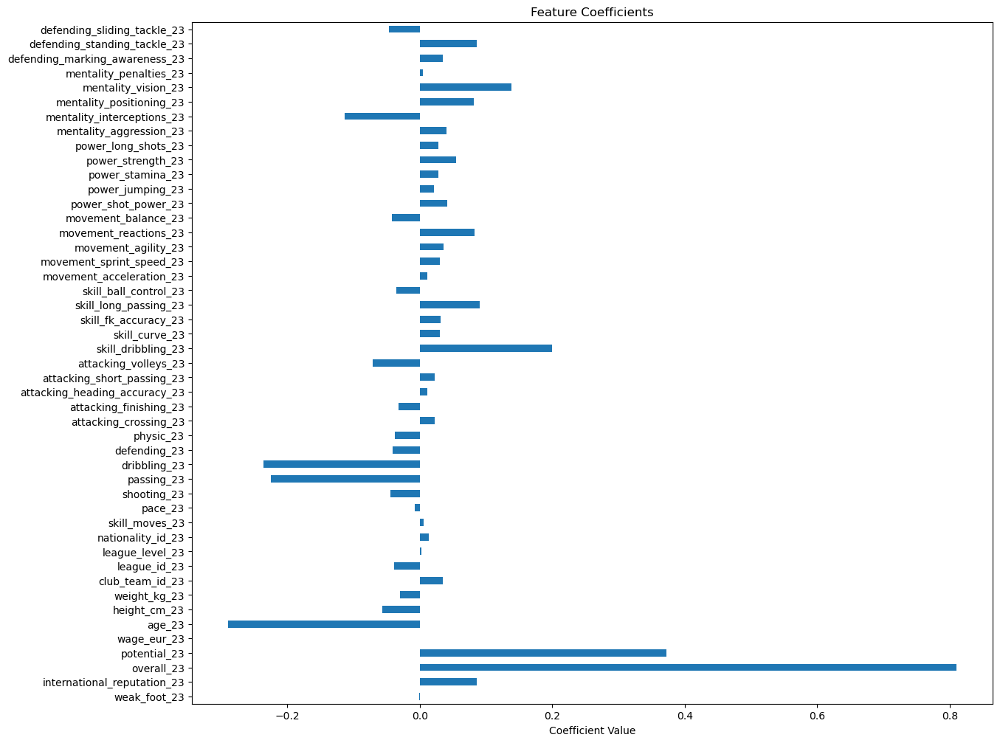

In [150]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler

# Define the chosen features for the model
chosen_features_23_cf = ['weak_foot_23', 'international_reputation_23',
                      'overall_23', 'potential_23', 'wage_eur_23', 'age_23', 'height_cm_23',
                      'weight_kg_23', 'club_team_id_23', 'league_id_23', 'league_level_23',
                      'nationality_id_23', 'skill_moves_23', 'pace_23', 'shooting_23', 'passing_23',
                      'dribbling_23', 'defending_23', 'physic_23', 'attacking_crossing_23',
                      'attacking_finishing_23', 'attacking_heading_accuracy_23',
                      'attacking_short_passing_23', 'attacking_volleys_23',
                      'skill_dribbling_23', 'skill_curve_23', 'skill_fk_accuracy_23',
                      'skill_long_passing_23', 'skill_ball_control_23',
                      'movement_acceleration_23', 'movement_sprint_speed_23',
                      'movement_agility_23', 'movement_reactions_23', 'movement_balance_23',
                      'power_shot_power_23', 'power_jumping_23', 'power_stamina_23',
                      'power_strength_23', 'power_long_shots_23', 'mentality_aggression_23',
                      'mentality_interceptions_23', 'mentality_positioning_23',
                      'mentality_vision_23', 'mentality_penalties_23',
                      'defending_marking_awareness_23', 'defending_standing_tackle_23',
                      'defending_sliding_tackle_23']

# Filter central forwards from the dataset
central_forwards = data[data['player_positions_23'].str.contains('CF|ST')]

# Create a new column for the logarithmic transformation of 'value_eur_24'
central_forwards['log_value_eur_24'] = np.log(central_forwards['value_eur_24'] + 1)

# Fill NaN values with 0
central_forwards = central_forwards.fillna(0)

# Prepare data for Ridge model
X = central_forwards[chosen_features_23_cf]
y = central_forwards['log_value_eur_24']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit the Ridge model
ridge = Ridge(alpha=1.0)
ridge.fit(X_scaled, y)

# Predict values on the entire dataset
central_forwards['predicted_log_value'] = ridge.predict(X_scaled)
central_forwards['predicted_value'] = np.exp(central_forwards['predicted_log_value']) - 1
central_forwards['predicted_value_million'] = central_forwards['predicted_value'] / 1_000_000
central_forwards['actual_value_million'] = central_forwards['value_eur_24'] / 1_000_000
central_forwards['difference_million'] = central_forwards['predicted_value_million'] - central_forwards['actual_value_million']

under_valued_cf = central_forwards[central_forwards['difference_million'] > 0].sort_values(by='difference_million', ascending=False)
over_valued_cf = central_forwards[central_forwards['difference_million'] < 0].sort_values(by='difference_million')

print("Most under-valued Central Forwards:", under_valued_cf[['short_name_23', 'difference_million']])
print("Most over-valued Central Forwards:", over_valued_cf[['short_name_23', 'difference_million']])

# Calculate performance metrics
r2 = r2_score(central_forwards['value_eur_24'], central_forwards['predicted_value'])
rmse = mean_squared_error(central_forwards['value_eur_24'], central_forwards['predicted_value'], squared=False)
mae = mean_absolute_error(central_forwards['value_eur_24'], central_forwards['predicted_value'])

print(f"R-squared: {r2}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")

# Plot the importance of significant features
coefs = pd.Series(ridge.coef_, index=X.columns)
coefs.plot(kind='barh', figsize=(14,12))
plt.xlabel('Coefficient Value')
plt.title('Feature Coefficients')
plt.show()